In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import yfinance as yf
import numba
from numba import njit, prange
import seaborn as sns
from scipy.interpolate import interp1d

In [2]:
pd.set_option('future.no_silent_downcasting', True)
np.random.seed(123)

In [3]:
file_path = 'case_study_data.xlsx'
specific_sheets = pd.read_excel(file_path, sheet_name=['Risky asset', 'ZC yields'])

risky_df = specific_sheets['Risky asset']
yields_df = specific_sheets['ZC yields']

In [4]:
SPY = yf.download('SPY')
SPY = SPY['Adj Close']
SPY = SPY['2002-06-21':'2014-10-30']

[*********************100%***********************]  1 of 1 completed


In [5]:
SPY_ret = SPY.pct_change().dropna()
SPY_mu = SPY_ret.mean()*252
SPY_std = SPY_ret.std()*np.sqrt(252)
SPY_sr = SPY_mu/SPY_std

## Cleaning

In [12]:
yields_df.columns = yields_df.iloc[0]
yields_df = yields_df[2:]
yields_df.set_index('Maturity (years)', inplace=True)
yields_df.index = pd.to_datetime(yields_df.index)
yields_df.index.name = 'Effective date'

C:\Users\utilisateur\anaconda3\Lib\site-packages\pandas\core\indexes\base.py:7588: FutureWarning: Dtype inference on a pandas object (Series, Index, ExtensionArray) is deprecated. The Index constructor will keep the original dtype in the future. Call `infer_objects` on the result to get the old behavior.
  return Index(sequences[0], name=names)


In [14]:
risky_df = risky_df.iloc[1:]
risky_df.set_index('Prices', inplace=True)
risky_df.index = pd.to_datetime(risky_df.index)
risky_df.index.name = 'Date'
risky_df.columns = ['Price']

C:\Users\utilisateur\anaconda3\Lib\site-packages\pandas\core\indexes\base.py:7588: FutureWarning: Dtype inference on a pandas object (Series, Index, ExtensionArray) is deprecated. The Index constructor will keep the original dtype in the future. Call `infer_objects` on the result to get the old behavior.
  return Index(sequences[0], name=names)


In [16]:
# Ensure maturities are a float array
maturities = yields_df.columns.astype(float)

# Reshape maturities to be broadcasted correctly across rows of yields_df
maturities = maturities.values.reshape(-1, 1)  # Reshape to (n_columns, 1)

# Calculate bond prices for zero-coupon bonds: P(t, T) = 1 / (1 + r)^T
prices_array = 1 / ((1 + yields_df.values) ** maturities.T)  # T is transposed to match the shape of yields_df

# Convert to a DataFrame with the same structure as yields_df
prices_df = pd.DataFrame(prices_array, columns=yields_df.columns, index=yields_df.index)

# Optional: Rename columns to indicate they are prices
prices_df.columns = [f"Price_{col}" for col in prices_df.columns]

# Output the bond prices DataFrame
prices_df

,Price_0.0,Price_1.0,Price_2.0,Price_3.0,Price_4.0,Price_5.0,Price_6.0,Price_7.0,Price_8.0,Price_9.0,...,Price_21.0,Price_22.0,Price_23.0,Price_24.0,Price_25.0,Price_26.0,Price_27.0,Price_28.0,Price_29.0,Price_30.0
Effective date,,,,,,,,,,,,,,,,,,,,,
2014-10-31,1.0,0.998477,0.989316,0.970959,0.947001,0.920399,0.892850,0.865184,0.837790,0.810831,...,0.533967,0.515051,0.496759,0.479079,0.461995,0.445500,0.429559,0.414183,0.399334,0.385018
2014-11-03,1.0,0.998372,0.989025,0.970400,0.946276,0.919652,0.892167,0.864621,0.837351,0.810518,...,0.534555,0.515689,0.497446,0.479815,0.462791,0.446332,0.430448,0.415106,0.400300,0.386015
2014-11-04,1.0,0.998563,0.989066,0.970411,0.946380,0.919910,0.892608,0.865250,0.838170,0.811523,...,0.537253,0.518482,0.500330,0.482773,0.465797,0.449403,0.433569,0.418272,0.403508,0.389249
2014-11-05,1.0,0.998446,0.988872,0.970201,0.946198,0.919743,0.892414,0.864977,0.837764,0.810960,...,0.535799,0.517089,0.499003,0.481527,0.464635,0.448339,0.432583,0.417387,0.402715,0.388548
2014-11-06,1.0,0.998321,0.988473,0.969400,0.945008,0.918216,0.890598,0.862892,0.835440,0.808390,...,0.531568,0.512813,0.494691,0.477187,0.460285,0.443976,0.428224,0.413027,0.398370,0.384225
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-10-28,1.0,0.959048,0.922818,0.887713,0.852972,0.818557,0.784603,0.751264,0.718679,0.686951,...,0.387922,0.369682,0.352348,0.335868,0.320214,0.305355,0.291240,0.277846,0.265130,0.253056
2024-10-29,1.0,0.959156,0.923027,0.887956,0.853192,0.818722,0.784693,0.751269,0.718602,0.686796,...,0.387767,0.369588,0.352317,0.335914,0.320336,0.305545,0.291511,0.278188,0.265542,0.253543
2024-10-30,1.0,0.958993,0.922212,0.886772,0.851891,0.817461,0.783568,0.750346,0.717912,0.686376,...,0.390227,0.372194,0.355046,0.338738,0.323250,0.308528,0.294550,0.281272,0.268658,0.256680


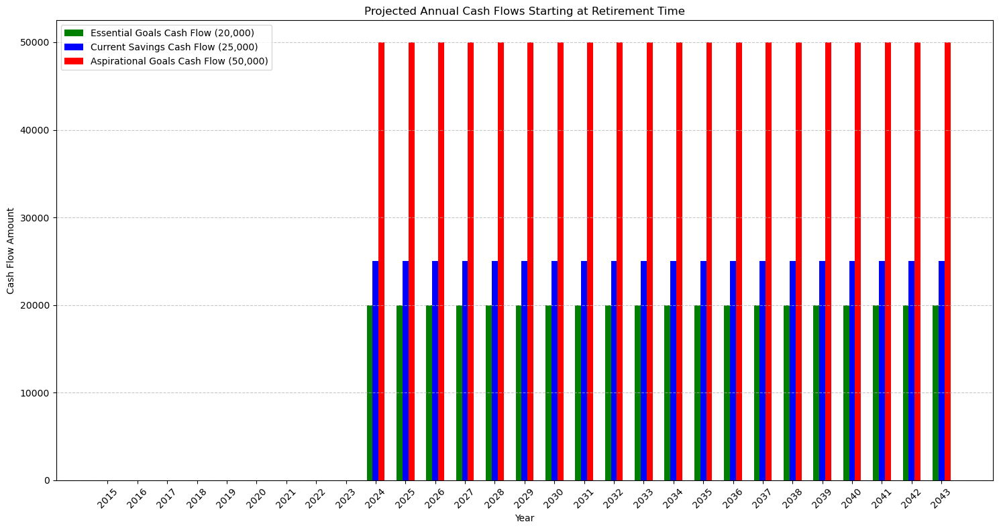

In [18]:
# Set the starting and ending date for the plot
start_date = pd.to_datetime('2014-10-31')
end_date = pd.to_datetime('2043-11-01')
dates = pd.date_range(start=start_date, end=end_date, freq='YS')  # 'YS' for year start

# Ensure we have exactly 20 years (60 bars: 20 years × 3 cash flow types)
if len(dates) > 20:
    dates = dates[:30]
elif len(dates) < 20:
    dates = pd.date_range(start=start_date, periods=20, freq='YS')

# Cash flow amounts
cash_flow_savings = 25000
cash_flow_essential = 20000
cash_flow_aspirational = 50000

# Initialize cash flows array for each type
cash_flows_savings = np.zeros(len(dates))
cash_flows_essential = np.zeros(len(dates))
cash_flows_aspirational = np.zeros(len(dates))

# Assign cash flows starting from 2024
cash_flows_essential[dates.year >= 2024] = cash_flow_essential
cash_flows_savings[dates.year >= 2024] = cash_flow_savings
cash_flows_aspirational[dates.year >= 2024] = cash_flow_aspirational

# Plotting as side-by-side bars
plt.figure(figsize=(15, 8))

# Define the width of each bar
bar_width = 0.2  # Width of each individual bar

# Calculate the positions for each bar group
positions = np.arange(len(dates))  # Positions for the years

# Plot each cash flow type side by side
plt.bar(positions- bar_width, cash_flows_essential, width=bar_width, color='g', label='Essential Goals Cash Flow (20,000)')
plt.bar(positions, cash_flows_savings, width=bar_width, color='b', label='Current Savings Cash Flow (25,000)')
plt.bar(positions + bar_width, cash_flows_aspirational, width=bar_width, color='r', label='Aspirational Goals Cash Flow (50,000)')

# Formatting
plt.title('Projected Annual Cash Flows Starting at Retirement Time')
plt.xlabel('Year')
plt.ylabel('Cash Flow Amount')
plt.grid(True, axis='y', linestyle='--', alpha=0.7)  # Add gridlines for better readability

# Set x-axis ticks and labels
plt.xticks(positions, [date.strftime('%Y') for date in dates], rotation=45)
plt.tight_layout()

# Show the plot
plt.legend()
plt.show()

In [20]:
biggest_period_index = yields_df.index

## Simulations

### PSP

#### S&P500

In [25]:
def identity(x):
    return x

def heston_simulate(rate: float, sharpe_ratio: float, initial_price: float,
                    kappa: float, lt_var: float, vol_var: float, initial_var: float, rho: float,
                    n_paths: int, time_step: float, n_periods: int,
                    rng: np.random.Generator,
                    transform=identity):
    """
    Simulate paths for price and volatility under the Heston model.
    Note that this function has a side effect because it changes the state of the random number generator.
    """
    
    logS = np.empty((n_periods + 1, n_paths))  # Pre-allocate log prices
    V = np.empty((n_periods + 1, n_paths))  # Pre-allocate variances
    
    logS[0, :] = np.log(initial_price)  # Initial log price
    V[0, :] = initial_var  # Initial variance
    
    loading2 = np.sqrt(1 - rho**2)
    
    for i in range(1, n_periods + 1):
        std_innov1 = rng.standard_normal(n_paths)  # Standard normal innovations
        std_innov2 = rng.standard_normal(n_paths)
        
        sigma = np.sqrt(np.maximum(V[i - 1, :], 0))  # Ensure non-negative volatility
        
        logS[i, :] = logS[i - 1, :] + (rate + sharpe_ratio * sigma - 0.5 * V[i - 1, :]) * time_step \
            + sigma * np.sqrt(time_step) * std_innov1
            
        V[i, :] = V[i - 1, :] + kappa * (lt_var - V[i - 1, :]) * time_step \
            + vol_var * sigma * np.sqrt(time_step) * (rho * std_innov1 + loading2 * std_innov2)
            
        V[i, :] = transform(np.maximum(V[i, :], 0))  # Ensure variance is non-negative
    
    S = np.exp(logS)  # Convert log prices back to prices
    
    return {'price': S, 'volatility': np.sqrt(V)}

In [75]:
rate = float(SPY_mu.iloc[0])
initial_price = risky_df.iloc[0].astype(int)
sharpe_ratio = float(SPY_sr.iloc[0])
kappa = 5.07
vol_var = .48
lt_var = float(SPY_std.iloc[0]**2)
initial_var = lt_var
rho = -.7670
n_paths = 100
time_step = 1 / 252
n_periods = len(risky_df)-1

rng = np.random.default_rng(seed=123)

SV = heston_simulate(rate, sharpe_ratio, initial_price,
                     kappa, lt_var, vol_var, initial_var, rho,
                     n_paths, time_step, n_periods,
                     rng)

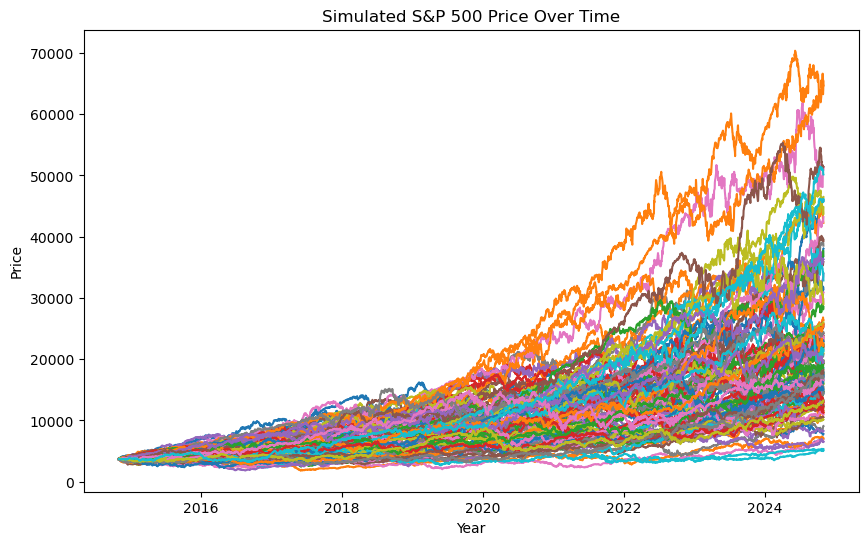

In [29]:
time= risky_df.index
plt.figure(figsize=(10, 6))
plt.plot(time, SV['price'])
plt.title("Simulated S&P 500 Price Over Time")
plt.xlabel("Year")
plt.ylabel("Price")
plt.show()

In [31]:
SV['price'][-1].mean()

22565.152713856296

In [77]:
SV_ret = pd.DataFrame(SV['price']).pct_change().dropna()
SV_mu = SV_ret.mean()*252
SV_std = SV_ret.std()*np.sqrt(252)
SV_sr = SV_mu/SV_std

In [79]:
# Compute cumulative returns
SV_cum_returns = (1 + SV_ret).cumprod()

# Compute rolling maximum
SV_rolling_max = SV_cum_returns.cummax()

# Compute drawdown
SV_drawdown = (SV_cum_returns - SV_rolling_max) / SV_rolling_max

# Compute Maximum Drawdown
SV_max_drawdown = SV_drawdown.min()

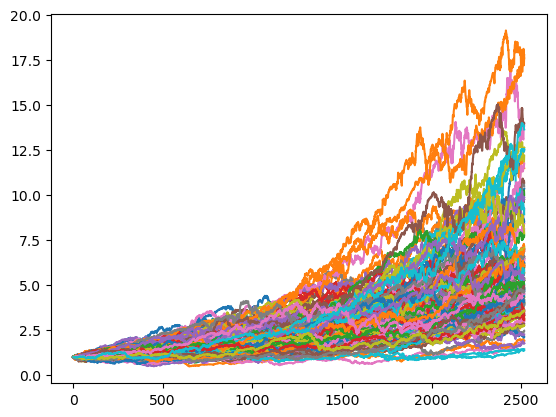

In [81]:
plt.plot(SV_cum_returns)
plt.show()

In [70]:
SV_max_drawdown.mean()

-0.3703073215563084

In [37]:
simulated_risky_ret_daily = pd.DataFrame(SV['price']).set_index(risky_df.index)
simulated_risky_ret_weekly = simulated_risky_ret_daily.resample('W').ffill().pct_change().dropna()
simulated_risky_ret_monthly = simulated_risky_ret_daily.resample('ME').ffill().pct_change().dropna()
simulated_risky_ret_daily = simulated_risky_ret_daily.pct_change().dropna()

In [39]:
# Get final values of each path (last column)
final_values = SV['price'][-1]  # Shape: (n_paths,)

# Compute the mean final value
mean_final_value = np.mean(final_values)

In [41]:
# Compute absolute differences between each path's final value and the mean final value
differences = np.abs(final_values - mean_final_value)

# Select the index of the path with the smallest difference
best_path_index = np.argmin(differences)

# Extract the best path
best_path = SV['price'].T[best_path_index]

In [43]:
simulated_risky_ret_daily_best_path = pd.DataFrame(best_path).pct_change().dropna()
simulated_risky_ret_daily_best_path = simulated_risky_ret_daily_best_path.set_index(risky_df[1:].index)
simulated_risky_ret_weekly_best_path = simulated_risky_ret_daily.resample('W').ffill().pct_change().dropna()
simulated_risky_ret_monthly_best_path = simulated_risky_ret_daily.resample('ME').ffill().pct_change().dropna()

#### Factor Investing

### LHP

In [47]:
# Vasicek parameters
lambda_r = 0.23
kappa = 0.13  # Mean reversion speed (a)
sigma = 0.0098  # Volatility
theta = 0.0302 + ((lambda_r * sigma) / kappa)  # Long-term mean interest rate (b)

# Load yield data (Assuming 'yields_df' is given with dates as index and maturities as columns)
yields_df = yields_df.sort_index()  # Ensure sorted by date
yields_df_sim = yields_df.iloc[:, 1:]  # Exclude the first column (assuming it's a non-numeric index)

# Extract dates and maturities
dates = yields_df_sim.index
maturities = yields_df_sim.columns.astype(float)  # Convert maturities to numeric
n_days = len(yields_df_sim)  # Number of days in simulation
n_simulations = 100  # Number of Monte Carlo simulations
n_maturities = len(maturities)  # Number of maturities

# Extract initial yield curve
initial_yield_curve = yields_df_sim.iloc[0].values  # Extract full term structure
initial_short_rate = initial_yield_curve[0]  # Use the shortest-maturity yield as r_0

# Precompute constants for Vasicek bond price formula
B_T = (1 - np.exp(-kappa * maturities)) / kappa
A_T = np.exp((theta - (sigma ** 2 / (2 * kappa ** 2))) * (B_T - maturities) - (sigma ** 2 / (4 * kappa)) * B_T ** 2)
#A_T = (theta - (sigma ** 2 / (2 * kappa ** 2))) * (B_T - maturities) + (sigma ** 2 / (4 * kappa)) * B_T ** 2

# Vectorized time differences (dt)
dt = dates.to_series().diff().dt.days.fillna(1) / 252  # Convert days to year fractions, replace NaN with 1 day
dt = dt.to_numpy()  # Convert to NumPy array

# Vectorized random shock generation for the entire simulation
random_shocks = np.random.normal(size=(n_simulations, n_days - 1))  # One shock per day

# Initialize arrays to store rates
r_t_all = np.full((n_simulations, n_days), initial_short_rate)

# **Vectorized Vasicek Evolution**
for i in range(1, n_days):
    Z = random_shocks[:, i - 1]  # Use precomputed random shocks
    r_t_all[:, i] = (
        r_t_all[:, i - 1] + kappa * (theta - r_t_all[:, i - 1]) * dt[i]
        + sigma * np.sqrt(dt[i]) * Z
    )
    r_t_all[:, i] = np.maximum(r_t_all[:, i], 0)  # Ensure non-negative rates

# Reshape A_T and B_T for proper broadcasting with r_t_all
A_T_reshaped = np.expand_dims(A_T, axis=(0, 1))  # Shape: (1, 1, n_maturities)
B_T_reshaped = np.expand_dims(B_T, axis=(0, 1))  # Shape: (1, 1, n_maturities)

# Compute bond prices
P_t_T_all = A_T_reshaped * np.exp(-B_T_reshaped * r_t_all[:, :, np.newaxis])
#P_t_T_all = np.exp(-A_T_reshaped - B_T_reshaped * r_t_all[:, :, np.newaxis])


# Reshape maturities for broadcasting
maturities_reshaped = np.expand_dims(maturities, axis=(0, 1))  # Shape: (1, 1, n_maturities)

# Convert Bond Prices to Yields
simulated_yields_all = np.maximum(-np.log(P_t_T_all) / maturities_reshaped, 0)

# Compute Averages Across Simulations
average_bond_prices = P_t_T_all.mean(axis=0)  # Mean across simulations (shape: (n_days, n_maturities))
average_yield_curve = simulated_yields_all.mean(axis=0)  # Mean across simulations (shape: (n_days, n_maturities))

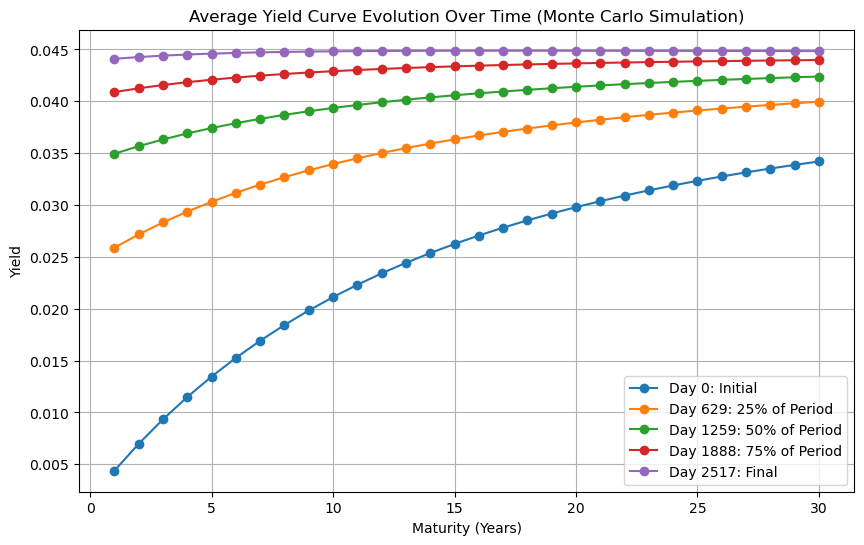

In [49]:
# Select time points for plotting (e.g., first, middle, and last point in time)
plot_indices = [0, simulated_yields_all.shape[1] // 4, simulated_yields_all.shape[1] // 2, 3 * simulated_yields_all.shape[1] // 4, simulated_yields_all.shape[1] - 1]
plot_labels = ["Initial", "25% of Period", "50% of Period", "75% of Period", "Final"]

# Plot the yield curve evolution for these time points
plt.figure(figsize=(10, 6))
for idx, label in zip(plot_indices, plot_labels):
    # For each selected index, extract the yield curve at that time point (mean across simulations)
    yield_curve_at_time = simulated_yields_all[:, idx, :].mean(axis=0)
    plt.plot(maturities, yield_curve_at_time, marker='o', label=f"Day {idx}: {label}")

plt.xlabel("Maturity (Years)")
plt.ylabel("Yield")
plt.title("Average Yield Curve Evolution Over Time (Monte Carlo Simulation)")
plt.legend()
plt.grid(True)
plt.show()

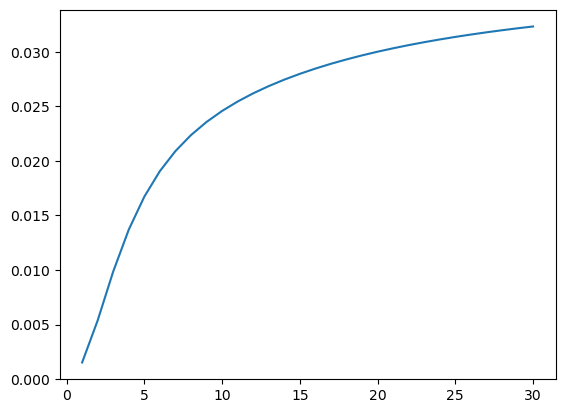

In [51]:
plt.plot(yields_df.iloc[0,1:])

#### CMB

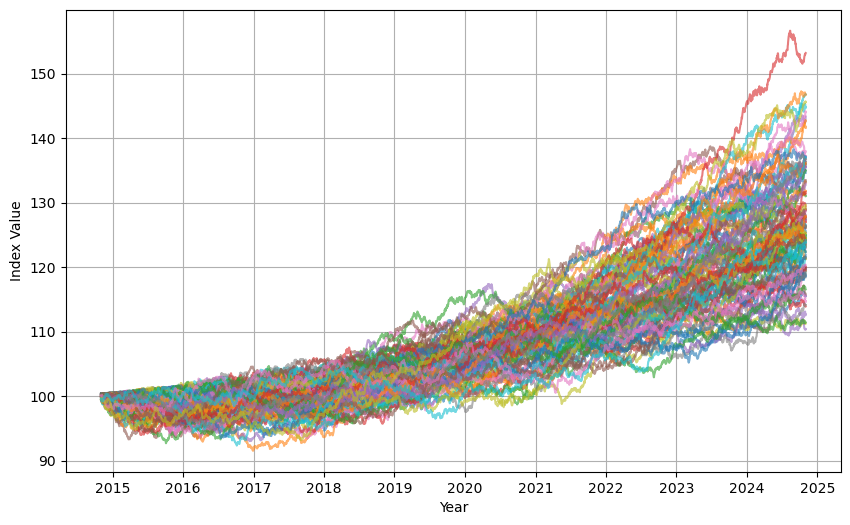

In [87]:
cmb_indices = []  # Store cumulative bond indices for each simulation

dt = 1 / 252  # Time step as a fraction of the year (assuming 252 trading days)

for sim in range(n_simulations):
    # Extract 3-year discount bond prices for the given simulation
    bond_prices = P_t_T_all[sim, :, 2]  
    
    # Shift prices forward by one day to compute daily price changes
    bond_prices_shifted = np.roll(bond_prices, shift=-1, axis=0)
    bond_prices_shifted[-1] = np.nan  # Avoid incorrect last value
    
    # Compute relative price changes
    price_change = (bond_prices_shifted - bond_prices) / bond_prices  # Element-wise
    
    # Extract 3-year bond yields
    yields_3y = simulated_yields_all[sim, :, 2]
    
    # Compute interest accrual
    interest_accrual = yields_3y * dt
    
    # Compute total return: price change + interest accrual
    total_return = price_change + interest_accrual
    
    # Drop NaN values (from last shift operation)
    total_return = pd.Series(total_return).dropna().values  # Ensure it's a NumPy array
    
    # Compute the cumulative bond index (starting value = 100)
    cmb_index = np.cumprod(1 + total_return) * 100  # Element-wise cumulative product
    
    # Append result
    cmb_indices.append(cmb_index)

# Set the index of cmb_indices to match the index of yields_df[30]
cmb_indices_df = pd.DataFrame(cmb_indices).T

# Set the index to be the same as yields_df[30].index
cmb_indices_df.index = yields_df[1:].index

# Plot the 3-year Constant Maturity Bond Index for all simulations
plt.figure(figsize=(10, 6))
for sim in range(n_simulations):
    plt.plot(cmb_indices_df[sim], alpha=0.6)

#plt.title("3-year Constant Maturity Bond Index (base 100)")
plt.xlabel("Year")
plt.ylabel("Index Value")
plt.grid(True)
plt.show()

In [97]:
0.012*np.sqrt(252)

0.19049409439665055

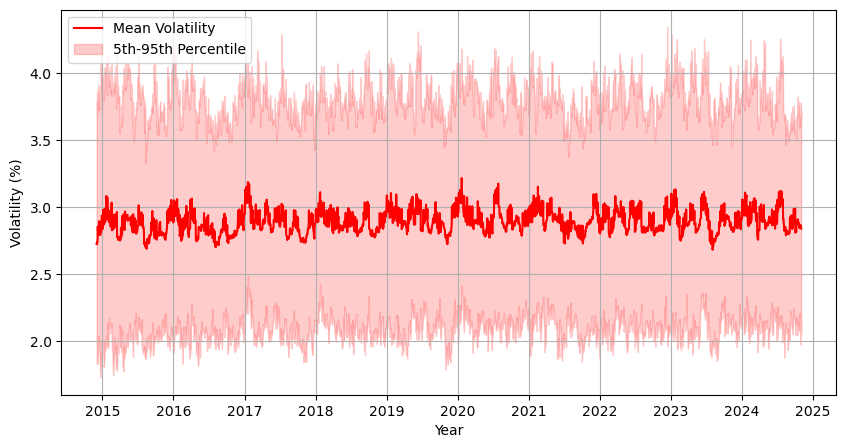

In [839]:
# --- Step 1: Convert CMB Indices to NumPy Array ---
cmb_indices_array = np.array(cmb_indices)  # Shape: (n_simulations, num_days)

# --- Step 2: Compute Log Returns ---
log_returns_cmb = np.log(cmb_indices_array[:, 1:] / cmb_indices_array[:, :-1])  # Shape: (n_simulations, num_days-1)

# --- Step 3: Compute Rolling Volatility (21-day window) for Each Simulation ---
window_size = 21
volatility_cmb = np.array([
    np.std(log_returns_cmb[:, i - window_size + 1 : i], axis=1, ddof=1) * np.sqrt(252)  
    for i in range(window_size - 1, log_returns_cmb.shape[1])
])  # Shape: (num_days - window_size + 1, n_simulations)

# Transpose to store volatility for all simulations correctly
volatility_cmb = volatility_cmb.T  # Shape: (n_simulations, num_days - window_size + 1)

# --- Step 4: Convert to DataFrame for Plotting (if needed) ---
volatility_cmb_df = pd.DataFrame(volatility_cmb.T, index=biggest_period_index[window_size+1:])

# --- Step 5: Compute Mean and Percentiles ---
vol_mean_cmb = volatility_cmb_df.mean(axis=1)  # Mean volatility
vol_5th_cmb = volatility_cmb_df.quantile(0.05, axis=1)  # 5th percentile
vol_95th_cmb = volatility_cmb_df.quantile(0.95, axis=1)  # 95th percentile

# --- Step 6: Plot the Mean with Shaded Region for 5th-95th Percentile ---
plt.figure(figsize=(10, 5))
plt.plot(vol_mean_cmb*100, color='r', label="Mean Volatility")  # Mean as a solid line
plt.fill_between(vol_mean.index, vol_5th_cmb*100, vol_95th_cmb*100, color='r', alpha=0.2, label="5th-95th Percentile")  # Shaded region

# Formatting the Plot
plt.xlabel("Year")
plt.ylabel("Volatility (%)")
#plt.title("")
plt.legend()
plt.grid(True)

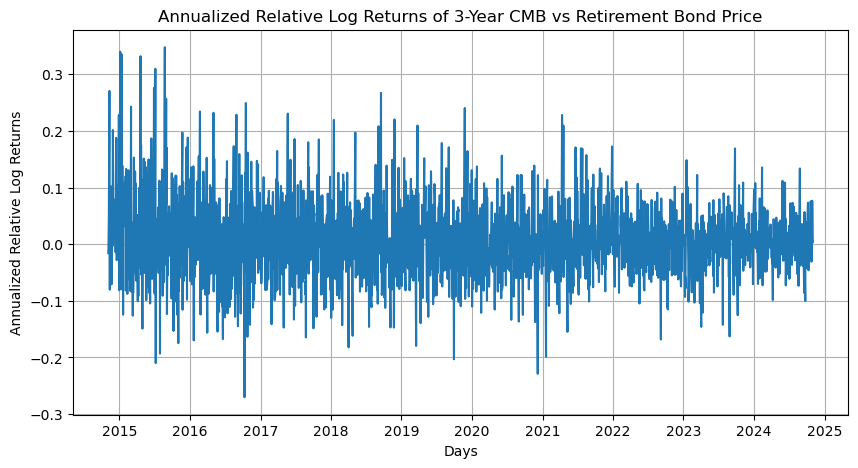

In [831]:
window_size = 21  # Rolling window size (e.g., 21 days)

pv_fix = pd.DataFrame(essential_goals_pv.T[1:]).set_index(biggest_period_index[1:])

# --- Step 1: Compute Log Returns ---
log_returns_cmb = np.log(cmb_indices_df / cmb_indices_df.shift(1)).dropna()
log_returns_pv = np.log(pv_fix / pv_fix.shift(1)).dropna()

# --- Step 2: Compute the Difference in Mean Log Returns ---
log_returns_cmb_combined = (log_returns_cmb.mean(axis=1) - log_returns_pv.mean(axis=1)) * 252  # Annualization

# --- Step 3: Plot the Results ---
plt.figure(figsize=(10, 5))
plt.plot(log_returns_cmb_combined)

# Formatting the Plot
plt.xlabel("Days")
plt.ylabel("Annualized Relative Log Returns")
plt.title("Annualized Relative Log Returns of 3-Year CMB vs Retirement Bond Price")
plt.grid(True)

# Show the Plot
plt.show()

In [835]:
log_returns_pv

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
Effective date,,,,,,,,,,,,,,,,,,,,,
2014-11-04,-0.000106,0.003150,0.003445,-0.006047,-0.002108,0.002351,-0.000638,-0.006029,-0.000189,0.002087,...,-0.008147,-0.004382,-0.000138,-0.001064,0.002383,-0.002449,-0.001726,0.004381,0.007067,-0.005197
2014-11-05,-0.003517,-0.003153,-0.003600,-0.000085,-0.008993,0.005181,-0.002947,-0.003083,0.000397,-0.003483,...,-0.004560,-0.000372,-0.002552,0.005672,0.000437,0.001109,0.002042,0.008448,0.003411,0.004148
2014-11-06,0.000342,0.004549,0.002177,0.012363,0.003825,-0.004298,0.001408,-0.000709,0.004357,-0.001339,...,-0.002708,0.000161,0.002500,0.001003,-0.007024,0.000483,0.000158,0.004987,0.002481,0.000316
2014-11-07,-0.000371,-0.000511,-0.003147,0.000158,-0.005737,-0.003438,0.005166,-0.004823,-0.002937,0.003695,...,-0.003776,-0.002345,-0.003870,-0.006609,-0.004374,-0.000438,0.000158,0.004366,0.004459,0.006424
2014-11-10,0.003478,-0.003108,-0.007565,-0.014201,-0.000415,-0.004321,0.000733,-0.020976,-0.002219,0.004811,...,0.008690,0.006040,0.002685,0.002077,-0.006820,-0.001851,0.000158,0.000158,0.000158,-0.004736
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-10-28,-0.008210,0.001259,-0.000172,-0.002869,-0.001651,0.000543,0.002246,-0.007556,-0.003406,0.004431,...,-0.006407,0.006584,-0.003098,0.005638,0.002159,-0.001178,-0.001711,-0.009170,-0.008258,-0.005181
2024-10-29,-0.001493,-0.003191,-0.005728,0.001626,-0.002824,0.003545,0.002728,0.001151,-0.005659,0.002844,...,0.003974,0.002784,0.000565,-0.004998,-0.005093,0.003220,-0.004249,0.003730,-0.000194,-0.004736
2024-10-30,-0.000843,-0.000586,-0.006066,-0.000219,-0.002346,-0.004617,-0.000827,0.000174,-0.000635,-0.003632,...,0.003360,0.002298,0.003520,0.000362,0.002542,0.000649,0.002127,0.000202,-0.001507,-0.003740


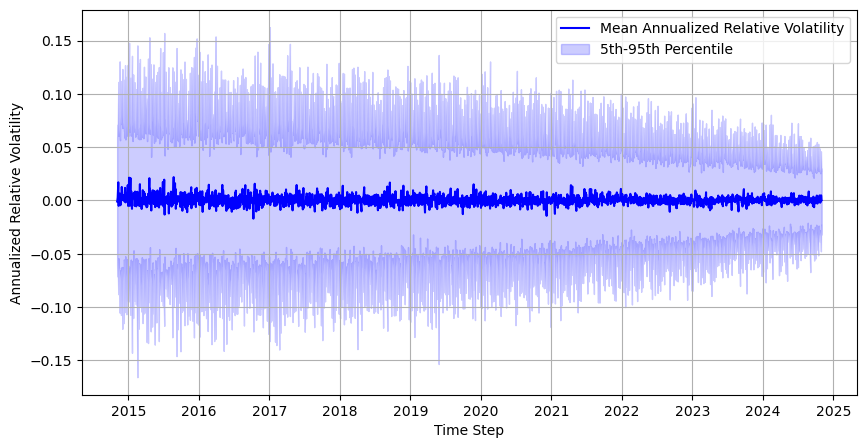

In [841]:
# Ensure log_returns_pv has the same shape as log_returns_cmb
log_returns_pv_T = log_returns_pv.T  # Now shape (100, 2516), same as log_returns_cmb

# Compute volatility for EACH simulation over time
log_returns_cmb_combined_std = (log_returns_cmb - log_returns_pv_T) * np.sqrt(252)  # Keep shape (100, 2516)

# Compute statistics across simulations (axis=0 for all simulations at each time step)
mean_volatility = log_returns_cmb_combined_std.mean(axis=0)  # Mean across simulations (shape: 2516,)
lower_bound = np.percentile(log_returns_cmb_combined_std, 5, axis=0)  # 5th percentile
upper_bound = np.percentile(log_returns_cmb_combined_std, 95, axis=0)  # 95th percentile

# --- Step 3: Plot the Results ---
plt.figure(figsize=(10, 5))
plt.plot(log_returns_pv.index, mean_volatility, label="Mean Annualized Relative Volatility", color="blue")
plt.fill_between(log_returns_pv.index, lower_bound, upper_bound, color="blue", alpha=0.2, label="5th-95th Percentile")

# Formatting the Plot
plt.xlabel("Time Step")
plt.ylabel("Annualized Relative Volatility")
plt.legend()
plt.grid(True)

# Show the Plot
plt.show()

In [445]:
store = []
cmb_index_all = []
for i in range(n_simulations):
    store.append(np.array(cmb_indices[i])[-1])  # Store the last value of each index series
    cmb_index_all.append(np.array(cmb_indices[i]))

store_mean = np.mean(store)  # Compute the mean AFTER the loop
cmb_index_all = pd.DataFrame(cmb_index_all).T

print(store_mean)

125.5059802656887


In [87]:
simulated_safe_ret_daily = pd.DataFrame(cmb_indices_df).pct_change().dropna()
simulated_safe_ret_weekly = cmb_indices_df.resample('W').ffill().pct_change().dropna()
simulated_safe_ret_monthly = cmb_indices_df.resample('ME').ffill().pct_change().dropna()

##### Old Versions - Vasicek + CMB

In [55]:
# # Vasicek parameters
# lambda_r = -0.53
# kappa = 0.08  # Mean reversion speed (a)
# sigma = 0.0098  # Volatility
# theta = 0.0302 + ((lambda_r * sigma) / kappa)  # Long-term mean interest rate (b)

# # Load yield data (Assuming 'yields_df' is given with dates as index and maturities as columns)
# yields_df = yields_df.sort_index()  # Ensure it's sorted by date
# yields_df_sim = yields_df.iloc[:, 1:]  # Exclude the first column

# dates = yields_df_sim.index
# maturities = yields_df_sim.columns.astype(float)  # Convert maturities to numeric
# n_days = len(yields_df_sim)  # Number of days in simulation
# n_simulations = 10  # Number of Monte Carlo simulations

# # Extract initial yield curve (excluding first column)
# initial_yield_curve = yields_df_sim.iloc[0].values

# # Initialize bond prices for the first time step
# initial_bond_prices = prices_df.iloc[0, 1:].values  # First bond prices from 'prices_df'

# # Precompute constants for Vasicek bond price formula
# B_T = (1 - np.exp(-kappa * maturities)) / kappa
# A_T = (theta - (sigma ** 2 / (2 * kappa ** 2))) * (B_T - maturities) + (sigma ** 2 / (4 * kappa)) * B_T ** 2

# # Vectorized random shock generation for the entire simulation
# random_shocks = np.random.normal(size=(n_simulations, n_days - 1))

# # Assuming 'dates' is initially in numpy ndarray form (not pandas DatetimeIndex)
# # Convert it to a pandas DatetimeIndex
# dates = pd.to_datetime(dates)

# # Precompute time differences (dt) once for all days (vectorized)
# dt = (dates[1:] - dates[:-1]).days / 252  # Convert days to year fractions
# dt = np.concatenate(([1], dt))  # Set dt[0] = 1 for the first step

# # Initialize arrays to store bond prices and yields
# simulated_yields_all = np.zeros((n_simulations, n_days, len(maturities)))
# bond_prices_all_simulations = np.zeros((n_simulations, n_days, len(maturities)))

# # Initialize the first time step (t=0)
# simulated_yields_all[:, 0, :] = initial_yield_curve  # First yield curve is actual data
# bond_prices_all_simulations[:, 0, :] = initial_bond_prices  # First bond prices

# # Monte Carlo simulations
# for sim in range(n_simulations):
#     # Initialize the path for the current simulation
#     r_t = initial_yield_curve[0]  # Use the first maturity as the initial short rate
#     simulated_yields = np.zeros((n_days, len(maturities)))  # Store one simulation path
#     simulated_yields[0] = initial_yield_curve  # First yield curve is actual data
    
#     bond_prices_for_simulation = np.zeros((n_days, len(maturities)))  # Store bond prices for simulation
#     bond_prices_for_simulation[0] = initial_bond_prices  # First bond prices

#     # Monte Carlo simulation loop (optimized to use vectorized operations)
#     for i in range(1, n_days):
#         Z = random_shocks[sim, i - 1]  # Use precomputed random shock
#         r_t = r_t + kappa * (theta - r_t) * dt[i] + sigma * np.sqrt(dt[i]) * Z  # Vasicek evolution
        
#         # Ensure non-negative interest rates
#         r_t = np.maximum(r_t, 0)

#         # Compute bond prices using precomputed constants
#         P_t_T = np.exp(-A_T - B_T * r_t)
#         bond_prices_for_simulation[i] = P_t_T

#         # Compute yields for all maturities
#         simulated_yields[i] = np.maximum(-np.log(P_t_T) / maturities, 0.0001)  # Convert to yield curve

#     # Store bond prices and yields for this simulation
#     simulated_yields_all[sim] = simulated_yields
#     bond_prices_all_simulations[sim] = bond_prices_for_simulation

# # Compute the average bond prices across all simulations and all time steps
# average_bond_prices = bond_prices_all_simulations.mean(axis=0)  # Mean across simulations (axis 0)

# # Compute the average yield curve across simulations
# average_yield_curve = simulated_yields_all.mean(axis=0)

In [57]:
# # Vasicek parameters
# lambda_r = -0.53
# kappa = 0.13  # Mean reversion speed (a)
# sigma = 0.0098  # Volatility
# theta = 0.0302 + ((lambda_r * sigma) / kappa)  # Long-term mean interest rate (b)

# # Load yield data (Assuming 'yields_df' is given with dates as index and maturities as columns)
# yields_df = yields_df.sort_index()  # Ensure it's sorted by date
# yields_df_sim = yields_df.iloc[:, 1:]  # Exclude the first column

# dates = yields_df_sim.index
# maturities = yields_df_sim.columns.astype(float)  # Convert maturities to numeric
# n_days = len(yields_df_sim)  # Number of days in simulation
# n_simulations = 10  # Number of Monte Carlo simulations

# # Extract initial yield curve (excluding first column)
# initial_yield_curve = yields_df_sim.iloc[0].values

# # Initialize bond prices for the first time step
# initial_bond_prices = prices_df.iloc[0, 1:].values  # First bond prices from 'prices_df'

# # Precompute constants for Vasicek bond price formula
# B_T = (1 - np.exp(-kappa * maturities)) / kappa
# A_T = (theta - (sigma ** 2 / (2 * kappa ** 2))) * (B_T - maturities) + (sigma ** 2 / (4 * kappa)) * B_T ** 2

# # Vectorize random shock generation for the entire simulation
# random_shocks = np.random.normal(size=(n_simulations, n_days - 1))

# # Initialize arrays to store bond prices and yields
# simulated_yields_all = np.zeros((n_simulations, n_days, len(maturities)))
# bond_prices_all_simulations = np.zeros((n_simulations, n_days, len(maturities)))

# # Monte Carlo simulations
# for sim in range(n_simulations):
#     r_t = initial_yield_curve[0]  # Use the first maturity as the initial short rate
#     simulated_yields = np.zeros((n_days, len(maturities)))  # Store one simulation path
#     simulated_yields[0] = initial_yield_curve  # First yield curve is actual data
    
#     bond_prices_for_simulation = np.zeros((n_days, len(maturities)))  # Store bond prices for simulation
#     bond_prices_for_simulation[0] = initial_bond_prices  # First bond prices

#     for i in range(1, n_days):
#         dt = (dates[i] - dates[i - 1]).days / 252  # Convert days to year fraction
#         Z = random_shocks[sim, i - 1]  # Use precomputed random shock
#         r_t = r_t + kappa * (theta - r_t) * dt + sigma * np.sqrt(dt) * Z  # Vasicek evolution
        
#         # Ensure non-negative interest rates
#         r_t = max(r_t, 0)

#         # Compute bond prices using precomputed constants
#         P_t_T = np.exp(-A_T - B_T * r_t)
#         bond_prices_for_simulation[i] = P_t_T

#         # Compute yields for all maturities
#         simulated_yields[i] = np.maximum(-np.log(P_t_T) / maturities, 0.0001)  # Convert to yield curve

#     # Store bond prices and yields for this simulation
#     simulated_yields_all[sim] = simulated_yields
#     bond_prices_all_simulations[sim] = bond_prices_for_simulation

# # Compute the average bond prices across all simulations and all time steps
# average_bond_prices = bond_prices_all_simulations.mean(axis=0)  # Mean across simulations (axis 0)

# # Compute the average yield curve across simulations
# average_yield_curve = simulated_yields_all.mean(axis=0)

# # You can now process the average bond prices and yields for further analysis

In [59]:
# # Vasicek parameters
# lambda_r = -0.53
# kappa = 0.08  # Mean reversion speed (a)
# sigma = 0.0098  # Volatility
# theta = 0.0302 + ((lambda_r * sigma) / kappa)  # Long-term mean interest rate (b)

# # Load yield data (Assuming 'yields_df' is given with dates as index and maturities as columns)
# yields_df = yields_df.sort_index()  # Ensure it's sorted by date
# yields_df_sim = yields_df.iloc[:, 1:]  # Exclude the first column

# dates = yields_df_sim.index
# maturities = yields_df_sim.columns.astype(float)  # Convert maturities to numeric
# n_days = len(yields_df_sim)  # Number of days in simulation
# n_simulations = 10  # Number of Monte Carlo simulations

# # Initialize 3D array to store simulated yield curves for all simulations
# simulated_yields_all = np.zeros((n_simulations, n_days, len(maturities)))

# # List to store bond prices for all simulations and time steps
# bond_prices_all_simulations = []  # Initialize as empty list

# # Extract initial yield curve (excluding first column)
# initial_yield_curve = yields_df_sim.iloc[0].values

# # Initialize bond prices for the first time step
# initial_bond_prices = prices_df.iloc[0, 1:].values  # First bond prices from 'prices_df'

# # Monte Carlo simulations
# for sim in range(n_simulations):
#     r_t = initial_yield_curve[2] # Use the first maturity as the initial short rate
#     simulated_yields = np.zeros((n_days, len(maturities)))  # Store one simulation path
#     simulated_yields[0] = initial_yield_curve  # First yield curve is actual data

#     # List to store bond prices for this simulation
#     bond_prices_for_simulation = [initial_bond_prices]  # Initialize with the actual bond prices for the first step

#     for i in range(1, n_days):
#         dt = (dates[i] - dates[i - 1]).days / 252  # Convert days to year fraction
#         Z = np.random.normal()  # Random shock
#         r_t = r_t + kappa * (theta - r_t) * dt + sigma * np.sqrt(dt) * Z  # Vasicek evolution
        
#         # Ensure non-negative interest rates
#         r_t = max(r_t, 0)

#         # Compute bond prices using the Vasicek formula
#         def bond_price(r_t, T):
#             B_T = (1 - np.exp(-kappa * T)) / kappa
#             A_T = (theta - (sigma**2 / (2 * kappa**2))) * (B_T - T) + (sigma**2 / (4 * kappa)) * B_T**2
#             return np.exp(-A_T - B_T * r_t)

#         # def bond_price(r_t, T):
#         #     B = (1 - np.exp(-kappa * T)) / kappa
#         #     A = np.exp((theta - (sigma**2) / (2*kappa**2)) * (B - (T)) - ((sigma**2 * B**2) / (4 * kappa)))
#         #     return A * np.exp(-B * r_t)

#         # Compute yields for all maturities
#         P_t_T = np.array([bond_price(r_t, T) for T in maturities])
        
#         # Store bond prices for this day
#         bond_prices_for_simulation.append(P_t_T)

#         # Store the yields
#         simulated_yields[i] = np.maximum(-np.log(P_t_T) / maturities, 0.0001)  # Convert to yield curve

#     # Append the bond prices for this simulation to the main list
#     bond_prices_all_simulations.append(bond_prices_for_simulation)

#     # Store the entire simulation path (for yields)
#     simulated_yields_all[sim] = simulated_yields

# # Convert bond prices to a NumPy array for easy computation
# bond_prices_all_simulations = np.array(bond_prices_all_simulations)

# # Compute the average bond prices across all simulations and all time steps
# average_bond_prices = bond_prices_all_simulations.mean(axis=0)  # Mean across simulations (axis 0)

# # Compute the average yield curve across simulations
# average_yield_curve = simulated_yields_all.mean(axis=0)

# # Select time points for plotting
# plot_indices = [0, n_days // 4, n_days // 2, 3 * n_days // 4, n_days - 1]
# plot_labels = ["Initial (Actual)", "25% of Period", "50% of Period", "75% of Period", "Final Estimated"]

# # Plot multiple yield curves (Monte Carlo average)
# plt.figure(figsize=(10, 6))
# for idx, label in zip(plot_indices, plot_labels):
#     plt.plot(maturities, average_yield_curve[idx], marker='o', label=f"Day {idx}: {label}")

# plt.xlabel("Maturity (Years)")
# plt.ylabel("Yield")
# plt.title("Monte Carlo Simulated Yield Curve Evolution (Vasicek Model)")
# plt.legend()
# plt.grid()
# plt.show()

In [61]:
# # Select 3-year bond prices (index 2 corresponds to 3-year maturity)
# cmb_indices = []  # Store cumulative bond indices for each simulation

# dt = 1 / 252  # Time step as a fraction of the year (assuming 252 trading days)

# for sim in range(n_simulations):
#     avg_bond_prices = bond_prices_all_simulations[sim, 1:, 2]  # Prices of 3-year discount bonds
#     avg_bond_prices_shifted = np.roll(avg_bond_prices, shift=-1, axis=0)  # Shift prices to next day (P(t+dt, T+dt))
#     avg_bond_prices_shifted[-1] = np.nan  # Handle last price

#     # Compute price change as relative change
#     price_change = (avg_bond_prices_shifted - avg_bond_prices) / avg_bond_prices  # (P(t+dt, T+dt) - P(t, T)) / P(t, T)
    
#     # Extract 3-year bond yields
#     yields_3y = simulated_yields_all[sim, 1:, 2]
    
#     # Compute interest accrual
#     interest_accrual = yields_3y * dt
    
#     # Total return: price change + interest accrual
#     total_return = price_change + interest_accrual
    
#     # Convert to pandas Series to allow for dropna()
#     total_return_series = pd.Series(total_return)
    
#     # Initialize the cumulative index (starting value = 100)
#     cmb_index = [100]
    
#     # Compute the cumulative bond index
#     for ret in total_return_series.dropna():  # Drop NaN values
#         cmb_index.append(cmb_index[-1] * (1 + ret))
    
#     # Convert to pandas Series
#     cmb_index = pd.Series(cmb_index[1:], index=total_return_series.dropna().index)
#     cmb_indices.append(cmb_index)

# # Plot the 3-year Constant Maturity Bond Index for all simulations
# plt.figure(figsize=(10, 6))
# for sim in range(n_simulations):
#     plt.plot(cmb_indices[sim], alpha=0.6)
# plt.title("3-year Constant Maturity Bond Index (base 100)")
# plt.xlabel("Year")
# plt.ylabel("Index Value")
# plt.grid(True)
# plt.show()

In [63]:
# # Select 3-year bond prices (index 2 corresponds to 3-year maturity)
# avg_bond_prices = average_bond_prices[1:, 2]  # Prices of 3-year discount bonds
# avg_bond_prices_shifted = np.roll(avg_bond_prices, shift=-1, axis=0)  # Shift prices to next day (P(t+dt, T+dt))

# # Handle last price (after shift) by setting it to NaN or appropriate value
# avg_bond_prices_shifted[-1] = np.nan

# # Compute price change as relative change
# price_change = (avg_bond_prices_shifted - avg_bond_prices) / avg_bond_prices  # (P(t+dt, T+dt) - P(t, T)) / P(t, T)

# # Extract 3-year bond yields (index 2 corresponds to 3-year maturity)
# yields_3y = average_yield_curve[1:, 2]  # Yields of 3-year discount bonds
# # yields_3y_series = pd.Series(yields_3y)
# # yields_3y_series = pd.concat([pd.Series([yields_df.iloc[0, 2]]), yields_3y_series], ignore_index=True)

# # Time step: 1 day as a fraction of the year (assuming 252 trading days)
# dt = 1 / 252  

# # Compute interest accrual based on bond yields and time step
# interest_accrual = yields_3y * dt

# # Total return: price change + interest accrual
# total_return = price_change + interest_accrual

# # Convert to pandas Series to allow for dropna()
# total_return_series = pd.Series(total_return)

# # Initialize the cumulative index (starting value = 100)
# cmb_index = [100]

# # Compute the cumulative bond index
# for ret in total_return_series.dropna():  # Drop NaN values that could have been introduced by shifting
#     cmb_index.append(cmb_index[-1] * (1 + ret))

# # Convert to a pandas Series for easy plotting
# cmb_index = pd.Series(cmb_index[1:], index=total_return_series.dropna().index)

# # Plot the 3-year Constant Maturity Bond Index
# plt.figure(figsize=(10, 6))
# plt.plot(yields_df_sim[2:].index, cmb_index)
# plt.title("3-year Constant Maturity Bond Index (base 100)")
# plt.xlabel("Year")
# plt.ylabel("Index Value")
# plt.grid(True)
# plt.show()

##### Stop

#### GHP

In [296]:
# # Define fixed cash flows for different categories
# savings_cashflows = 25000 * np.ones(20)  # 20 payments of 25,000 (savings)
# essential_goals_cashflows = 20000 * np.ones(20)  # 20 payments of 20,000 (essential goals)
# aspirational_goals_cashflows = 50000 * np.ones(20)  # 20 payments of 50,000 (aspirational goals)

# num_cashflows = len(savings_cashflows)

# num_simulations, num_days, num_maturities = P_t_T_all.shape  # Extract dimensions

# # Define yearly maturities (original grid)
# yearly_maturities = np.linspace(1, 30, num_maturities)  # Assuming maturities are equally spaced

# # Pre-allocate PV array for savings, essential goals, and aspirational goals
# savings_pv = np.zeros((num_simulations, num_days))
# essential_goals_pv = np.zeros((num_simulations, num_days))
# aspirational_goals_pv = np.zeros((num_simulations, num_days))

# # Loop over each time step to interpolate and discount properly
# for i in range(0, num_days):  
#     # Compute decreasing daily maturities from 10 years minus i/252 (approx. daily step)
#     daily_maturities = np.linspace(10 - i / 252, 30 - i / 252, num_cashflows)

#     # Initialize arrays to store interpolated discount factors for each goal category
#     interpolated_savings_discounts = np.zeros((num_simulations, num_cashflows))
#     interpolated_essential_goals_discounts = np.zeros((num_simulations, num_cashflows))
#     interpolated_aspirational_goals_discounts = np.zeros((num_simulations, num_cashflows))

#     for sim in range(num_simulations):
#         # Interpolation function for savings
#         interpolator = interp1d(
#             yearly_maturities,  # Original maturities
#             P_t_T_all[sim, i, :],  # Discount factors for this sim & time
#             kind='linear',  # Linear interpolation
#             bounds_error=False,  # Avoid extrapolation
#             fill_value="extrapolate"  # Optional: Prevents issues if extrapolation is needed
#         )
        
#         # Interpolate discount factors for each category of cash flow
#         interpolated_savings_discounts[sim, :] = interpolator(daily_maturities)
#         interpolated_essential_goals_discounts[sim, :] = interpolator(daily_maturities)
#         interpolated_aspirational_goals_discounts[sim, :] = interpolator(daily_maturities)

#     # Compute present values of cash flows for each category
#     savings_pv[:, i] = np.sum(interpolated_savings_discounts * savings_cashflows, axis=1)
#     essential_goals_pv[:, i] = np.sum(interpolated_essential_goals_discounts * essential_goals_cashflows, axis=1)
#     aspirational_goals_pv[:, i] = np.sum(interpolated_aspirational_goals_discounts * aspirational_goals_cashflows, axis=1)

# # Compute mean present values across simulations for each category
# savings_pv_mean = savings_pv.mean(axis=0)
# essential_goals_pv_mean = essential_goals_pv.mean(axis=0)
# aspirational_goals_pv_mean = aspirational_goals_pv.mean(axis=0)

In [89]:
# Define fixed cash flows for different categories
savings_cashflows = 25000 * np.ones(20)  # 20 payments of 25,000 (savings)
essential_goals_cashflows = 20000 * np.ones(20)  # 20 payments of 20,000 (essential goals)
aspirational_goals_cashflows = 50000 * np.ones(20)  # 20 payments of 50,000 (aspirational goals)

num_cashflows = len(savings_cashflows)

num_simulations, num_days, num_maturities = P_t_T_all.shape  # Extract dimensions

# Define yearly maturities (original grid)
yearly_maturities = np.linspace(1, 30, num_maturities)  # Assuming maturities are equally spaced

# Pre-allocate PV array for savings, essential goals, and aspirational goals
savings_pv = np.zeros((num_simulations, num_days))
essential_goals_pv = np.zeros((num_simulations, num_days))
aspirational_goals_pv = np.zeros((num_simulations, num_days))

# Loop over each time step to interpolate and discount properly
for i in range(num_days):  
    # Compute decreasing daily maturities from 10 years minus i/252 (approx. daily step)
    daily_maturities = np.linspace(10 - i / 252, 30 - i / 252, num_cashflows)

    # Initialize array to store interpolated discount factors
    interpolated_discounts = np.zeros((num_simulations, num_cashflows))

    for sim in range(num_simulations):
        # Interpolation function
        interpolator = interp1d(
            yearly_maturities,  # Original maturities
            P_t_T_all[sim, i, :],  # Discount factors for this sim & time
            kind='linear',  # Linear interpolation
            bounds_error=False,  # Avoid extrapolation
            fill_value="extrapolate"  # Optional: Prevents issues if extrapolation is needed
        )
        
        # Interpolate discount factors
        interpolated_discounts[sim, :] = interpolator(daily_maturities)

    # Compute present values of cash flows for each category
    savings_pv[:, i] = np.sum(interpolated_discounts * savings_cashflows, axis=1)
    essential_goals_pv[:, i] = np.sum(interpolated_discounts * essential_goals_cashflows, axis=1)
    aspirational_goals_pv[:, i] = np.sum(interpolated_discounts * aspirational_goals_cashflows, axis=1)

# Compute mean present values across simulations for each category
savings_pv_mean = savings_pv.mean(axis=0)
essential_goals_pv_mean = essential_goals_pv.mean(axis=0)
aspirational_goals_pv_mean = aspirational_goals_pv.mean(axis=0)

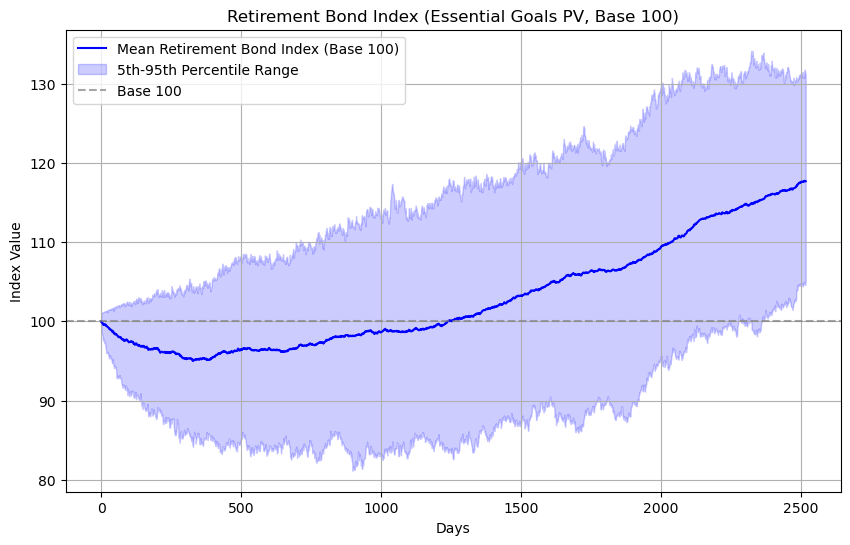

In [450]:
# Compute Retirement Bond Index for each simulation
retirement_bond_index = 100 * (essential_goals_pv / essential_goals_pv[:, 0][:, np.newaxis])  # Shape: (num_simulations, num_days)

# Compute mean and percentiles (for shaded confidence interval)
mean_retirement_bond_index = np.mean(retirement_bond_index, axis=0)
percentile_5 = np.percentile(retirement_bond_index, 5, axis=0)
percentile_95 = np.percentile(retirement_bond_index, 95, axis=0)

# Plot the Retirement Bond Index with confidence intervals
plt.figure(figsize=(10, 6))
plt.plot(mean_retirement_bond_index, label="Mean Retirement Bond Index (Base 100)", color='b')
plt.fill_between(range(len(mean_retirement_bond_index)), percentile_5, percentile_95, color='b', alpha=0.2, label="5th-95th Percentile Range")
plt.axhline(100, linestyle="--", color="gray", alpha=0.7, label="Base 100")
plt.title("Retirement Bond Index (Essential Goals PV, Base 100)")
plt.xlabel("Days")
plt.ylabel("Index Value")
plt.grid(True)
plt.legend()
plt.show()

In [597]:
rolling_volatility

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
Effective date,,,,,,,,,,,,,,,,,,,,,
2014-12-03,0.067161,0.073118,0.075537,0.097357,0.083576,0.069901,0.070268,0.110829,0.091580,0.064079,...,0.104472,0.096896,0.083501,0.049091,0.060246,0.055231,0.075234,0.077022,0.065803,0.097443
2014-12-04,0.063004,0.069214,0.075207,0.096966,0.085505,0.070678,0.065546,0.098245,0.090366,0.064468,...,0.097923,0.096703,0.067712,0.046711,0.061155,0.054283,0.064044,0.067150,0.061705,0.087497
2014-12-05,0.063055,0.068595,0.073263,0.096137,0.086902,0.071112,0.066211,0.099984,0.090335,0.069647,...,0.093958,0.096016,0.067595,0.046433,0.060727,0.054653,0.065470,0.067038,0.059316,0.089693
2014-12-08,0.062215,0.068262,0.073423,0.096413,0.082273,0.068587,0.067709,0.102374,0.091459,0.069848,...,0.092713,0.096116,0.066477,0.044975,0.060417,0.057782,0.065362,0.061597,0.064201,0.088762
2014-12-09,0.063832,0.066888,0.077072,0.090324,0.083834,0.078197,0.070696,0.105955,0.090456,0.070867,...,0.092203,0.105353,0.066409,0.044949,0.057678,0.058192,0.065752,0.059662,0.074644,0.096485
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-10-28,0.051957,0.048056,0.038073,0.056298,0.045552,0.049057,0.038033,0.055495,0.050977,0.051723,...,0.044475,0.038358,0.064854,0.061112,0.054841,0.049194,0.039940,0.049420,0.063472,0.054995
2024-10-29,0.058589,0.047891,0.037727,0.057113,0.043637,0.048774,0.037562,0.060836,0.052506,0.053909,...,0.047083,0.044335,0.064644,0.063381,0.054501,0.048943,0.037015,0.058757,0.070458,0.057892
2024-10-30,0.058074,0.047974,0.042475,0.055632,0.044379,0.040904,0.036567,0.059858,0.049962,0.052054,...,0.045996,0.042993,0.059153,0.064647,0.055359,0.049541,0.039328,0.052666,0.066958,0.058908


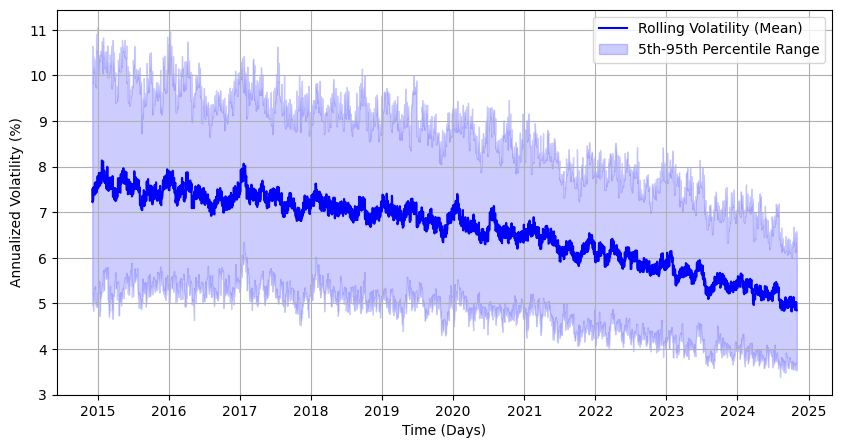

In [629]:
# Compute log returns for each simulation (shape: num_simulations, num_days-1)
log_returns_rb = np.log(retirement_bond_index[:, 1:] / retirement_bond_index[:, :-1])

# Define rolling window size (21 days for monthly volatility)
rolling_window = 21  

# Compute rolling volatility (std of log returns over rolling window) for each simulation
rolling_volatility = np.array([
    np.array([
        np.nanstd(log_returns[sim, max(0, t - rolling_window):t]) * np.sqrt(252)
        for t in range(rolling_window, log_returns.shape[1])
    ])
    for sim in range(log_returns.shape[0])
])  # Shape: (num_simulations, num_days - rolling_window)

# Convert to DataFrame and set index
rolling_volatility_df = pd.DataFrame(rolling_volatility.T, index=biggest_period_index[rolling_window+1:])

# Compute the mean rolling volatility across simulations
vol_mean_rb = rolling_volatility_df.mean(axis=1)  # Mean along rows (time axis)

# Compute percentiles for uncertainty bands
vol_5th_rb = rolling_volatility_df.quantile(0.05, axis=1)  # 5th percentile along rows
vol_95th_rb = rolling_volatility_df.quantile(0.95, axis=1)  # 95th percentile along rows

# Plot rolling volatility over time
plt.figure(figsize=(10, 5))
plt.plot(vol_mean_rb.index, vol_mean_rb * 100, label="Rolling Volatility (Mean)", color='b')

# Add percentiles for uncertainty bands
plt.fill_between(vol_mean_rb.index, vol_5th_rb * 100, vol_95th_rb * 100, color='b', alpha=0.2, label="5th-95th Percentile Range")

# Labels and Title
plt.xlabel("Time (Days)")
plt.ylabel("Annualized Volatility (%)")
#plt.title("Rolling Volatility of Retirement Bond Index")
plt.legend()
plt.grid(True)
plt.show()

In [855]:
log_returns_rb

array([[ 6.48377556e-03, -1.06217670e-04, -3.51673709e-03, ...,
        -8.43410186e-04,  1.83823929e-03,  8.53539000e-04],
       [ 6.14253225e-03,  3.15026575e-03, -3.15331130e-03, ...,
        -5.86309950e-04,  2.44983437e-03, -1.09053372e-03],
       [-6.11486273e-03,  3.44454010e-03, -3.60022753e-03, ...,
        -6.06639103e-03, -2.19773250e-03, -1.32584435e-03],
       ...,
       [-1.10394783e-02,  4.38090012e-03,  8.44834472e-03, ...,
         2.01594157e-04,  3.09529440e-03, -9.57628321e-04],
       [-6.27571542e-03,  7.06734075e-03,  3.41104518e-03, ...,
        -1.50662437e-03, -1.01018011e-03,  2.72652070e-03],
       [-1.43390754e-02, -5.19715958e-03,  4.14789285e-03, ...,
        -3.73996856e-03,  8.62154512e-05, -3.44175187e-03]])

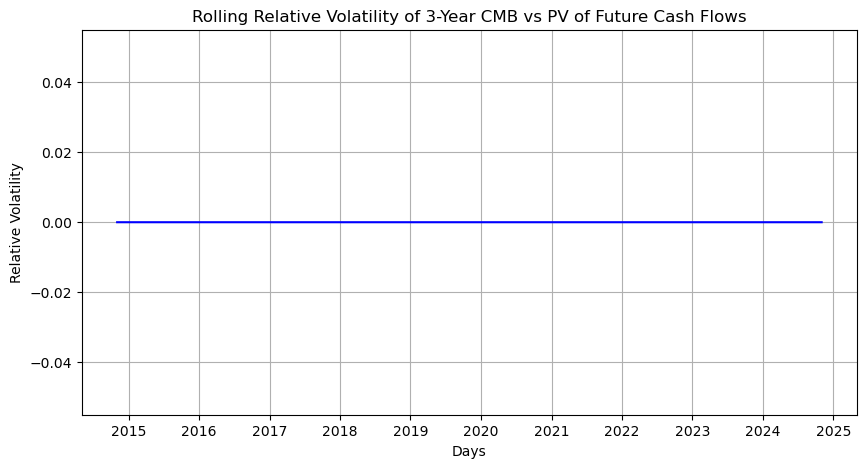

In [859]:
window_size = 21  # Rolling window size (e.g., 21 days)

# --- Step 1: Compute Log Returns ---
log_returns_rb = np.log(retirement_bond_index[:, 1:] / retirement_bond_index[:, :-1])
log_returns_pv = np.log(essential_goals_pv[:, 1:] / essential_goals_pv[:, :-1])

log_returns_rb_combined = np.round(log_returns_rb.mean(axis=0)-log_returns_pv.mean(axis=0),4)
log_returns_rb_combined = pd.DataFrame(log_returns_rb_combined).set_index(biggest_period_index[1:])

  # Element-wise division

# --- Step 4: Plot the Results ---
plt.figure(figsize=(10, 5))
plt.plot(log_returns_rb_combined, label="Relative Volatility (CMB / PV)", color='b')

# Formatting the Plot
plt.xlabel("Days")
plt.ylabel("Relative Volatility")
plt.title("Rolling Relative Volatility of 3-Year CMB vs PV of Future Cash Flows")
plt.grid(True)

# Show the Plot
plt.show()


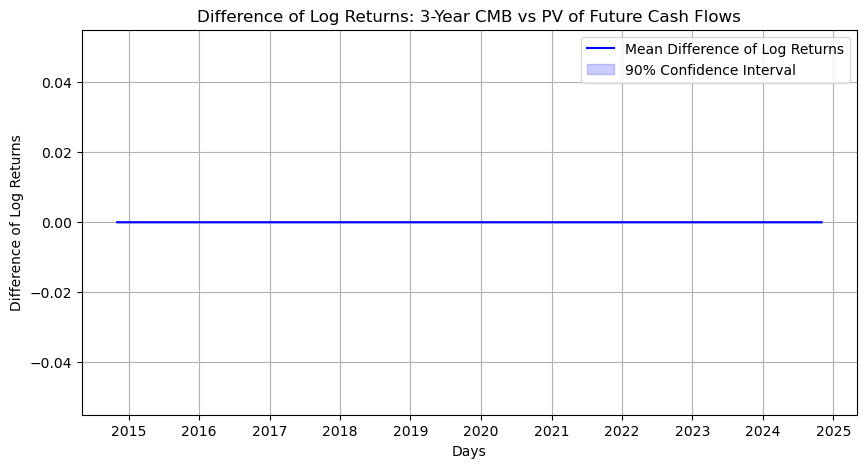

In [869]:
# --- Step 1: Compute Log Returns ---
log_returns_rb = np.log(retirement_bond_index[:, 1:] / retirement_bond_index[:, :-1])  # Log returns for retirement bond index
log_returns_pv = np.log(essential_goals_pv[:, 1:] / essential_goals_pv[:, :-1])  # Log returns for present value of essential goals

# --- Step 2: Calculate the Difference of Log Returns Across Simulations ---
log_returns_diff = np.round(log_returns_rb - log_returns_pv,6)  # Element-wise subtraction

# --- Step 3: Compute Mean and Percentiles ---
mean_log_returns_diff = np.mean(log_returns_diff, axis=0)  # Mean across simulations for each time step
lower_percentile = np.percentile(log_returns_diff, 5, axis=0)  # 5th percentile across simulations
upper_percentile = np.percentile(log_returns_diff, 95, axis=0)  # 95th percentile across simulations

# --- Step 4: Convert to DataFrame (Optional for visualization) ---
log_returns_diff_combined = pd.DataFrame(log_returns_diff.T, index=biggest_period_index[1:])  # Transpose for correct time index

# --- Step 5: Plot the Results ---
plt.figure(figsize=(10, 5))

# Plot the mean, lower and upper percentiles
plt.plot(log_returns_diff_combined.index, mean_log_returns_diff, label="Mean Difference of Log Returns", color='b')
plt.fill_between(log_returns_diff_combined.index, lower_percentile, upper_percentile, color='blue', alpha=0.2, label="90% Confidence Interval")

# Formatting the Plot
plt.xlabel("Days")
plt.ylabel("Difference of Log Returns")
plt.title("Difference of Log Returns: 3-Year CMB vs PV of Future Cash Flows")
plt.legend()
plt.grid(True)

# Show the Plot
plt.show()

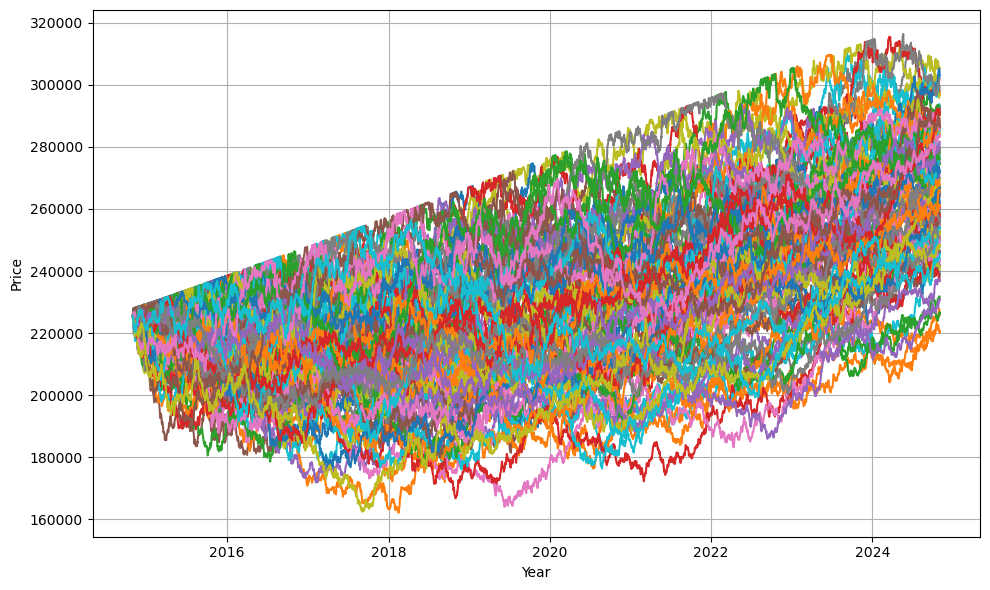

In [90]:
perfect_retirement_bond = pd.DataFrame(essential_goals_pv.T).set_index(biggest_period_index)

# Plot results
plt.figure(figsize=(10, 6))
#plt.plot(time_years, savings_pv, label="Savings PV", color='blue')
plt.plot(perfect_retirement_bond, label="Essential Goals PV")#, color='green')
#plt.plot(time_years, aspirational_goals_pv.T, label="Aspirational Goals PV")#, color='red')

#plt.title("Perfect Retirement Bond")
plt.xlabel("Year")
plt.ylabel("Price")
plt.grid(True)
#plt.legend()
plt.tight_layout()
plt.show()

In [95]:
perfect_retirement_bond.index

DatetimeIndex(['2014-10-31', '2014-11-03', '2014-11-04', '2014-11-05',
               '2014-11-06', '2014-11-07', '2014-11-10', '2014-11-11',
               '2014-11-12', '2014-11-13',
               ...
               '2024-10-21', '2024-10-22', '2024-10-23', '2024-10-24',
               '2024-10-25', '2024-10-28', '2024-10-29', '2024-10-30',
               '2024-10-31', '2024-11-01'],
              dtype='datetime64[ns]', name='Effective date', length=2518, freq=None)

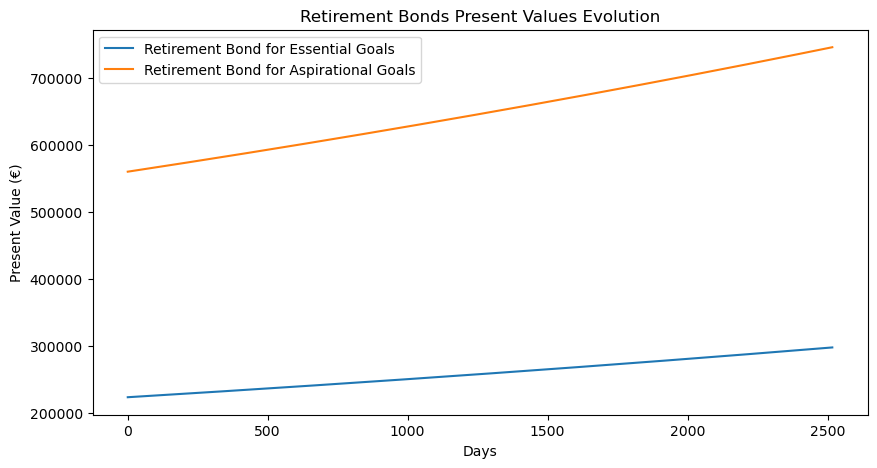

In [101]:
# Pre-allocate arrays for Present Values (PVs)
retirement_bond_essential = np.zeros((num_simulations, num_days))
retirement_bond_aspirational = np.zeros((num_simulations, num_days))

# Store discounted cashflows before summing (for inspection)
retirement_bond_essential_discounted = np.zeros((num_simulations, num_days, num_cashflows))
retirement_bond_aspirational_discounted = np.zeros((num_simulations, num_days, num_cashflows))

# Extract relevant simulated yields
yields_sim = simulated_yields_all[:, 0, 10:]  # Shape: (num_simulations, num_cashflows)

# Loop through each day to compute PVs
for i in range(num_days):  
    # Compute decreasing daily maturities
    daily_maturities = np.linspace(10 - i / 252, 30 - i / 252, num_cashflows)  

    # Compute discount factors
    discount_factors = np.exp(-yields_sim * daily_maturities)  

    # Convert maturities to integers and clip to be within bounds
    maturity_indices = np.clip(daily_maturities.astype(int), 0, P_t_T_all.shape[2] - 1)

    # Discount the required cash flows for retirement
    retirement_bond_essential_discounted[:, i, :] = (essential_goals_cashflows * discount_factors)
    retirement_bond_aspirational_discounted[:, i, :] = (aspirational_goals_cashflows * discount_factors)

    # Compute total present value for the retirement bond
    retirement_bond_essential[:, i] = np.sum(retirement_bond_essential_discounted[:, i, :], axis=1)
    retirement_bond_aspirational[:, i] = np.sum(retirement_bond_aspirational_discounted[:, i, :], axis=1)

# Compute the mean and percentiles for visualization
mean_pv_essential = np.mean(retirement_bond_essential, axis=0)
mean_pv_aspirational = np.mean(retirement_bond_aspirational, axis=0)

# Plot
plt.figure(figsize=(10, 5))
plt.plot(range(num_days), mean_pv_essential, label="Retirement Bond for Essential Goals")#, color="blue")
plt.plot(range(num_days), mean_pv_aspirational, label="Retirement Bond for Aspirational Goals")
#plt.fill_between(range(num_days), p10, p90, color="blue", alpha=0.2, label="10-90 Percentile Range")
plt.xlabel("Days")
plt.ylabel("Present Value (€)")
plt.title("Retirement Bonds Present Values Evolution")
plt.legend()
plt.show()

In [75]:
simulated_safe_ret_daily_ghp = pd.DataFrame(essential_goals_pv.T).pct_change().dropna()
simulated_safe_ret_daily_ghp = simulated_safe_ret_daily_ghp.set_index(risky_df[1:].index)
simulated_safe_ret_weekly_ghp = simulated_safe_ret_daily_ghp.resample('W').ffill().pct_change().dropna()
simulated_safe_ret_monthly_ghp = simulated_safe_ret_daily_ghp.resample('ME').ffill().pct_change().dropna()

In [318]:
# # Define the face value of the retirement bond
# face_value = 100

# # Define dimensions of P_t_T_all
# num_simulations, num_days, num_maturities = P_t_T_all.shape

# # Define bond maturities (10 to 30 years)
# bond_maturities = np.arange(10, 31)  # Maturities from 10 to 30 years

# # Pre-allocate array to store aggregate bond prices
# aggregate_bond_prices = np.zeros((num_simulations, num_days))

# # Yearly maturities grid for interpolation
# yearly_maturities = np.linspace(1, 30, num_maturities)

# # Simulate bond prices over time
# for sim in range(num_simulations):  # Loop over simulations
#     for t in range(num_days):  # Loop over days
#         # Compute decreasing maturities
#         remaining_maturities = bond_maturities - t / 252  # Convert days to years
        
#         # Keep only valid maturities
#         valid_maturities = remaining_maturities[remaining_maturities > 0]
        
#         if len(valid_maturities) == 0:
#             # All bonds have matured
#             aggregate_bond_prices[sim, t] = 0
#             continue
        
#         # Interpolation function for discount factors
#         interpolator = interp1d(
#             yearly_maturities, 
#             P_t_T_all[sim, t, :], 
#             kind='linear', 
#             bounds_error=False, 
#             fill_value="extrapolate"
#         )
        
#         # Interpolate discount factors for remaining maturities
#         interpolated_discounts = interpolator(valid_maturities)
        
#         # Compute the price of each remaining bond
#         bond_prices = face_value * interpolated_discounts
        
#         # Compute aggregate bond price
#         aggregate_bond_prices[sim, t] = np.sum(bond_prices)

# # Compute the mean aggregate bond price across simulations
# mean_aggregate_bond_prices = aggregate_bond_prices.mean(axis=0)

# # Plot the mean aggregate bond price over time
# plt.figure(figsize=(10, 5))
# plt.plot(np.arange(num_days) / 252, mean_aggregate_bond_prices, label="Aggregate Bond Price")
# plt.xlabel("Time (Years)")
# plt.ylabel("Aggregate Bond Price")
# plt.title("Aggregate Retirement Bond Price Over Time")
# plt.legend()
# plt.grid(True)
# plt.show()

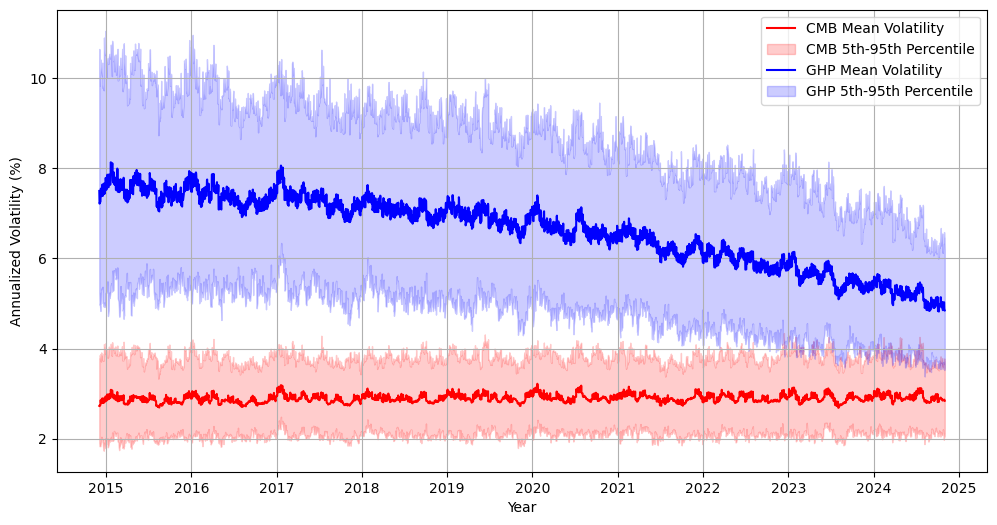

In [675]:
# --- Part 3: Plot Both Results on the Same Graph ---
plt.figure(figsize=(12, 6))

# Plot CMB Volatility
plt.plot(vol_mean_cmb.index, vol_mean_cmb*100, color='r', label="CMB Mean Volatility")
plt.fill_between(vol_mean_cmb.index, vol_5th_cmb*100, vol_95th_cmb*100, color='r', alpha=0.2, label="CMB 5th-95th Percentile")

# Plot Retirement Bond Index Volatility
plt.plot(vol_mean_rb.index, vol_mean_rb * 100, color='b', label="GHP Mean Volatility")
plt.fill_between(vol_mean_rb.index, vol_5th_rb * 100, vol_95th_rb * 100, color='b', alpha=0.2, label="GHP 5th-95th Percentile")

# Formatting the Plot
plt.xlabel("Year")
plt.ylabel("Annualized Volatility (%)")
#plt.title("Combined Plot: Rolling Volatility of CMB and Retirement Bond Index")
plt.legend()
plt.grid(True)

# Show the Plot
plt.show()

In [ ]:
# --- Part 3: Plot Both Results on the Same Graph ---
plt.figure(figsize=(12, 6))

# Plot CMB Volatility
plt.plot(vol_mean_cmb.index, log_returns_cmb.std()*np.sqrt(252)*100, color='r', label="CMB Mean Volatility")
plt.fill_between(vol_mean_cmb.index, vol_5th_cmb*100, vol_95th_cmb*100, color='r', alpha=0.2, label="CMB 5th-95th Percentile")

# Plot Retirement Bond Index Volatility
plt.plot(vol_mean_rb.index, vol_mean_rb * 100, color='b', label="GHP Mean Volatility")
plt.fill_between(vol_mean_rb.index, vol_5th_rb * 100, vol_95th_rb * 100, color='b', alpha=0.2, label="GHP 5th-95th Percentile")

# Formatting the Plot
plt.xlabel("Year")
plt.ylabel("Annualized Volatility (%)")
#plt.title("Combined Plot: Rolling Volatility of CMB and Retirement Bond Index")
plt.legend()
plt.grid(True)

# Show the Plot
plt.show()

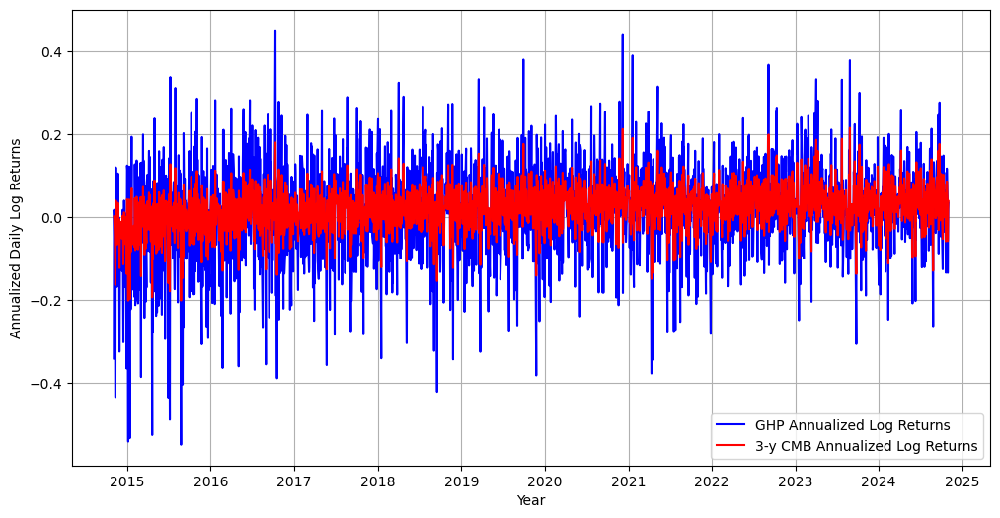

In [671]:
# --- Part 3: Plot Both Results on the Same Graph ---
plt.figure(figsize=(12, 6))

# Plot the difference in log returns for Retirement Bond Index vs PV
plt.plot(biggest_period_index[1:], log_returns_rb.mean(axis=0)*252, label="GHP Annualized Log Returns", color='b')

# Plot the difference in log returns for CMB vs PV
plt.plot(biggest_period_index[2:], log_returns_cmb.mean(axis=0)*252, label="3-y CMB Annualized Log Returns", color='r')

# Formatting the Plot
plt.xlabel("Year")
plt.ylabel("Annualized Daily Log Returns")
#plt.title("Combined Plot: Difference in Log Returns (CMB vs PV and RB vs PV)")
plt.legend()
plt.grid(True)

# Show the Plot
plt.show()

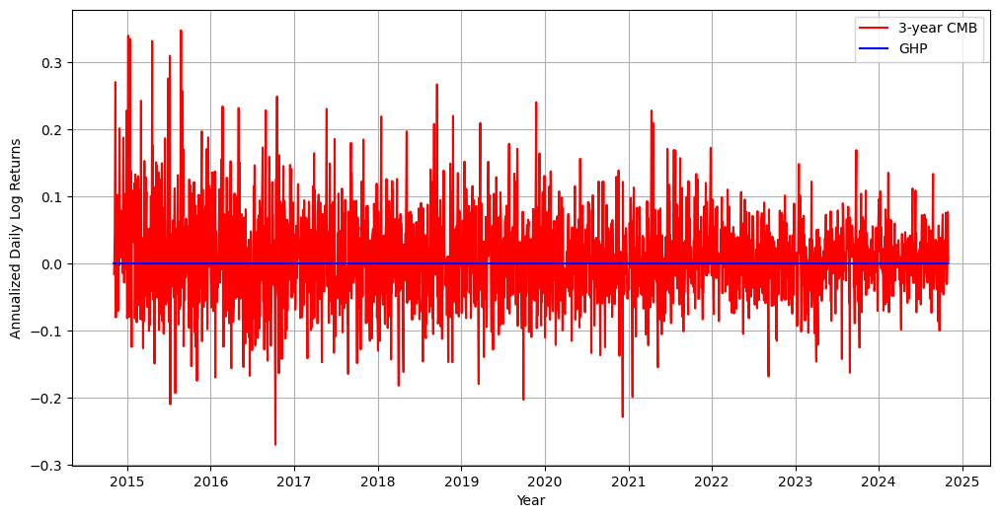

In [877]:
# --- Part 3: Plot Both Results on the Same Graph ---
plt.figure(figsize=(12, 6))

# Plot the difference in log returns for CMB vs PV
plt.plot(log_returns_cmb_combined, label="3-year CMB", color='r')

# Plot the difference in log returns for Retirement Bond Index vs PV
plt.plot(log_returns_rb_combined, label="GHP", color='b')

# Formatting the Plot
plt.xlabel("Year")
plt.ylabel("Annualized Daily Log Returns")
#plt.title("Combined Plot: Difference in Log Returns (CMB vs PV and RB vs PV)")
plt.legend()
plt.grid(True)

# Show the Plot
plt.show()

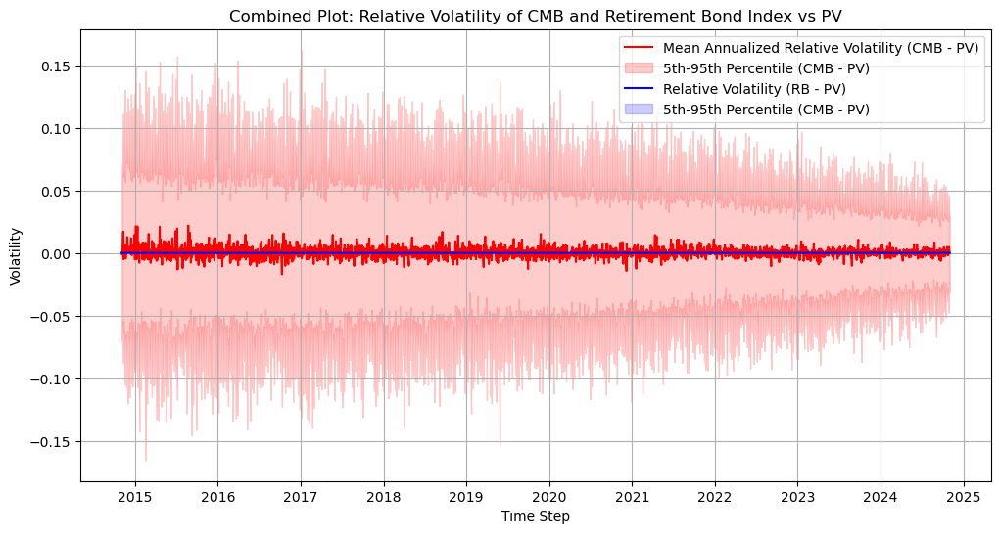

In [871]:
# --- Part 3: Plot Both Results on the Same Graph ---
plt.figure(figsize=(12, 6))

# Plot Relative Volatility for CMB and PV
plt.plot(biggest_period_index[2:], mean_volatility, label="Mean Annualized Relative Volatility (CMB - PV)", color="r")
plt.fill_between(biggest_period_index[2:], lower_bound, upper_bound, color="r", alpha=0.2, label="5th-95th Percentile (CMB - PV)")

# Plot Relative Volatility for Retirement Bond Index and PV
plt.plot(biggest_period_index[1:], log_returns_rb_combined, label="Relative Volatility (RB - PV)", color="b")
plt.fill_between(biggest_period_index[1:], lower_percentile, upper_percentile, color="b", alpha=0.2, label="5th-95th Percentile (CMB - PV)")

# Formatting the Plot
plt.xlabel("Time Step")
plt.ylabel("Volatility")
plt.title("Combined Plot: Relative Volatility of CMB and Retirement Bond Index vs PV")
plt.legend()
plt.grid(True)

# Show the Plot
plt.show()

### Buy-and-Hold SPY+CMB

In [77]:
yields_today = yields_df.iloc[0]

In [125]:
savings = 25000
essential = 20000
aspirational = 50000

savings_pv = []
essential_pv = []
aspirational_pv = []

for i in range(10, 30):
    savings_pv.append(savings / ((1 + yields_today[i])**i))
    essential_pv.append(essential / ((1 + yields_today[i])**i))
    aspirational_pv.append(aspirational / ((1 + yields_today[i])**i))

In [127]:
print(f'Savings PV: {sum(savings_pv)}')
print(f'Essential Goal PV: {sum(essential_pv)}')
print(f'Aspirational Goal PV: {sum(aspirational_pv)}')

Savings PV: 287037.55524506344
Essential Goal PV: 229630.0441960508
Aspirational Goal PV: 574075.1104901269


---

In [896]:
# savings = 25000
# essential = 20000
# aspirational = 50000

# savings_pv = []
# essential_pv = []
# aspirational_pv = []

# for i in range(10, 30):
#     savings_pv.append(savings / ((1 + yields_today[i])**i))
#     essential_pv.append(essential / ((1 + yields_today[i])**i))
#     aspirational_pv.append(aspirational / ((1 + yields_today[i])**i))
    
# # Total value of savings
# total_value = sum(savings_pv)

# # Define weight range
# weights = np.arange(0.0, 1.1, 0.1)
# portfolio_results = {}
# weight_tracking = {}

# # Loop through each weight allocation
# for risky_percentage in weights:
#     safe_percentage = 1 - risky_percentage
#     risky_initial_investment = total_value * risky_percentage
#     safe_initial_investment = total_value * safe_percentage
    
#     risky_portfolio_value = risky_initial_investment * (1 + simulated_risky_ret_daily).cumprod()
#     safe_portfolio_value = safe_initial_investment * (1 + simulated_safe_ret_daily).cumprod()
    
#     combined_portfolio_value = risky_portfolio_value + safe_portfolio_value
#     risky_weight = risky_portfolio_value / combined_portfolio_value
    
#     portfolio_results[risky_percentage] = combined_portfolio_value
#     portfolio_results[risky_percentage] = portfolio_results[risky_percentage].dropna()
    
#     weight_tracking[risky_percentage] = risky_weight
#     weight_tracking[risky_percentage] = weight_tracking[risky_percentage].dropna()

# # Time in years
# time_years = np.arange(0, len(safe_portfolio_value)) / 252

# # Plot portfolio values
# plt.figure(figsize=(12, 8))
# for risky_percentage, combined_portfolio_value in portfolio_results.items():
#     plt.plot(time_years, combined_portfolio_value.iloc[:, 0], label=f"Risky: {risky_percentage*100:.0f}%, Safe: {(1-risky_percentage)*100:.0f}%")
# plt.title("Portfolio Value Over Time for Different Allocations")
# plt.xlabel("Time (Years)")
# plt.ylabel("Portfolio Value ($)")
# plt.grid(True)
# plt.legend(title="Allocation", loc="upper left", fontsize=8)
# plt.tight_layout()
# plt.show()

# # Plot risky portfolio weight
# plt.figure(figsize=(12, 8))
# for risky_percentage, risky_weight in weight_tracking.items():
#     plt.plot(time_years, risky_weight.iloc[:, 0], label=f"Risky: {risky_percentage*100:.0f}%, Safe: {(1-risky_percentage)*100:.0f}%")
# plt.title("Risky Portfolio Weight Relative to Combined Portfolio Value Over Time")
# plt.xlabel("Time (Years)")
# plt.ylabel("Risky Portfolio Weight (%)")
# plt.grid(True)
# plt.legend(title="Allocation", loc="upper left", fontsize=8)
# plt.tight_layout()
# plt.show()

# # Print final values
# print("Final Portfolio Values for Different Allocations:")
# for risky_percentage, combined_portfolio_value in portfolio_results.items():
#     print(f"Risky: {risky_percentage*100:.0f}%, Safe: {(1-risky_percentage)*100:.0f}% -> Final Value: ${combined_portfolio_value.iloc[-1, 0]:.2f}")

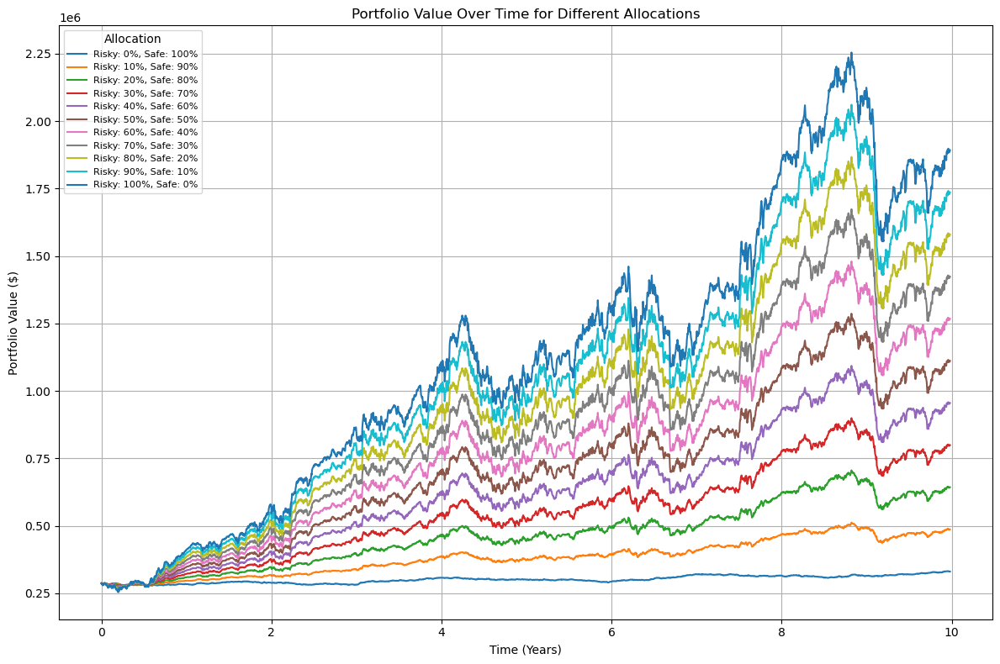

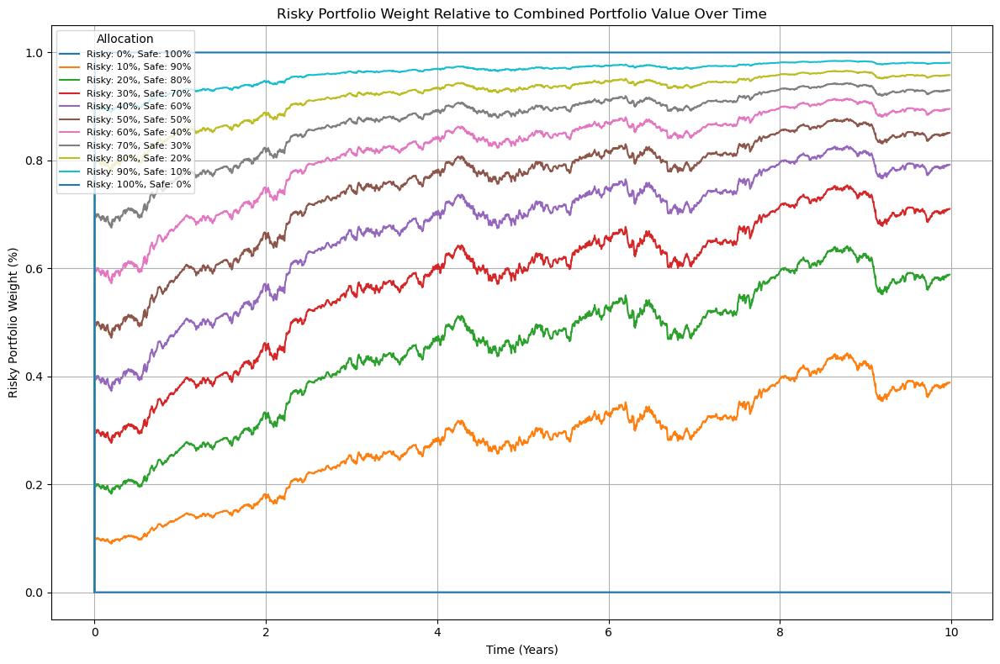

Final Portfolio Values for Different Allocations:
Risky: 0%, Safe: 100% -> Final Value: $330870.27
Risky: 10%, Safe: 90% -> Final Value: $487075.98
Risky: 20%, Safe: 80% -> Final Value: $643281.69
Risky: 30%, Safe: 70% -> Final Value: $799487.40
Risky: 40%, Safe: 60% -> Final Value: $955693.12
Risky: 50%, Safe: 50% -> Final Value: $1111898.83
Risky: 60%, Safe: 40% -> Final Value: $1268104.54
Risky: 70%, Safe: 30% -> Final Value: $1424310.25
Risky: 80%, Safe: 20% -> Final Value: $1580515.97
Risky: 90%, Safe: 10% -> Final Value: $1736721.68
Risky: 100%, Safe: 0% -> Final Value: $1892927.39


In [139]:
# Sample initial data (replace with your actual data)
savings = 25000
essential = 20000
aspirational = 50000

savings_pv = []
essential_pv = []
aspirational_pv = []

# Assuming 'yields_today' is already defined elsewhere
for i in range(10, 30):
    savings_pv.append(savings / ((1 + yields_today[i])**i))
    essential_pv.append(essential / ((1 + yields_today[i])**i))
    aspirational_pv.append(aspirational / ((1 + yields_today[i])**i))

# Total value of savings
total_value = sum(savings_pv)

# Define weight range
weights = np.arange(0.0, 1.1, 0.1)
portfolio_results = {}
weight_tracking = {}

# Assuming 'simulated_safe_ret_daily' and 'simulated_risky_ret_daily' are already defined
n_days = simulated_safe_ret_daily.shape[0]
n_simulations = simulated_safe_ret_daily.shape[1]

# Reshape the returns data to avoid nested loops
simulated_risky_ret_daily_array = simulated_risky_ret_daily.values
simulated_safe_ret_daily_array = simulated_safe_ret_daily.values

# Remove the first observation from simulated_risky_ret_daily_array to match the shape of simulated_safe_ret_daily_array
simulated_risky_ret_daily_array = simulated_risky_ret_daily_array[1:, :]

# Loop through each weight allocation
for risky_percentage in weights:
    safe_percentage = 1 - risky_percentage
    
    # Initialize portfolio values
    risky_portfolio_value = np.zeros((n_simulations, n_days))
    safe_portfolio_value = np.zeros((n_simulations, n_days))
    risky_weight = np.zeros((n_simulations, n_days))
    
    # Initial investments (scalars)
    risky_initial_investment = total_value * risky_percentage
    safe_initial_investment = total_value * safe_percentage
    
    # Assign initial values
    risky_portfolio_value[:, 0] = risky_initial_investment
    safe_portfolio_value[:, 0] = safe_initial_investment
    
    # Compute portfolio growth across all simulations at once
    for t in range(1, n_days):
        # Ensure the returns are correctly sliced for each simulation
        risky_portfolio_value[:, t] = risky_portfolio_value[:, t-1] * (1 + simulated_risky_ret_daily_array[t-1, :])
        safe_portfolio_value[:, t] = safe_portfolio_value[:, t-1] * (1 + simulated_safe_ret_daily_array[t-1, :])
        
        # Total portfolio value
        combined_portfolio_value = risky_portfolio_value[:, t] + safe_portfolio_value[:, t]
        
        # Weighting of risky asset
        risky_weight[:, t] = risky_portfolio_value[:, t] / combined_portfolio_value
    
    # Store results for each allocation
    portfolio_results[risky_percentage] = risky_portfolio_value + safe_portfolio_value
    weight_tracking[risky_percentage] = risky_weight

# Time years for plotting
time_years = np.arange(0, n_days) / 252

# Plot portfolio values over time for different allocations
plt.figure(figsize=(12, 8))
for risky_percentage, combined_portfolio_value in portfolio_results.items():
    plt.plot(time_years, combined_portfolio_value[0], label=f"Risky: {risky_percentage*100:.0f}%, Safe: {(1-risky_percentage)*100:.0f}%")

plt.title("Portfolio Value Over Time for Different Allocations")
plt.xlabel("Time (Years)")
plt.ylabel("Portfolio Value ($)")
plt.grid(True)
plt.legend(title="Allocation", loc="upper left", fontsize=8)
plt.tight_layout()
plt.show()

# Plot risky portfolio weight over time
plt.figure(figsize=(12, 8))
for risky_percentage, risky_weight in weight_tracking.items():
    plt.plot(time_years, risky_weight[0], label=f"Risky: {risky_percentage*100:.0f}%, Safe: {(1-risky_percentage)*100:.0f}%")

plt.title("Risky Portfolio Weight Relative to Combined Portfolio Value Over Time")
plt.xlabel("Time (Years)")
plt.ylabel("Risky Portfolio Weight (%)")
plt.grid(True)
plt.legend(title="Allocation", loc="upper left", fontsize=8)
plt.tight_layout()
plt.show()

# Print final portfolio values
print("Final Portfolio Values for Different Allocations:")
for risky_percentage, combined_portfolio_value in portfolio_results.items():
    print(f"Risky: {risky_percentage*100:.0f}%, Safe: {(1-risky_percentage)*100:.0f}% -> Final Value: ${combined_portfolio_value[0, -1]:.2f}")

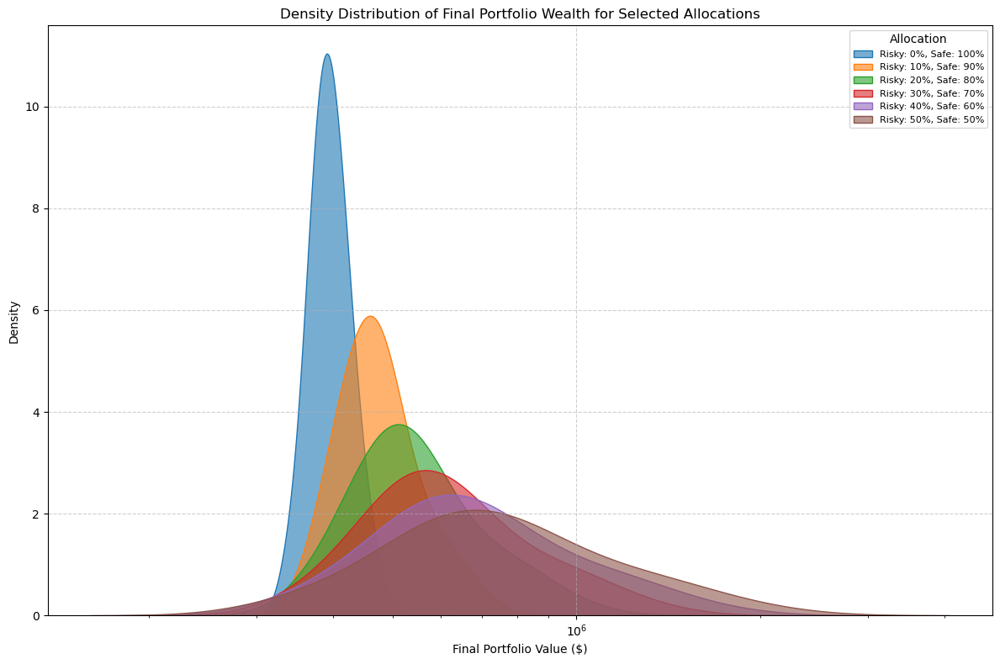

Summary of Final Portfolio Values for Selected Allocations:
Risky: 0%, Safe: 100% -> Mean: $396104.26, Std Dev: $29117.17
Risky: 10%, Safe: 90% -> Mean: $478939.30, Std Dev: $72192.79
Risky: 20%, Safe: 80% -> Mean: $561774.34, Std Dev: $139805.52
Risky: 30%, Safe: 70% -> Mean: $644609.38, Std Dev: $209401.92
Risky: 40%, Safe: 60% -> Mean: $727444.41, Std Dev: $279504.09
Risky: 50%, Safe: 50% -> Mean: $810279.45, Std Dev: $349808.10


In [912]:
# Convert DataFrames to NumPy arrays
simulated_risky_ret_daily_array = simulated_risky_ret_daily.to_numpy()
simulated_safe_ret_daily_array = simulated_safe_ret_daily.to_numpy()

# Ensure both arrays have the same number of days
n_days = min(simulated_risky_ret_daily_array.shape[0], simulated_safe_ret_daily_array.shape[0])
n_simulations = simulated_risky_ret_daily_array.shape[1]

# Initialize dictionary to store final wealth for selected allocations across simulations
selected_allocations = [0.0, 0.1, 0.2, 0.3, 0.4, 0.5]
final_wealth_distribution = {risky_percentage: [] for risky_percentage in selected_allocations}

# Loop through selected weight allocations
for risky_percentage in selected_allocations:
    safe_percentage = 1 - risky_percentage
    risky_initial_investment = total_value * risky_percentage
    safe_initial_investment = total_value * safe_percentage

    # Initialize portfolio values
    risky_portfolio_value = np.full(n_simulations, risky_initial_investment)
    safe_portfolio_value = np.full(n_simulations, safe_initial_investment)

    # Compute portfolio values iteratively over time
    for t in range(n_days):  # Ensure we don't exceed array bounds
        risky_portfolio_value *= (1 + simulated_risky_ret_daily_array[t, :])
        safe_portfolio_value *= (1 + simulated_safe_ret_daily_array[t, :])

    # Combined portfolio value
    combined_portfolio_value = risky_portfolio_value + safe_portfolio_value

    # Store the final values across simulations
    final_wealth_distribution[risky_percentage].extend(combined_portfolio_value)

# Plot density distributions of final wealth for the selected allocations
plt.figure(figsize=(12, 8))

for risky_percentage, final_wealth in final_wealth_distribution.items():
    sns.kdeplot(final_wealth, bw_adjust=1.5, fill=True, alpha=0.6, log_scale=True,
                label=f"Risky: {risky_percentage*100:.0f}%, Safe: {(1-risky_percentage)*100:.0f}%")

plt.title("Density Distribution of Final Portfolio Wealth for Selected Allocations")
plt.xlabel("Final Portfolio Value ($)")
plt.ylabel("Density")
plt.legend(title="Allocation", loc="upper right", fontsize=8)
plt.grid(True, linestyle="--", alpha=0.6)
plt.tight_layout()
plt.show()

# Print final portfolio values summary for the selected allocations
print("Summary of Final Portfolio Values for Selected Allocations:")
for risky_percentage, final_wealth in final_wealth_distribution.items():
    print(f"Risky: {risky_percentage*100:.0f}%, Safe: {(1-risky_percentage)*100:.0f}% -> Mean: ${np.mean(final_wealth):.2f}, Std Dev: ${np.std(final_wealth):.2f}")

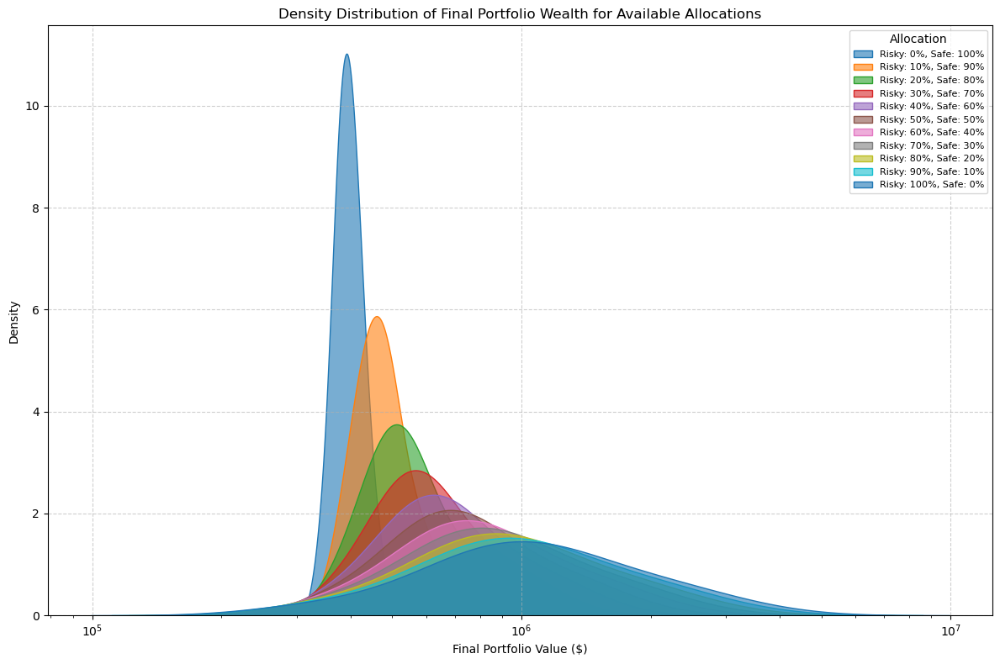

Summary of Final Portfolio Values for Available Allocations:
Risky: 0%, Safe: 100% -> Mean: $396056.45, Std Dev: $29073.57
Risky: 10%, Safe: 90% -> Mean: $478735.03, Std Dev: $72034.48
Risky: 20%, Safe: 80% -> Mean: $561413.60, Std Dev: $139555.43
Risky: 30%, Safe: 70% -> Mean: $644092.18, Std Dev: $209058.67
Risky: 40%, Safe: 60% -> Mean: $726770.75, Std Dev: $279067.01
Risky: 50%, Safe: 50% -> Mean: $809449.33, Std Dev: $349276.86
Risky: 60%, Safe: 40% -> Mean: $892127.91, Std Dev: $419587.06
Risky: 70%, Safe: 30% -> Mean: $974806.48, Std Dev: $489954.43
Risky: 80%, Safe: 20% -> Mean: $1057485.06, Std Dev: $560357.43
Risky: 90%, Safe: 10% -> Mean: $1140163.63, Std Dev: $630784.12
Risky: 100%, Safe: 0% -> Mean: $1222842.21, Std Dev: $701227.36


In [924]:
# Dynamically get available allocations from portfolio_results
selected_allocations = list(portfolio_results.keys())  # Extract available risk allocations

# Compute final wealth distribution dynamically
final_wealth_distribution = {
    risky_pct: portfolio_results[risky_pct][:, -1]  # Extract final wealth per simulation
    for risky_pct in selected_allocations
}

# Plot density distributions
plt.figure(figsize=(12, 8))
for risky_pct, final_wealth in final_wealth_distribution.items():
    sns.kdeplot(final_wealth, bw_adjust=1.5, fill=True, alpha=0.6, log_scale=True,
                label=f"Risky: {risky_pct*100:.0f}%, Safe: {(1-risky_pct)*100:.0f}%")

plt.title("Density Distribution of Final Portfolio Wealth for Available Allocations")
plt.xlabel("Final Portfolio Value ($)")
plt.ylabel("Density")
plt.legend(title="Allocation", loc="upper right", fontsize=8)
plt.grid(True, linestyle="--", alpha=0.6)
plt.tight_layout()
plt.show()

# Print summary statistics
print("Summary of Final Portfolio Values for Available Allocations:")
for risky_pct, final_wealth in final_wealth_distribution.items():
    print(f"Risky: {risky_pct*100:.0f}%, Safe: {(1-risky_pct)*100:.0f}% -> Mean: ${np.mean(final_wealth):.2f}, Std Dev: ${np.std(final_wealth):.2f}")

In [475]:
# total_value = sum(savings_pv)  # Total value of your savings

# # Define the weight range (from 0 to 1, with 0.1 steps)
# weights = np.arange(0.0, 1.1, 0.1)

# portfolio_results = {}
# weight_tracking = {}

# # Loop through each weight allocation
# for risky_percentage in weights:
#     safe_percentage = 1 - risky_percentage

#     # Risky portfolio initial investment
#     risky_initial_investment = total_value * risky_percentage

#     # Safe portfolio initial investment
#     safe_initial_investment = total_value * safe_percentage

#     # Calculate risky portfolio value over time
#     risky_portfolio_value = risky_initial_investment * (1 + np.array(simulated_risky_ret_daily[5:])).cumprod()

#     # Calculate safe portfolio value over time
#     safe_portfolio_value = safe_initial_investment * (1 + np.array(simulated_safe_ret_daily)).cumprod()

#     # Combine both portfolios
#     combined_portfolio_value = np.array(risky_portfolio_value) + np.array(safe_portfolio_value)

#     # Track the weight of the risky portfolio relative to the combined portfolio value over time
#     risky_weight = risky_portfolio_value / combined_portfolio_value

#     # Store the combined portfolio value and risky weight for this weight allocation
#     portfolio_results[risky_percentage] = combined_portfolio_value
#     weight_tracking[risky_percentage] = risky_weight

# # Create time in years (assuming daily data, 252 trading days per year)
# time_years = np.arange(0, len(risky_portfolio_value)) / 252

# # Plot the portfolio values for different allocations
# plt.figure(figsize=(12, 8))
# for risky_percentage, combined_portfolio_value in portfolio_results.items():
#     plt.plot(time_years, combined_portfolio_value, label=f"Risky: {risky_percentage*100:.0f}%, Safe: {(1-risky_percentage)*100:.0f}%")

# plt.title("Portfolio Value Over Time for Different Allocations")
# plt.xlabel("Time (Years)")
# plt.ylabel("Portfolio Value ($)")
# plt.grid(True)
# plt.legend(title="Allocation", loc="upper left", fontsize=8)
# plt.tight_layout()
# plt.show()

# # Plot the risky portfolio weight relative to the combined portfolio value
# plt.figure(figsize=(12, 8))
# for risky_percentage, risky_weight in weight_tracking.items():
#     plt.plot(time_years, risky_weight, label=f"Risky: {risky_percentage*100:.0f}%, Safe: {(1-risky_percentage)*100:.0f}%")

# plt.title("Risky Portfolio Weight Relative to Combined Portfolio Value Over Time")
# plt.xlabel("Time (Years)")
# plt.ylabel("Risky Portfolio Weight (%)")
# plt.grid(True)
# plt.legend(title="Allocation", loc="upper left", fontsize=8)
# plt.tight_layout()
# plt.show()

# # Print final values for each allocation
# print("Final Portfolio Values for Different Allocations:")
# for risky_percentage, combined_portfolio_value in portfolio_results.items():
#     print(f"Risky: {risky_percentage*100:.0f}%, Safe: {(1-risky_percentage)*100:.0f}% -> Final Value: ${combined_portfolio_value[-1]:.2f}")

In [149]:
# Define fixed cash flows for different categories
savings_cashflows = 25000 * np.ones(20)  # 20 payments of 25,000 (savings)
essential_goals_cashflows = 20000 * np.ones(20)  # 20 payments of 20,000 (essential goals)
aspirational_goals_cashflows = 50000 * np.ones(20)  # 20 payments of 50,000 (aspirational goals)

num_cashflows = len(savings_cashflows)

num_simulations, num_days, num_maturities = P_t_T_all.shape  # Extract dimensions

# Define yearly maturities (original grid)
yearly_maturities = np.linspace(10, 30, num_maturities)  # Assuming maturities are equally spaced

# Pre-allocate PV array for savings, essential goals, and aspirational goals
savings_pv = np.zeros((num_simulations, num_days))
essential_goals_pv = np.zeros((num_simulations, num_days))
aspirational_goals_pv = np.zeros((num_simulations, num_days))

# Loop over each time step to interpolate and discount properly
for i in range(0, num_days):  
    # Compute decreasing daily maturities from 10 years minus i/252 (approx. daily step)
    daily_maturities = np.linspace(10 - i / 252, 30 - i / 252, num_cashflows)

    # Initialize arrays to store interpolated discount factors for each goal category
    interpolated_savings_discounts = np.zeros((num_simulations, num_cashflows))
    interpolated_essential_goals_discounts = np.zeros((num_simulations, num_cashflows))
    interpolated_aspirational_goals_discounts = np.zeros((num_simulations, num_cashflows))

    for sim in range(num_simulations):
        # Interpolation function for savings
        interpolator = interp1d(
            yearly_maturities,  # Original maturities
            P_t_T_all[sim, i, :],  # Discount factors for this sim & time
            kind='linear',  # Linear interpolation
            bounds_error=False,  # Avoid extrapolation
            fill_value="extrapolate"  # Optional: Prevents issues if extrapolation is needed
        )

        # Interpolate discount factors for each category of cash flow
        interpolated_savings_discounts[sim, :] = interpolator(daily_maturities)
        interpolated_essential_goals_discounts[sim, :] = interpolator(daily_maturities)
        interpolated_aspirational_goals_discounts[sim, :] = interpolator(daily_maturities)

    # Compute present values of cash flows for each category
    savings_pv[:, i] = np.sum(interpolated_savings_discounts * savings_cashflows, axis=1)
    essential_goals_pv[:, i] = np.sum(interpolated_essential_goals_discounts * essential_goals_cashflows, axis=1)
    aspirational_goals_pv[:, i] = np.sum(interpolated_aspirational_goals_discounts * aspirational_goals_cashflows, axis=1)

# Compute mean present values across simulations for each category
savings_pv_mean = savings_pv.mean(axis=0)
essential_goals_pv_mean = essential_goals_pv.mean(axis=0)
aspirational_goals_pv_mean = aspirational_goals_pv.mean(axis=0)

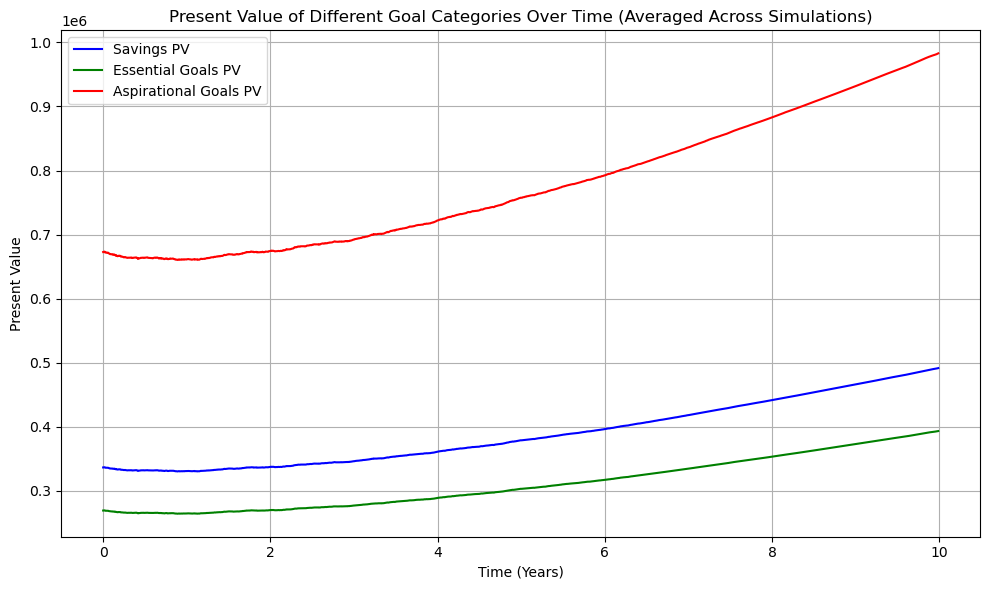

In [150]:
# Time axis in years
time_years = np.arange(num_days) / 252  # Convert days to years (assuming 252 trading days in a year)

# Plot results
plt.figure(figsize=(10, 6))
plt.plot(time_years, savings_pv_mean, label="Savings PV", color='blue')
plt.plot(time_years, essential_goals_pv_mean, label="Essential Goals PV", color='green')
plt.plot(time_years, aspirational_goals_pv_mean, label="Aspirational Goals PV", color='red')

plt.title("Present Value of Different Goal Categories Over Time (Averaged Across Simulations)")
plt.xlabel("Time (Years)")
plt.ylabel("Present Value")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

In [153]:
# Initialize dictionaries for funding ratios
funding_ratios_essential = {}
funding_ratios_aspirational = {}

funding_diff_essential = {}
funding_diff_aspirational = {}

avg_funding_ratios_essential = {}
avg_funding_ratios_aspirational = {}

# Ensure essential and aspirational PVs are 2D arrays
essential_pv = np.asarray(essential_goals_pv)  # Shape: (n_simulations, n_days)
aspirational_pv = np.asarray(aspirational_goals_pv)  # Shape: (n_simulations, n_days)

n_simulations, n_days = essential_pv.shape

# Compute funding ratios efficiently for each weight allocation
for risky_percentage in weights:
    # Extract and transpose portfolio values (Shape: (n_simulations, n_days))
    portfolio_value = portfolio_results[risky_percentage]

    # Ensure consistent length across arrays
    min_length = min(portfolio_value.shape[1], n_days)

    # Use NumPy broadcasting for efficient element-wise division
    funding_ratios_essential[risky_percentage] = portfolio_value[:, :min_length] / essential_pv[:, :min_length]
    funding_ratios_aspirational[risky_percentage] = portfolio_value[:, :min_length] / aspirational_pv[:, :min_length]

    funding_diff_essential[risky_percentage] = np.abs(portfolio_value[:, :min_length] - essential_pv[:, :min_length]) / essential_pv[:, :min_length]
    funding_diff_aspirational[risky_percentage] = np.abs(portfolio_value[:, :min_length] - aspirational_pv[:, :min_length]) / aspirational_pv[:, :min_length]

    # Compute the average funding ratios across all simulations at each time point
    avg_funding_ratios_essential[risky_percentage] = np.mean(funding_ratios_essential[risky_percentage], axis=0)
    avg_funding_ratios_aspirational[risky_percentage] = np.mean(funding_ratios_aspirational[risky_percentage], axis=0)

# Convert time to years
time_years = np.arange(min_length) / 252

# Choose a simulation index for visualization
simulation_index = 0  # Adjust index to view different simulations

# Plot funding ratios
plt.figure(figsize=(10, 6))

# Plot Essential Goal Funding Ratios
for risky_percentage, funding_ratio in funding_ratios_essential.items():
    plt.plot(time_years, funding_ratio[simulation_index, :], label=f"Essential - Risky: {risky_percentage*100:.0f}%")

# Plot Aspirational Goal Funding Ratios (Dashed Line Style)
for risky_percentage, funding_ratio in funding_ratios_aspirational.items():
    plt.plot(time_years, funding_ratio[simulation_index, :], linestyle='dashed', label=f"Aspirational - Risky: {risky_percentage*100:.0f}%")

# Formatting the plot
plt.title("Dynamic Funding Ratios for Essential and Aspirational Goals (Single Simulation)")
plt.xlabel("Time (Years)")
plt.ylabel("Funding Ratio")
plt.axhline(y=1, color='red', linestyle='--', label='FR=1')  # Reference line at FR=1
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

NameError: name 'avg_funding_ratios_essential' is not defined

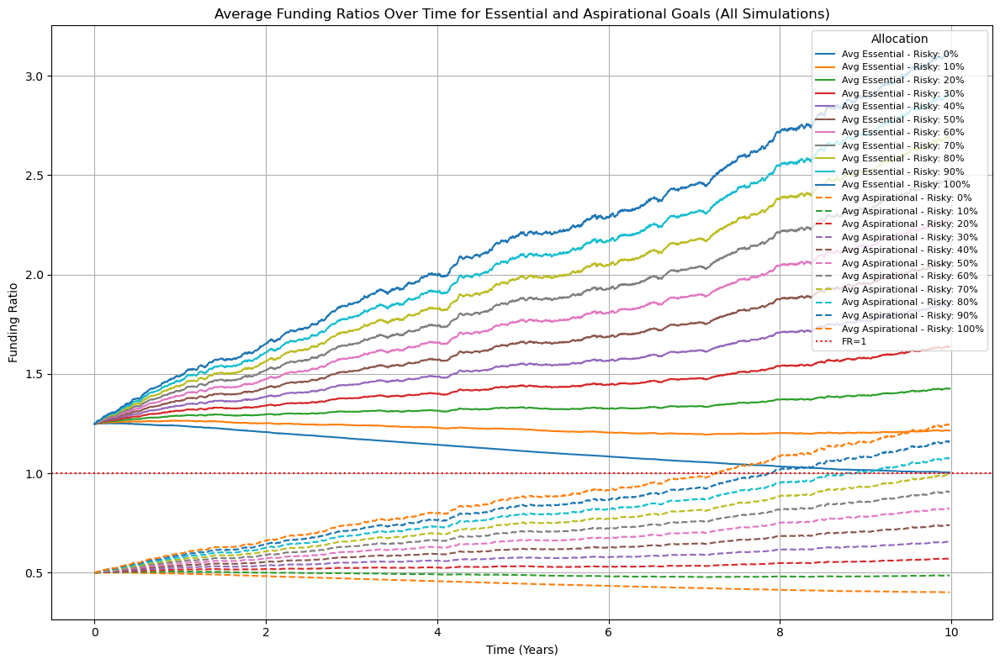

In [961]:
# Plot the average funding ratio paths
plt.figure(figsize=(12, 8))

# Plot Average Essential Goal Funding Ratios over time for each allocation
for risky_percentage, avg_funding_ratio in avg_funding_ratios_essential.items():
    plt.plot(time_years, avg_funding_ratio, label=f"Avg Essential - Risky: {risky_percentage*100:.0f}%")

# Plot Average Aspirational Goal Funding Ratios over time (Dashed Line Style)
for risky_percentage, avg_funding_ratio in avg_funding_ratios_aspirational.items():
    plt.plot(time_years, avg_funding_ratio, linestyle='dashed', label=f"Avg Aspirational - Risky: {risky_percentage*100:.0f}%")

# Formatting the plot
plt.title("Average Funding Ratios Over Time for Essential and Aspirational Goals (All Simulations)")
plt.xlabel("Time (Years)")
plt.ylabel("Funding Ratio")
plt.axhline(y=1, color='red', linestyle=':', label='FR=1')  # Reference line at FR=1
plt.grid(True)
plt.legend(title="Allocation", loc="upper right", fontsize=8)
plt.tight_layout()
plt.show()

In [965]:
# Initialize dictionaries to store the funding ratios at the final day and probabilities
final_funding_ratios_essential = {}
final_funding_ratios_aspirational = {}
probability_above_1_essential = {}
probability_above_1_aspirational = {}

# Loop through each weight allocation to extract funding ratios at the final day
for risky_percentage in weights:
    # Extract portfolio value and funding ratios
    portfolio_value = portfolio_results[risky_percentage]
    
    # Ensure consistent length across arrays
    min_length = min(portfolio_value.shape[1], n_days)
    
    # Calculate funding ratios at the final day (last time point)
    final_funding_ratios_essential[risky_percentage] = funding_ratios_essential[risky_percentage][:, -1]
    final_funding_ratios_aspirational[risky_percentage] = funding_ratios_aspirational[risky_percentage][:, -1]
    
    # Calculate the probability of the funding ratio being greater than 1 at the final day
    probability_above_1_essential[risky_percentage] = np.mean(final_funding_ratios_essential[risky_percentage] > 1)
    probability_above_1_aspirational[risky_percentage] = np.mean(final_funding_ratios_aspirational[risky_percentage] > 1)

# Optionally, print the probabilities
print("Probability of Funding Ratio > 1 (Essential Goals):")
print(probability_above_1_essential)

print("Probability of Funding Ratio > 1 (Aspirational Goals):")
print(probability_above_1_aspirational)

Probability of Funding Ratio > 1 (Essential Goals):
{0.0: 0.5, 0.1: 0.92, 0.2: 0.94, 0.30000000000000004: 0.93, 0.4: 0.94, 0.5: 0.94, 0.6000000000000001: 0.94, 0.7000000000000001: 0.94, 0.8: 0.94, 0.9: 0.94, 1.0: 0.94}
Probability of Funding Ratio > 1 (Aspirational Goals):
{0.0: 0.0, 0.1: 0.0, 0.2: 0.02, 0.30000000000000004: 0.09, 0.4: 0.17, 0.5: 0.22, 0.6000000000000001: 0.28, 0.7000000000000001: 0.36, 0.8: 0.44, 0.9: 0.48, 1.0: 0.52}


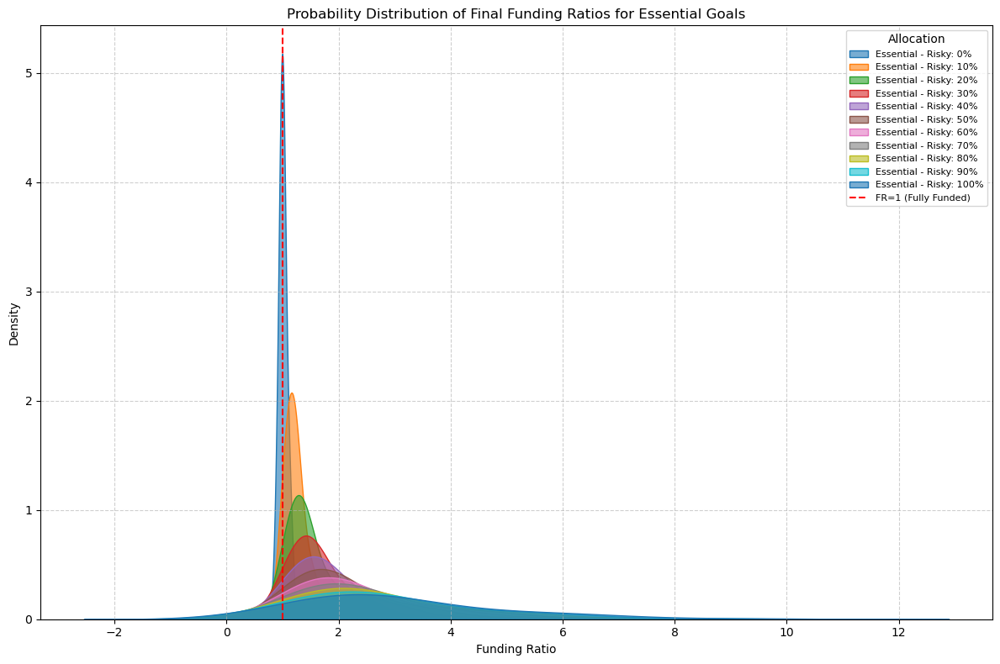

Summary of Final Funding Ratios:
Risky: 0% -> Essential: Mean: 1.01, Std Dev: 0.07
Risky: 10% -> Essential: Mean: 1.22, Std Dev: 0.19
Risky: 20% -> Essential: Mean: 1.43, Std Dev: 0.36
Risky: 30% -> Essential: Mean: 1.64, Std Dev: 0.54
Risky: 40% -> Essential: Mean: 1.85, Std Dev: 0.71
Risky: 50% -> Essential: Mean: 2.06, Std Dev: 0.89
Risky: 60% -> Essential: Mean: 2.27, Std Dev: 1.07
Risky: 70% -> Essential: Mean: 2.48, Std Dev: 1.25
Risky: 80% -> Essential: Mean: 2.69, Std Dev: 1.43
Risky: 90% -> Essential: Mean: 2.90, Std Dev: 1.61
Risky: 100% -> Essential: Mean: 3.11, Std Dev: 1.79


In [967]:
# Plot the probability distribution (Density) of funding ratios at the final day for both essential and aspirational goals
plt.figure(figsize=(12, 8))

# Plot for Essential Goal Funding Ratios
for risky_percentage, funding_ratios in final_funding_ratios_essential.items():
    sns.kdeplot(funding_ratios, bw_adjust=1.5, fill=True, alpha=0.6, label=f"Essential - Risky: {risky_percentage*100:.0f}%")

# Formatting the plot
plt.title("Probability Distribution of Final Funding Ratios for Essential Goals")
plt.xlabel("Funding Ratio")
plt.ylabel("Density")
plt.axvline(x=1, color='red', linestyle='--', label='FR=1 (Fully Funded)')
plt.legend(title="Allocation", loc="upper right", fontsize=8)
plt.grid(True, linestyle="--", alpha=0.6)
plt.tight_layout()
plt.show()

# Summary statistics for funding ratios
print("Summary of Final Funding Ratios:")
for risky_percentage in weights:
    # Calculate mean and standard deviation for final funding ratios
    mean_essential = np.mean(final_funding_ratios_essential[risky_percentage])
    std_essential = np.std(final_funding_ratios_essential[risky_percentage])

    print(f"Risky: {risky_percentage*100:.0f}% -> Essential: Mean: {mean_essential:.2f}, Std Dev: {std_essential:.2f}")

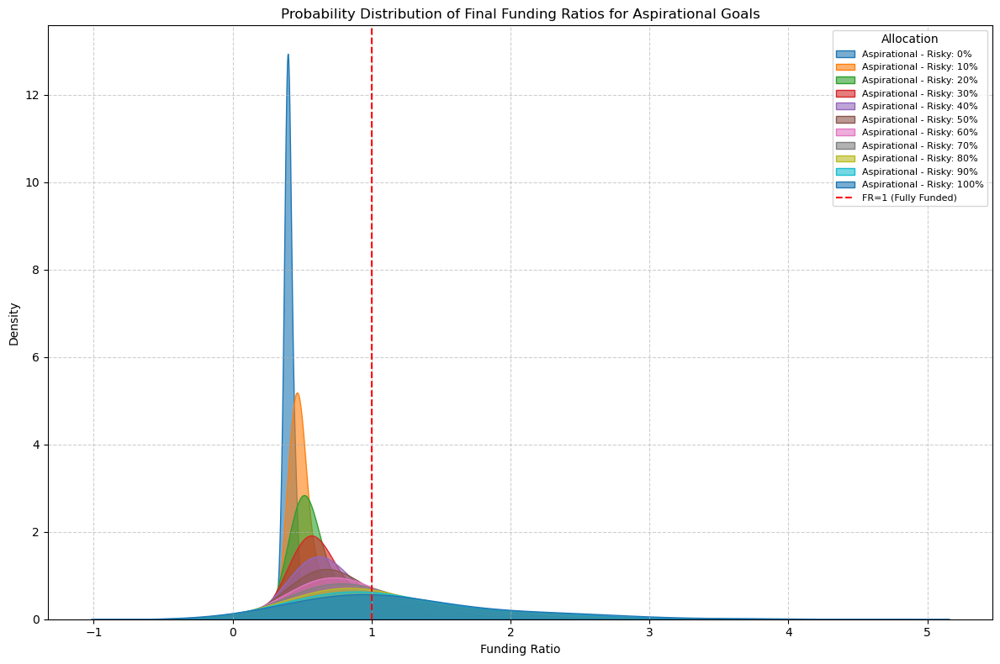

Summary of Final Funding Ratios:
Risky: 0% -> Aspirational: Mean: 0.40, Std Dev: 0.03
Risky: 10% -> Aspirational: Mean: 0.49, Std Dev: 0.07
Risky: 20% -> Aspirational: Mean: 0.57, Std Dev: 0.14
Risky: 30% -> Aspirational: Mean: 0.65, Std Dev: 0.21
Risky: 40% -> Aspirational: Mean: 0.74, Std Dev: 0.29
Risky: 50% -> Aspirational: Mean: 0.82, Std Dev: 0.36
Risky: 60% -> Aspirational: Mean: 0.91, Std Dev: 0.43
Risky: 70% -> Aspirational: Mean: 0.99, Std Dev: 0.50
Risky: 80% -> Aspirational: Mean: 1.07, Std Dev: 0.57
Risky: 90% -> Aspirational: Mean: 1.16, Std Dev: 0.65
Risky: 100% -> Aspirational: Mean: 1.24, Std Dev: 0.72


In [963]:
# Plot the probability distribution (Density) of funding ratios at the final day for both essential and aspirational goals
plt.figure(figsize=(12, 8))

# Plot for Aspirational Goal Funding Ratios
for risky_percentage, funding_ratios in final_funding_ratios_aspirational.items():
    sns.kdeplot(funding_ratios, bw_adjust=1.5, fill=True, alpha=0.6, label=f"Aspirational - Risky: {risky_percentage*100:.0f}%")

# Formatting the plot
plt.title("Probability Distribution of Final Funding Ratios for Aspirational Goals")
plt.xlabel("Funding Ratio")
plt.ylabel("Density")
plt.axvline(x=1, color='red', linestyle='--', label='FR=1 (Fully Funded)')
plt.legend(title="Allocation", loc="upper right", fontsize=8)
plt.grid(True, linestyle="--", alpha=0.6)
plt.tight_layout()
plt.show()

# Summary statistics for funding ratios
print("Summary of Final Funding Ratios:")
for risky_percentage in weights:
    # Calculate mean and standard deviation for final funding ratios
    mean_aspirational = np.mean(final_funding_ratios_aspirational[risky_percentage])
    std_aspirational = np.std(final_funding_ratios_aspirational[risky_percentage])

    print(f"Risky: {risky_percentage*100:.0f}% -> Aspirational: Mean: {mean_aspirational:.2f}, Std Dev: {std_aspirational:.2f}")

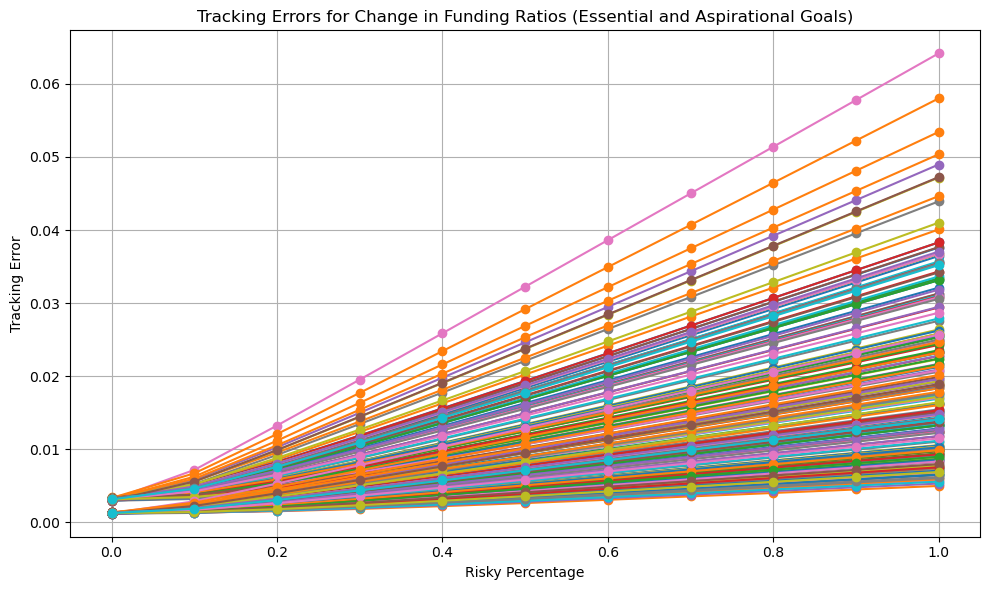

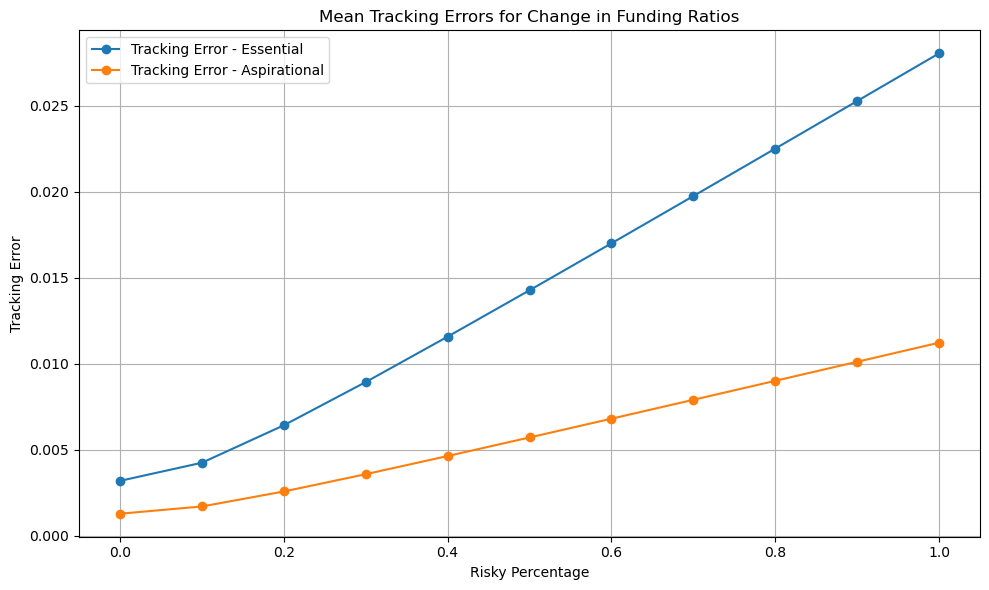

In [930]:
# Initialize dictionaries
tracking_errors_essential = {}
tracking_errors_aspirational = {}

# Compute tracking errors efficiently for each weight allocation
for risky_percentage in weights:
    # Compute funding ratio changes (returns)
    change_essential = np.diff(funding_ratios_essential[risky_percentage], axis=1)  # Shape (n_simulations, n_days - 1)
    change_aspirational = np.diff(funding_ratios_aspirational[risky_percentage], axis=1)

    change_essential = np.diff(funding_ratios_essential[risky_percentage], axis=1)  # Shape (n_simulations, n_days - 1)
    change_aspirational = np.diff(funding_ratios_aspirational[risky_percentage], axis=1)
    
    # Compute tracking errors (std dev of changes)
    tracking_errors_essential[risky_percentage] = np.nanstd(change_essential, axis=1)  # Shape (n_simulations,)
    tracking_errors_aspirational[risky_percentage] = np.nanstd(change_aspirational, axis=1)

# Convert to lists for plotting
risk_levels = list(tracking_errors_essential.keys())

# Compute mean tracking errors for visualization
mean_te_essential = [np.mean(te) for te in tracking_errors_essential.values()]
mean_te_aspirational = [np.mean(te) for te in tracking_errors_aspirational.values()]

# Plot tracking errors
plt.figure(figsize=(10, 6))
plt.plot(list(tracking_errors_essential.keys()), [te for te in tracking_errors_essential.values()], label="Tracking Error - Essential", marker='o')
plt.plot(list(tracking_errors_aspirational.keys()), [te for te in tracking_errors_aspirational.values()], label="Tracking Error - Aspirational", marker='o')
plt.title("Tracking Errors for Change in Funding Ratios (Essential and Aspirational Goals)")
plt.xlabel("Risky Percentage")
plt.ylabel("Tracking Error")
plt.grid(True)
plt.tight_layout()
plt.show()

# Plot individual tracking errors per risky percentage
plt.figure(figsize=(10, 6))
plt.plot(risk_levels, mean_te_essential, label="Tracking Error - Essential", marker='o')
plt.plot(risk_levels, mean_te_aspirational, label="Tracking Error - Aspirational", marker='o')
plt.title("Mean Tracking Errors for Change in Funding Ratios")
plt.xlabel("Risky Percentage")
plt.ylabel("Tracking Error")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

---

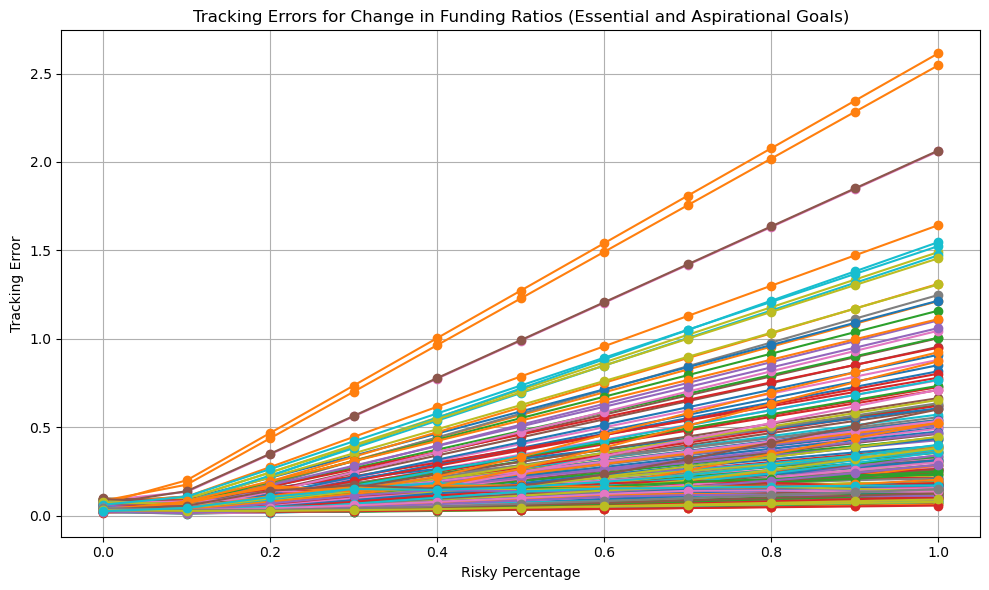

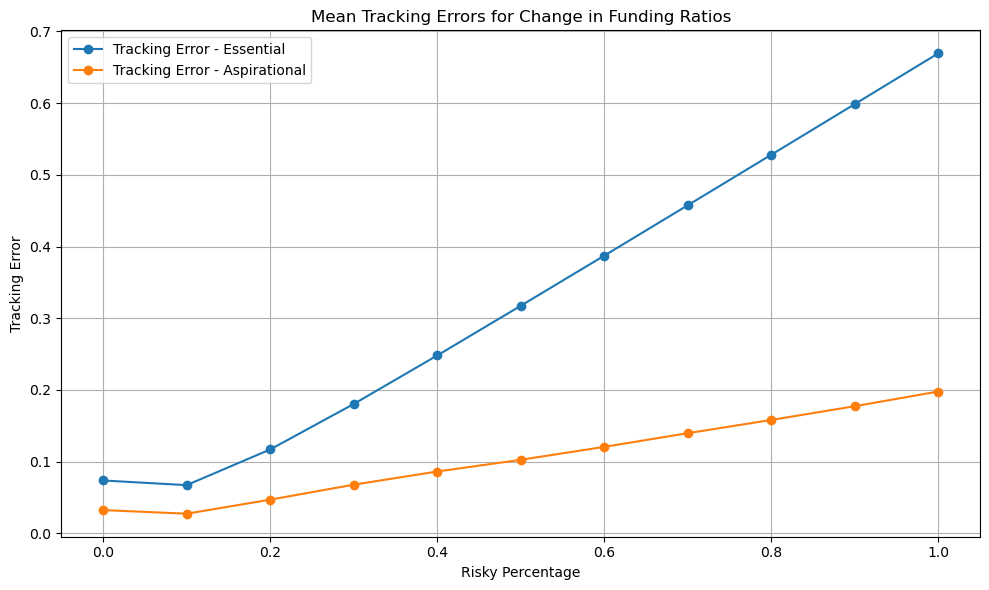

In [932]:
# Initialize dictionaries
tracking_errors_essential = {}
tracking_errors_aspirational = {}

# Compute tracking errors efficiently for each weight allocation
for risky_percentage in weights:
    
    change_essential = funding_diff_essential[risky_percentage]  # Shape (n_simulations, n_days - 1)
    change_aspirational = funding_diff_aspirational[risky_percentage]
    
    # Compute tracking errors (std dev of changes)
    tracking_errors_essential[risky_percentage] = np.nanstd(change_essential, axis=1)  # Shape (n_simulations,)
    tracking_errors_aspirational[risky_percentage] = np.nanstd(change_aspirational, axis=1)

# Convert to lists for plotting
risk_levels = list(tracking_errors_essential.keys())

# Compute mean tracking errors for visualization
mean_te_essential = [np.mean(te) for te in tracking_errors_essential.values()]
mean_te_aspirational = [np.mean(te) for te in tracking_errors_aspirational.values()]

# Plot tracking errors
plt.figure(figsize=(10, 6))
plt.plot(list(tracking_errors_essential.keys()), [te for te in tracking_errors_essential.values()], label="Tracking Error - Essential", marker='o')
plt.plot(list(tracking_errors_aspirational.keys()), [te for te in tracking_errors_aspirational.values()], label="Tracking Error - Aspirational", marker='o')
plt.title("Tracking Errors for Change in Funding Ratios (Essential and Aspirational Goals)")
plt.xlabel("Risky Percentage")
plt.ylabel("Tracking Error")
plt.grid(True)
plt.tight_layout()
plt.show()

# Plot individual tracking errors per risky percentage
plt.figure(figsize=(10, 6))
plt.plot(risk_levels, mean_te_essential, label="Tracking Error - Essential", marker='o')
plt.plot(risk_levels, mean_te_aspirational, label="Tracking Error - Aspirational", marker='o')
plt.title("Mean Tracking Errors for Change in Funding Ratios")
plt.xlabel("Risky Percentage")
plt.ylabel("Tracking Error")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

## GHP

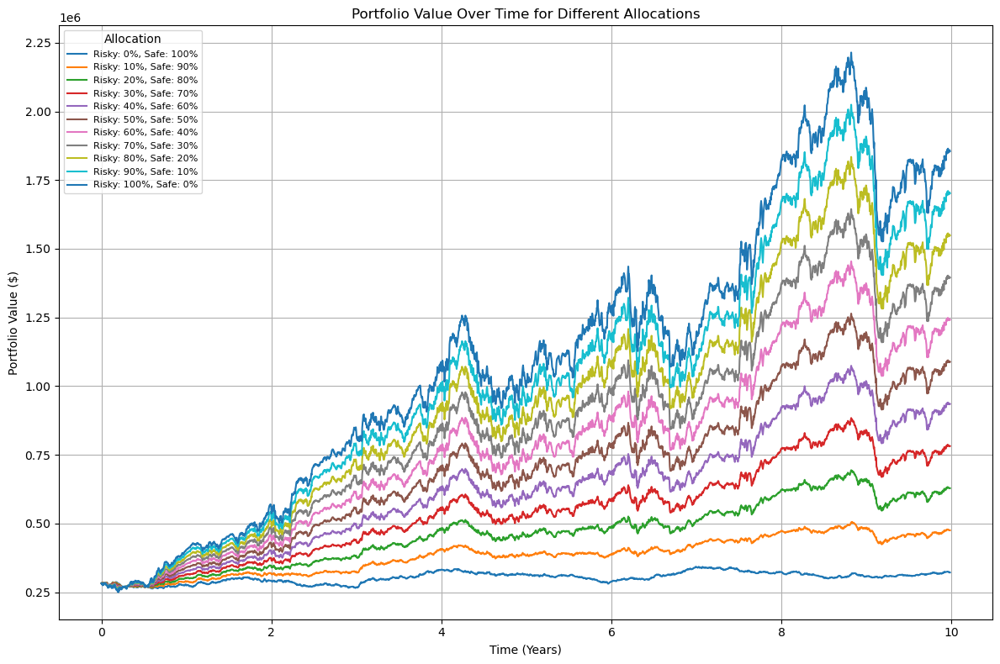

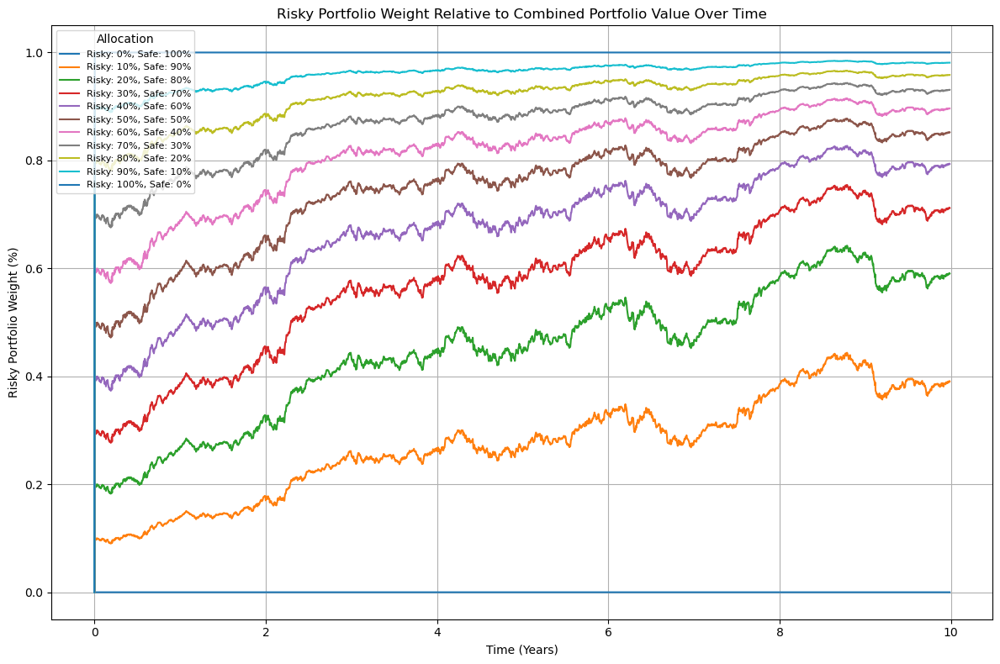

Final Portfolio Values for Different Allocations:
Risky: 0%, Safe: 100% -> Final Value: $321747.84
Risky: 10%, Safe: 90% -> Final Value: $475075.71
Risky: 20%, Safe: 80% -> Final Value: $628403.57
Risky: 30%, Safe: 70% -> Final Value: $781731.44
Risky: 40%, Safe: 60% -> Final Value: $935059.31
Risky: 50%, Safe: 50% -> Final Value: $1088387.17
Risky: 60%, Safe: 40% -> Final Value: $1241715.04
Risky: 70%, Safe: 30% -> Final Value: $1395042.90
Risky: 80%, Safe: 20% -> Final Value: $1548370.77
Risky: 90%, Safe: 10% -> Final Value: $1701698.64
Risky: 100%, Safe: 0% -> Final Value: $1855026.50


In [79]:
# # Sample initial data (replace with your actual data)
# savings = 25000
# essential = 20000
# aspirational = 50000

# savings_pv = []
# essential_pv = []
# aspirational_pv = []

# # Assuming 'yields_today' is already defined elsewhere
# for i in range(10, 30):
#     savings_pv.append(savings / ((1 + yields_today[i])**i))
#     essential_pv.append(essential / ((1 + yields_today[i])**i))
#     aspirational_pv.append(aspirational / ((1 + yields_today[i])**i))

# Total value of savings
total_value = savings_pv_mean[0]

# Define weight range
weights = np.arange(0.0, 1.1, 0.1)
portfolio_results = {}
weight_tracking = {}

# Assuming 'simulated_safe_ret_daily' and 'simulated_risky_ret_daily' are already defined
n_days = simulated_safe_ret_daily_ghp.shape[0]
n_simulations = simulated_safe_ret_daily_ghp.shape[1]

# Reshape the returns data to avoid nested loops
simulated_risky_ret_daily_array = simulated_risky_ret_daily.values
simulated_safe_ret_daily_array = simulated_safe_ret_daily_ghp.values

# Remove the first observation from simulated_risky_ret_daily_array to match the shape of simulated_safe_ret_daily_array
simulated_risky_ret_daily_array = simulated_risky_ret_daily_array[1:, :]

# Loop through each weight allocation
for risky_percentage in weights:
    safe_percentage = 1 - risky_percentage
    
    # Initialize portfolio values
    risky_portfolio_value = np.zeros((n_simulations, n_days))
    safe_portfolio_value = np.zeros((n_simulations, n_days))
    risky_weight = np.zeros((n_simulations, n_days))
    
    # Initial investments (scalars)
    risky_initial_investment = total_value * risky_percentage
    safe_initial_investment = total_value * safe_percentage
    
    # Assign initial values
    risky_portfolio_value[:, 0] = risky_initial_investment
    safe_portfolio_value[:, 0] = safe_initial_investment
    
    # Compute portfolio growth across all simulations at once
    for t in range(1, n_days):
        # Ensure the returns are correctly sliced for each simulation
        risky_portfolio_value[:, t] = risky_portfolio_value[:, t-1] * (1 + simulated_risky_ret_daily_array[t-1, :])
        safe_portfolio_value[:, t] = safe_portfolio_value[:, t-1] * (1 + simulated_safe_ret_daily_array[t-1, :])
        
        # Total portfolio value
        combined_portfolio_value = risky_portfolio_value[:, t] + safe_portfolio_value[:, t]
        
        # Weighting of risky asset
        risky_weight[:, t] = risky_portfolio_value[:, t] / combined_portfolio_value
    
    # Store results for each allocation
    portfolio_results[risky_percentage] = risky_portfolio_value + safe_portfolio_value
    weight_tracking[risky_percentage] = risky_weight

# Time years for plotting
time_years = np.arange(0, n_days) / 252

# Plot portfolio values over time for different allocations
plt.figure(figsize=(12, 8))
for risky_percentage, combined_portfolio_value in portfolio_results.items():
    plt.plot(time_years, combined_portfolio_value[0], label=f"Risky: {risky_percentage*100:.0f}%, Safe: {(1-risky_percentage)*100:.0f}%")

plt.title("Portfolio Value Over Time for Different Allocations")
plt.xlabel("Time (Years)")
plt.ylabel("Portfolio Value ($)")
plt.grid(True)
plt.legend(title="Allocation", loc="upper left", fontsize=8)
plt.tight_layout()
plt.show()

# Plot risky portfolio weight over time
plt.figure(figsize=(12, 8))
for risky_percentage, risky_weight in weight_tracking.items():
    plt.plot(time_years, risky_weight[0], label=f"Risky: {risky_percentage*100:.0f}%, Safe: {(1-risky_percentage)*100:.0f}%")

plt.title("Risky Portfolio Weight Relative to Combined Portfolio Value Over Time")
plt.xlabel("Time (Years)")
plt.ylabel("Risky Portfolio Weight (%)")
plt.grid(True)
plt.legend(title="Allocation", loc="upper left", fontsize=8)
plt.tight_layout()
plt.show()

# Print final portfolio values
print("Final Portfolio Values for Different Allocations:")
for risky_percentage, combined_portfolio_value in portfolio_results.items():
    print(f"Risky: {risky_percentage*100:.0f}%, Safe: {(1-risky_percentage)*100:.0f}% -> Final Value: ${combined_portfolio_value[0, -1]:.2f}")

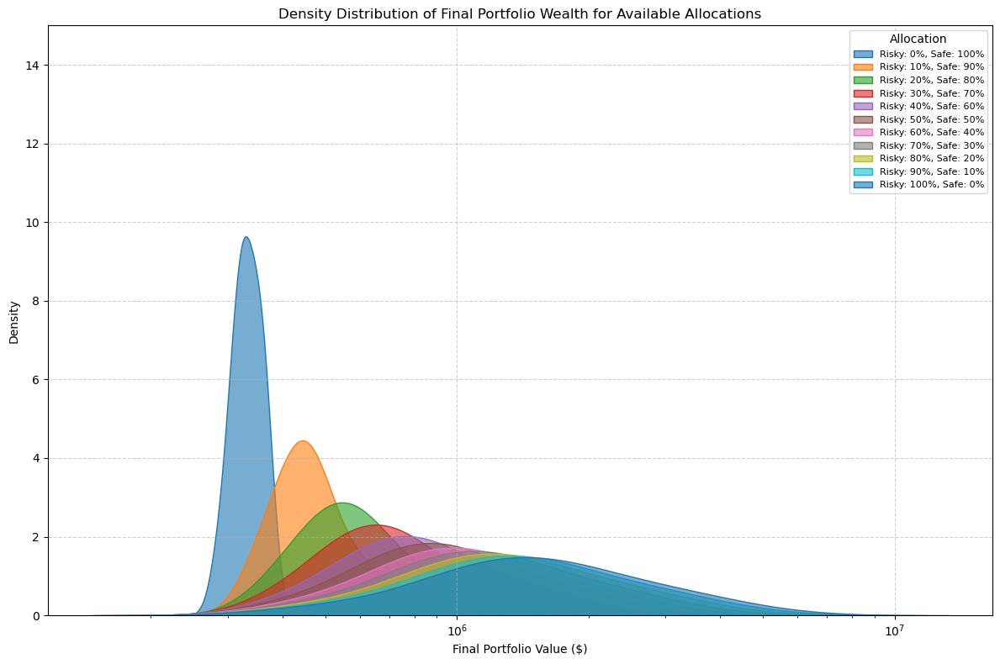

Summary of Final Portfolio Values for Available Allocations:
Risky: 0%, Safe: 100% -> Mean: $332436.23, Std Dev: $25015.99
Risky: 10%, Safe: 90% -> Mean: $471844.95, Std Dev: $98095.50
Risky: 20%, Safe: 80% -> Mean: $611253.67, Std Dev: $193361.65
Risky: 30%, Safe: 70% -> Mean: $750662.39, Std Dev: $289696.05
Risky: 40%, Safe: 60% -> Mean: $890071.10, Std Dev: $386300.34
Risky: 50%, Safe: 50% -> Mean: $1029479.82, Std Dev: $483012.60
Risky: 60%, Safe: 40% -> Mean: $1168888.54, Std Dev: $579778.81
Risky: 70%, Safe: 30% -> Mean: $1308297.25, Std Dev: $676575.81
Risky: 80%, Safe: 20% -> Mean: $1447705.97, Std Dev: $773392.06
Risky: 90%, Safe: 10% -> Mean: $1587114.69, Std Dev: $870221.11
Risky: 100%, Safe: 0% -> Mean: $1726523.40, Std Dev: $967059.14


In [81]:
# Dynamically get available allocations from portfolio_results
selected_allocations = list(portfolio_results.keys())  # Extract available risk allocations

# Compute final wealth distribution dynamically
final_wealth_distribution = {
    risky_pct: portfolio_results[risky_pct][:, -1]  # Extract final wealth per simulation
    for risky_pct in selected_allocations
}

plt.figure(figsize=(12, 8))
max_density = 15  # Adjust this value as needed

for risky_pct, final_wealth in final_wealth_distribution.items():
    if len(final_wealth) > 0:  # Ensure non-empty dataset
        sns.kdeplot(final_wealth, bw_adjust=1.5, fill=True, alpha=0.6, log_scale=True,
                    label=f"Risky: {risky_pct*100:.0f}%, Safe: {(1-risky_pct)*100:.0f}%")

plt.title("Density Distribution of Final Portfolio Wealth for Available Allocations")
plt.xlabel("Final Portfolio Value ($)")
plt.ylabel("Density")
plt.legend(title="Allocation", loc="upper right", fontsize=8)
plt.grid(True, linestyle="--", alpha=0.6)
plt.ylim(0, max_density)  # Caps the density
plt.tight_layout()
plt.show()


# Print summary statistics
print("Summary of Final Portfolio Values for Available Allocations:")
for risky_pct, final_wealth in final_wealth_distribution.items():
    print(f"Risky: {risky_pct*100:.0f}%, Safe: {(1-risky_pct)*100:.0f}% -> Mean: ${np.mean(final_wealth):.2f}, Std Dev: ${np.std(final_wealth):.2f}")

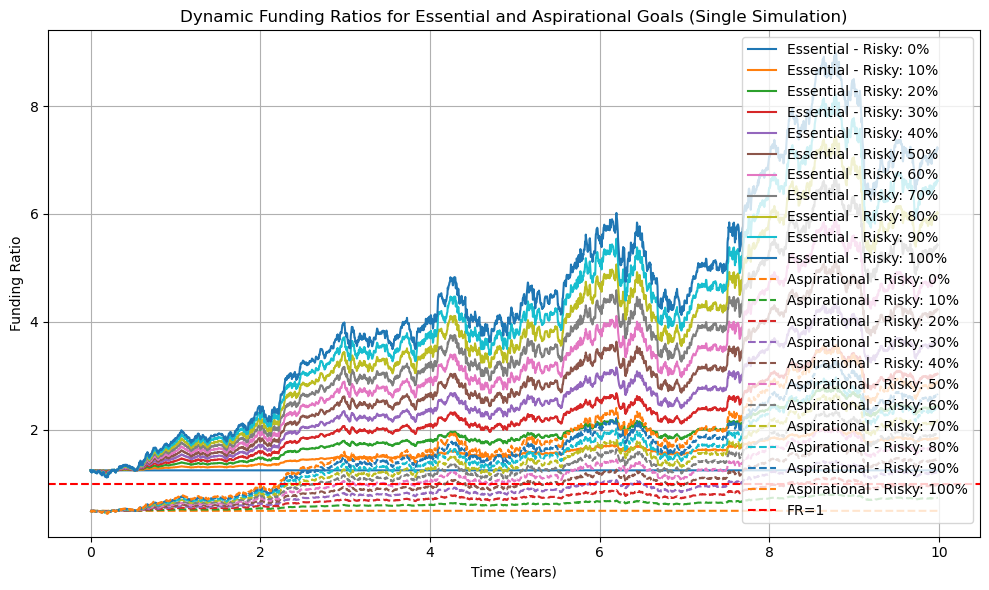

In [83]:
# Initialize dictionaries for funding ratios
funding_ratios_essential = {}
funding_ratios_aspirational = {}

funding_diff_essential = {}
funding_diff_aspirational = {}

avg_funding_ratios_essential = {}
avg_funding_ratios_aspirational = {}

# Ensure essential and aspirational PVs are 2D arrays
essential_pv = np.asarray(essential_goals_pv)  # Shape: (n_simulations, n_days)
aspirational_pv = np.asarray(aspirational_goals_pv)  # Shape: (n_simulations, n_days)

n_simulations, n_days = essential_pv.shape

# Compute funding ratios efficiently for each weight allocation
for risky_percentage in weights:
    # Extract and transpose portfolio values (Shape: (n_simulations, n_days))
    portfolio_value = portfolio_results[risky_percentage]

    # Ensure consistent length across arrays
    min_length = min(portfolio_value.shape[1], n_days)

    # Use NumPy broadcasting for efficient element-wise division
    funding_ratios_essential[risky_percentage] = portfolio_value[:, :min_length] / essential_pv[:, :min_length]
    funding_ratios_aspirational[risky_percentage] = portfolio_value[:, :min_length] / aspirational_pv[:, :min_length]

    funding_diff_essential[risky_percentage] = np.abs(portfolio_value[:, :min_length] - essential_pv[:, :min_length]) / essential_pv[:, :min_length]
    funding_diff_aspirational[risky_percentage] = np.abs(portfolio_value[:, :min_length] - aspirational_pv[:, :min_length]) / aspirational_pv[:, :min_length]

    # Compute the average funding ratios across all simulations at each time point
    avg_funding_ratios_essential[risky_percentage] = np.mean(funding_ratios_essential[risky_percentage], axis=0)
    avg_funding_ratios_aspirational[risky_percentage] = np.mean(funding_ratios_aspirational[risky_percentage], axis=0)

# Convert time to years
time_years = np.arange(min_length) / 252

# Choose a simulation index for visualization
simulation_index = 0  # Adjust index to view different simulations

# Plot funding ratios
plt.figure(figsize=(10, 6))

# Plot Essential Goal Funding Ratios
for risky_percentage, funding_ratio in funding_ratios_essential.items():
    plt.plot(time_years, funding_ratio[simulation_index, :], label=f"Essential - Risky: {risky_percentage*100:.0f}%")

# Plot Aspirational Goal Funding Ratios (Dashed Line Style)
for risky_percentage, funding_ratio in funding_ratios_aspirational.items():
    plt.plot(time_years, funding_ratio[simulation_index, :], linestyle='dashed', label=f"Aspirational - Risky: {risky_percentage*100:.0f}%")

# Formatting the plot
plt.title("Dynamic Funding Ratios for Essential and Aspirational Goals (Single Simulation)")
plt.xlabel("Time (Years)")
plt.ylabel("Funding Ratio")
plt.axhline(y=1, color='red', linestyle='--', label='FR=1')  # Reference line at FR=1
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

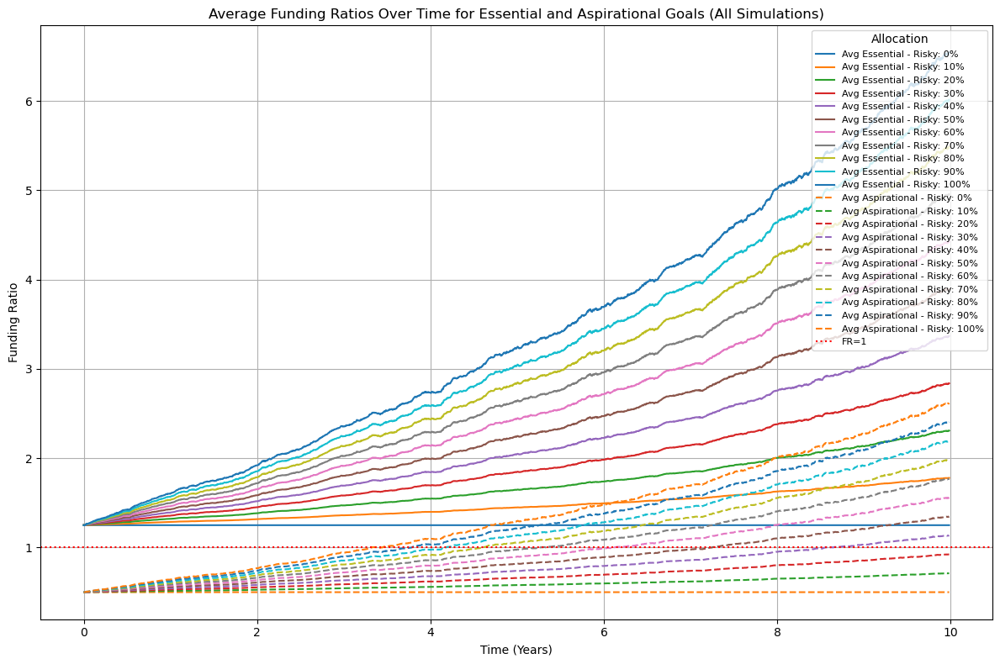

In [85]:
# Plot the average funding ratio paths
plt.figure(figsize=(12, 8))

# Plot Average Essential Goal Funding Ratios over time for each allocation
for risky_percentage, avg_funding_ratio in avg_funding_ratios_essential.items():
    plt.plot(time_years, avg_funding_ratio, label=f"Avg Essential - Risky: {risky_percentage*100:.0f}%")

# Plot Average Aspirational Goal Funding Ratios over time (Dashed Line Style)
for risky_percentage, avg_funding_ratio in avg_funding_ratios_aspirational.items():
    plt.plot(time_years, avg_funding_ratio, linestyle='dashed', label=f"Avg Aspirational - Risky: {risky_percentage*100:.0f}%")

# Formatting the plot
plt.title("Average Funding Ratios Over Time for Essential and Aspirational Goals (All Simulations)")
plt.xlabel("Time (Years)")
plt.ylabel("Funding Ratio")
plt.axhline(y=1, color='red', linestyle=':', label='FR=1')  # Reference line at FR=1
plt.grid(True)
plt.legend(title="Allocation", loc="upper right", fontsize=8)
plt.tight_layout()
plt.show()

In [87]:
# Initialize dictionaries to store the funding ratios at the final day and probabilities
final_funding_ratios_essential = {}
final_funding_ratios_aspirational = {}
probability_above_1_essential = {}
probability_above_1_aspirational = {}

# Loop through each weight allocation to extract funding ratios at the final day
for risky_percentage in weights:
    # Extract portfolio value and funding ratios
    portfolio_value = portfolio_results[risky_percentage]
    
    # Ensure consistent length across arrays
    min_length = min(portfolio_value.shape[1], n_days)
    
    # Calculate funding ratios at the final day (last time point)
    final_funding_ratios_essential[risky_percentage] = funding_ratios_essential[risky_percentage][:, -1]
    final_funding_ratios_aspirational[risky_percentage] = funding_ratios_aspirational[risky_percentage][:, -1]
    
    # Calculate the probability of the funding ratio being greater than 1 at the final day
    probability_above_1_essential[risky_percentage] = np.mean(final_funding_ratios_essential[risky_percentage] > 1)
    probability_above_1_aspirational[risky_percentage] = np.mean(final_funding_ratios_aspirational[risky_percentage] > 1)

# Optionally, print the probabilities
print("Probability of Funding Ratio > 1 (Essential Goals):")
print(probability_above_1_essential)

print("Probability of Funding Ratio > 1 (Aspirational Goals):")
print(probability_above_1_aspirational)

Probability of Funding Ratio > 1 (Essential Goals):
{0.0: 1.0, 0.1: 1.0, 0.2: 1.0, 0.30000000000000004: 1.0, 0.4: 1.0, 0.5: 1.0, 0.6000000000000001: 1.0, 0.7000000000000001: 1.0, 0.8: 1.0, 0.9: 1.0, 1.0: 1.0}
Probability of Funding Ratio > 1 (Aspirational Goals):
{0.0: 0.0, 0.1: 0.05, 0.2: 0.27, 0.30000000000000004: 0.47, 0.4: 0.69, 0.5: 0.8, 0.6000000000000001: 0.84, 0.7000000000000001: 0.87, 0.8: 0.91, 0.9: 0.92, 1.0: 0.92}


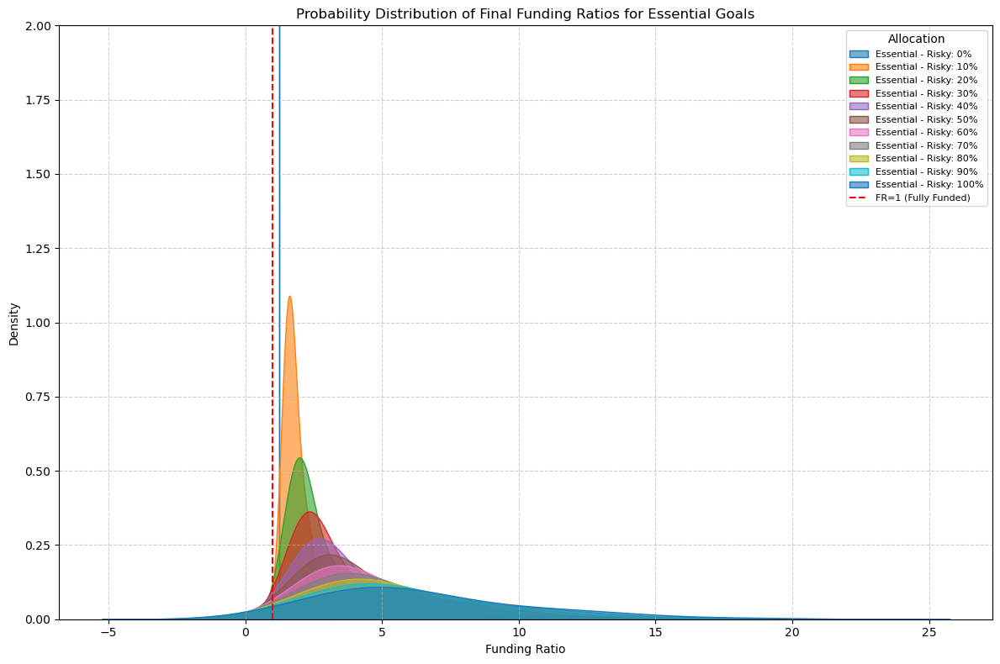

Summary of Final Funding Ratios:
Risky: 0% -> Essential: Mean: 1.25, Std Dev: 0.00
Risky: 10% -> Essential: Mean: 1.78, Std Dev: 0.37
Risky: 20% -> Essential: Mean: 2.31, Std Dev: 0.74
Risky: 30% -> Essential: Mean: 2.84, Std Dev: 1.11
Risky: 40% -> Essential: Mean: 3.37, Std Dev: 1.48
Risky: 50% -> Essential: Mean: 3.90, Std Dev: 1.85
Risky: 60% -> Essential: Mean: 4.43, Std Dev: 2.22
Risky: 70% -> Essential: Mean: 4.95, Std Dev: 2.59
Risky: 80% -> Essential: Mean: 5.48, Std Dev: 2.96
Risky: 90% -> Essential: Mean: 6.01, Std Dev: 3.33
Risky: 100% -> Essential: Mean: 6.54, Std Dev: 3.70


In [103]:
# Plot the probability distribution (Density) of funding ratios at the final day for both essential and aspirational goals
plt.figure(figsize=(12, 8))
max_density = 2

# Plot for Essential Goal Funding Ratios
for risky_percentage, funding_ratios in final_funding_ratios_essential.items():
    sns.kdeplot(funding_ratios, bw_adjust=1.5, fill=True, alpha=0.6, label=f"Essential - Risky: {risky_percentage*100:.0f}%")

# Formatting the plot
plt.title("Probability Distribution of Final Funding Ratios for Essential Goals")
plt.xlabel("Funding Ratio")
plt.ylabel("Density")
plt.axvline(x=1, color='red', linestyle='--', label='FR=1 (Fully Funded)')
plt.legend(title="Allocation", loc="upper right", fontsize=8)
plt.ylim(0, max_density)  # Caps the density
plt.grid(True, linestyle="--", alpha=0.6)
plt.tight_layout()
plt.show()

# Summary statistics for funding ratios
print("Summary of Final Funding Ratios:")
for risky_percentage in weights:
    # Calculate mean and standard deviation for final funding ratios
    mean_essential = np.mean(final_funding_ratios_essential[risky_percentage])
    std_essential = np.std(final_funding_ratios_essential[risky_percentage])

    print(f"Risky: {risky_percentage*100:.0f}% -> Essential: Mean: {mean_essential:.2f}, Std Dev: {std_essential:.2f}")

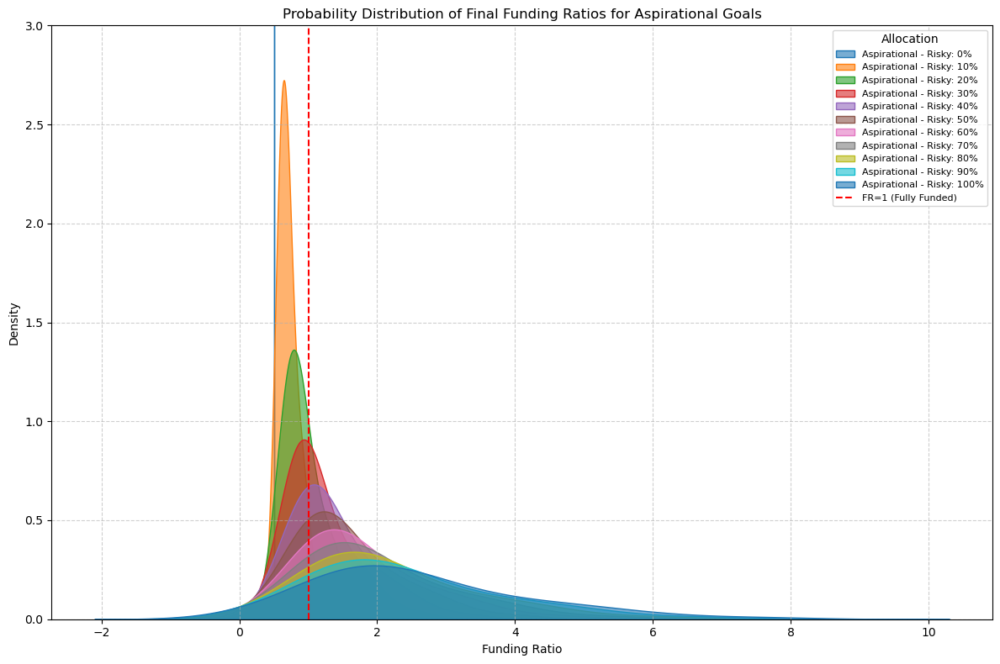

Summary of Final Funding Ratios:
Risky: 0% -> Aspirational: Mean: 0.50, Std Dev: 0.00
Risky: 10% -> Aspirational: Mean: 0.71, Std Dev: 0.15
Risky: 20% -> Aspirational: Mean: 0.92, Std Dev: 0.30
Risky: 30% -> Aspirational: Mean: 1.14, Std Dev: 0.44
Risky: 40% -> Aspirational: Mean: 1.35, Std Dev: 0.59
Risky: 50% -> Aspirational: Mean: 1.56, Std Dev: 0.74
Risky: 60% -> Aspirational: Mean: 1.77, Std Dev: 0.89
Risky: 70% -> Aspirational: Mean: 1.98, Std Dev: 1.04
Risky: 80% -> Aspirational: Mean: 2.19, Std Dev: 1.18
Risky: 90% -> Aspirational: Mean: 2.41, Std Dev: 1.33
Risky: 100% -> Aspirational: Mean: 2.62, Std Dev: 1.48


In [101]:
# Plot the probability distribution (Density) of funding ratios at the final day for both essential and aspirational goals
plt.figure(figsize=(12, 8))
max_density = 3

# Plot for Aspirational Goal Funding Ratios
for risky_percentage, funding_ratios in final_funding_ratios_aspirational.items():
    sns.kdeplot(funding_ratios, bw_adjust=1.5, fill=True, alpha=0.6, label=f"Aspirational - Risky: {risky_percentage*100:.0f}%")

# Formatting the plot
plt.title("Probability Distribution of Final Funding Ratios for Aspirational Goals")
plt.xlabel("Funding Ratio")
plt.ylabel("Density")
plt.axvline(x=1, color='red', linestyle='--', label='FR=1 (Fully Funded)')
plt.legend(title="Allocation", loc="upper right", fontsize=8)
plt.grid(True, linestyle="--", alpha=0.6)
plt.ylim(0, max_density)  # Caps the density
plt.tight_layout()
plt.show()

# Summary statistics for funding ratios
print("Summary of Final Funding Ratios:")
for risky_percentage in weights:
    # Calculate mean and standard deviation for final funding ratios
    mean_aspirational = np.mean(final_funding_ratios_aspirational[risky_percentage])
    std_aspirational = np.std(final_funding_ratios_aspirational[risky_percentage])

    print(f"Risky: {risky_percentage*100:.0f}% -> Aspirational: Mean: {mean_aspirational:.2f}, Std Dev: {std_aspirational:.2f}")

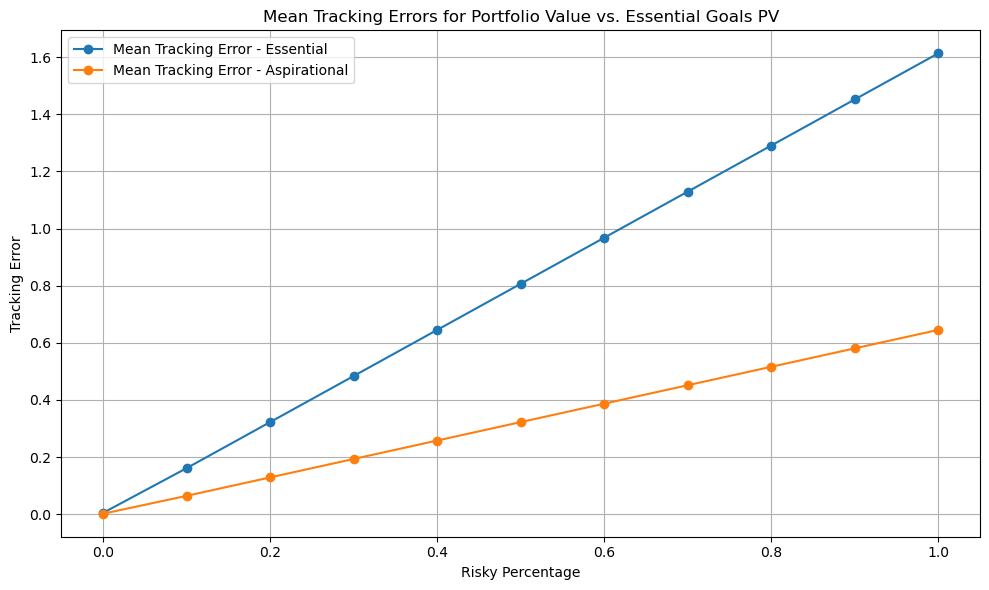

In [131]:
# Initialize dictionary for tracking errors
tracking_errors_essential = {}
tracking_errors_aspirational = {}

# Compute tracking errors efficiently for each weight allocation
for risky_percentage in weights:
    
    # Compute daily differences between portfolio value and essential goals PV
    diff_essential = (portfolio_results[risky_percentage].T - essential_goals_pv.T[1:]) / essential_goals_pv.T[1:]   # Shape (n_simulations, n_days)
    diff_aspirational = (portfolio_results[risky_percentage].T - aspirational_goals_pv.T[1:]) / aspirational_goals_pv.T[1:]   # Shape (n_simulations, n_days)

    # Compute daily changes
    #change_essential = np.diff(diff_essential, axis=1)  # Shape (n_simulations, n_days - 1)
    
    # Compute tracking error (standard deviation of daily changes)
    tracking_errors_essential[risky_percentage] = np.nanstd(diff_essential, axis=1)  # Shape (n_simulations,)
    tracking_errors_aspirational[risky_percentage] = np.nanstd(diff_aspirational, axis=1)  # Shape (n_simulations,)

# Convert to lists for plotting
risk_levels = list(tracking_errors_essential.keys())

# Compute mean tracking errors for visualization
mean_te_essential = [np.mean(te) for te in tracking_errors_essential.values()]
mean_te_aspirational = [np.mean(te) for te in tracking_errors_aspirational.values()]

# Plot tracking errors
# plt.figure(figsize=(10, 6))
# plt.plot(risk_levels, [te for te in tracking_errors_essential.values()], label="Tracking Error - Essential", marker='o')
# plt.title("Tracking Errors for Portfolio Value vs. Essential Goals PV")
# plt.xlabel("Risky Percentage")
# plt.ylabel("Tracking Error")
# plt.grid(True)
# #plt.legend()
# plt.tight_layout()
# plt.show()

# Plot mean tracking errors per risky percentage
plt.figure(figsize=(10, 6))
plt.plot(risk_levels, mean_te_essential, label="Mean Tracking Error - Essential", marker='o')
plt.plot(risk_levels, mean_te_aspirational, label="Mean Tracking Error - Aspirational", marker='o')
plt.title("Mean Tracking Errors for Portfolio Value vs. Essential Goals PV")
plt.xlabel("Risky Percentage")
plt.ylabel("Tracking Error")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

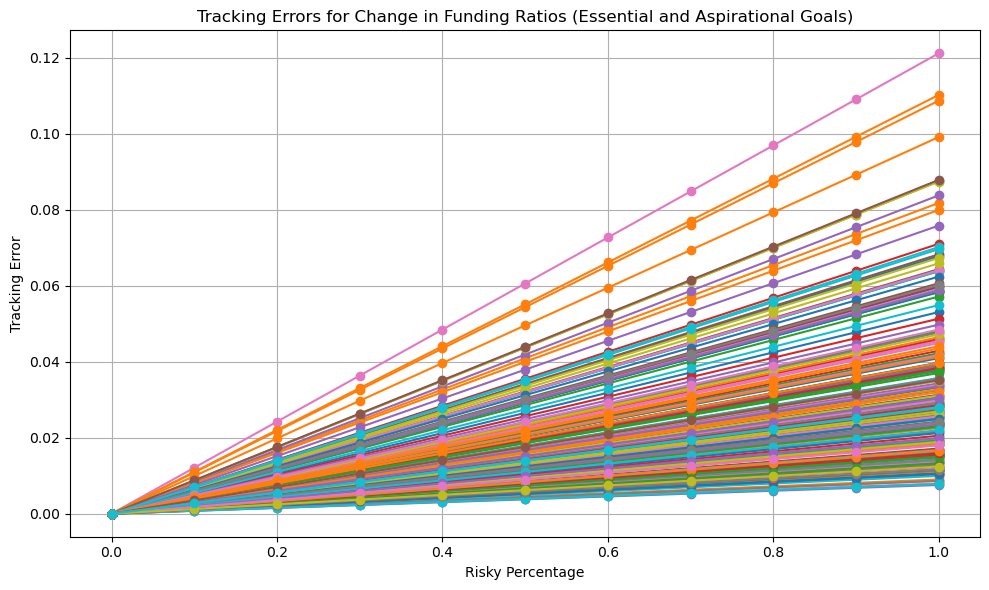

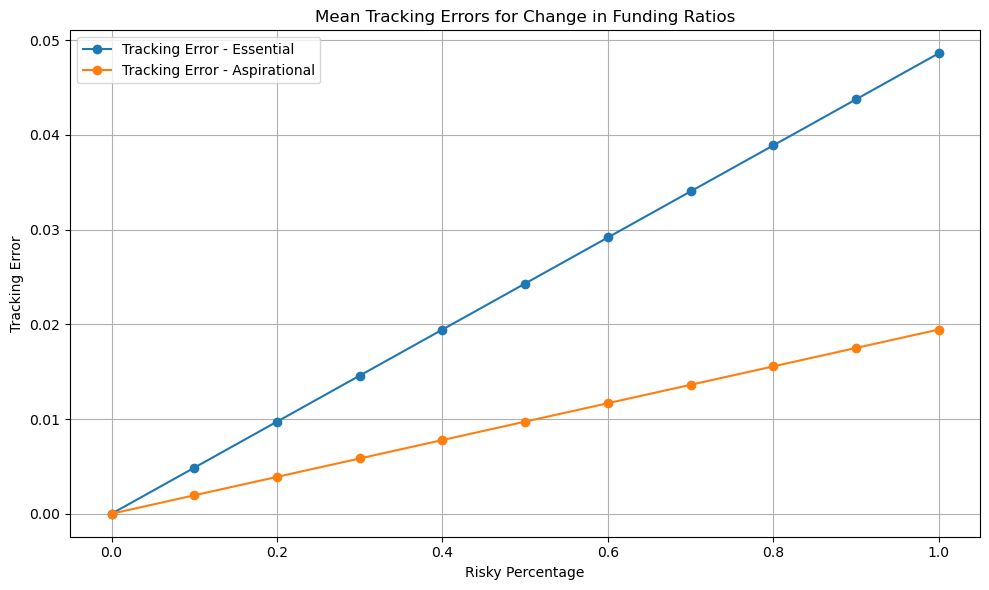

In [127]:
# Initialize dictionaries
tracking_errors_essential = {}
tracking_errors_aspirational = {}

# Compute tracking errors efficiently for each weight allocation
for risky_percentage in weights:
    # Compute funding ratio changes (returns)
    change_essential = np.diff(funding_ratios_essential[risky_percentage], axis=1)  # Shape (n_simulations, n_days - 1)
    change_aspirational = np.diff(funding_ratios_aspirational[risky_percentage], axis=1)

    change_essential = np.diff(funding_ratios_essential[risky_percentage], axis=1)  # Shape (n_simulations, n_days - 1)
    change_aspirational = np.diff(funding_ratios_aspirational[risky_percentage], axis=1)
    
    # Compute tracking errors (std dev of changes)
    tracking_errors_essential[risky_percentage] = np.nanstd(change_essential, axis=1)  # Shape (n_simulations,)
    tracking_errors_aspirational[risky_percentage] = np.nanstd(change_aspirational, axis=1)

# Convert to lists for plotting
risk_levels = list(tracking_errors_essential.keys())

# Compute mean tracking errors for visualization
mean_te_essential = [np.mean(te) for te in tracking_errors_essential.values()]
mean_te_aspirational = [np.mean(te) for te in tracking_errors_aspirational.values()]

# Plot tracking errors
plt.figure(figsize=(10, 6))
plt.plot(list(tracking_errors_essential.keys()), [te for te in tracking_errors_essential.values()], label="Tracking Error - Essential", marker='o')
plt.plot(list(tracking_errors_aspirational.keys()), [te for te in tracking_errors_aspirational.values()], label="Tracking Error - Aspirational", marker='o')
plt.title("Tracking Errors for Change in Funding Ratios (Essential and Aspirational Goals)")
plt.xlabel("Risky Percentage")
plt.ylabel("Tracking Error")
plt.grid(True)
plt.tight_layout()
plt.show()

# Plot individual tracking errors per risky percentage
plt.figure(figsize=(10, 6))
plt.plot(risk_levels, mean_te_essential, label="Tracking Error - Essential", marker='o')
plt.plot(risk_levels, mean_te_aspirational, label="Tracking Error - Aspirational", marker='o')
plt.title("Mean Tracking Errors for Change in Funding Ratios")
plt.xlabel("Risky Percentage")
plt.ylabel("Tracking Error")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

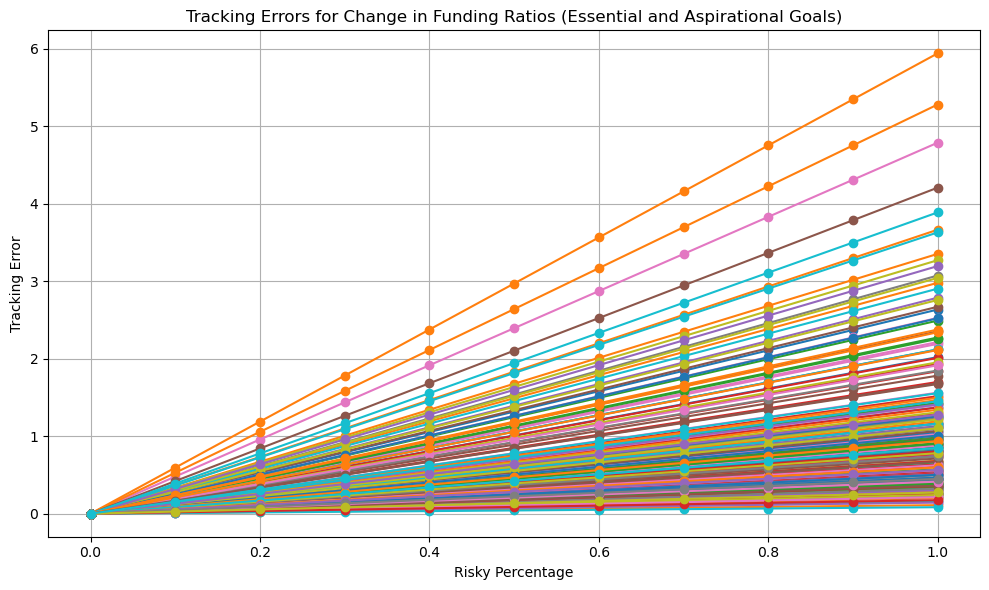

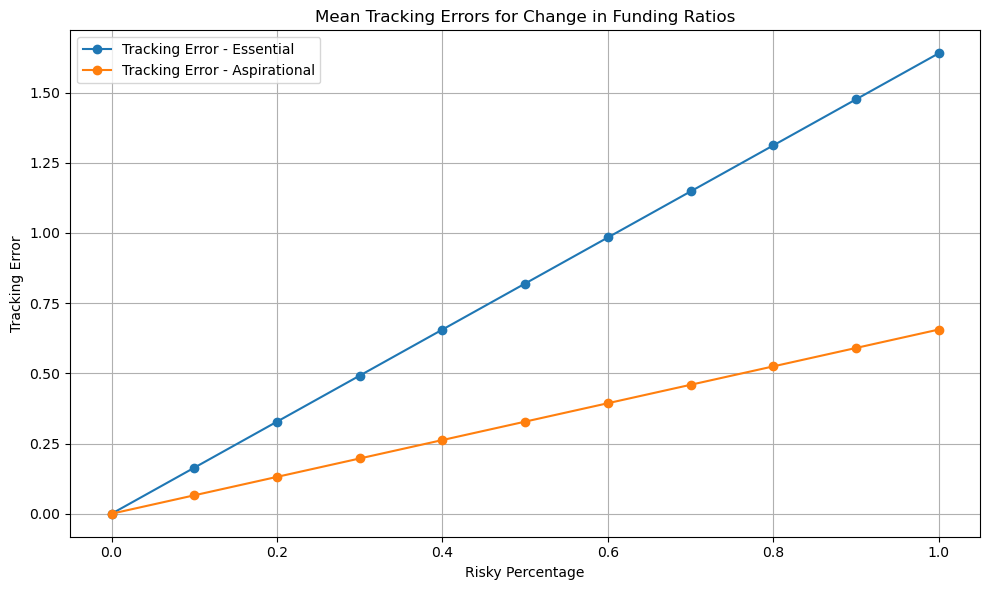

In [129]:
# Initialize dictionaries
tracking_errors_essential = {}
tracking_errors_aspirational = {}

# Compute tracking errors efficiently for each weight allocation
for risky_percentage in weights:
    
    change_essential = funding_ratios_essential[risky_percentage]  # Shape (n_simulations, n_days - 1)
    change_aspirational = funding_ratios_aspirational[risky_percentage]
    
    # Compute tracking errors (std dev of changes)
    tracking_errors_essential[risky_percentage] = np.nanstd(change_essential, axis=1)  # Shape (n_simulations,)
    tracking_errors_aspirational[risky_percentage] = np.nanstd(change_aspirational, axis=1)

# Convert to lists for plotting
risk_levels = list(tracking_errors_essential.keys())

# Compute mean tracking errors for visualization
mean_te_essential = [np.mean(te) for te in tracking_errors_essential.values()]
mean_te_aspirational = [np.mean(te) for te in tracking_errors_aspirational.values()]

# Plot tracking errors
plt.figure(figsize=(10, 6))
plt.plot(list(tracking_errors_essential.keys()), [te for te in tracking_errors_essential.values()], label="Tracking Error - Essential", marker='o')
plt.plot(list(tracking_errors_aspirational.keys()), [te for te in tracking_errors_aspirational.values()], label="Tracking Error - Aspirational", marker='o')
plt.title("Tracking Errors for Change in Funding Ratios (Essential and Aspirational Goals)")
plt.xlabel("Risky Percentage")
plt.ylabel("Tracking Error")
plt.grid(True)
plt.tight_layout()
plt.show()

# Plot individual tracking errors per risky percentage
plt.figure(figsize=(10, 6))
plt.plot(risk_levels, mean_te_essential, label="Tracking Error - Essential", marker='o')
plt.plot(risk_levels, mean_te_aspirational, label="Tracking Error - Aspirational", marker='o')
plt.title("Mean Tracking Errors for Change in Funding Ratios")
plt.xlabel("Risky Percentage")
plt.ylabel("Tracking Error")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

#### Older versions FR  

In [304]:
# funding_ratios_essential = {}
# funding_ratios_aspirational = {}

# # Convert essential and aspirational PVs to 2D arrays if they are not already
# essential_pv = np.array(essential_pv)  # Shape (n_simulations, time)
# aspirational_pv = np.array(aspirational_pv)  # Shape (n_simulations, time)

# # Ensure the shape consistency
# n_simulations, n_days = essential_pv.shape

# # Loop through each weight allocation
# for risky_percentage in weights:
    
#     # Extract portfolio values for all simulations
#     portfolio_value = np.array(portfolio_results[risky_percentage].iloc[:,:500])  # Shape (n_days, n_simulations)
#     portfolio_value = portfolio_value.T  # Now shape (n_simulations, n_days)
    
#     # Ensure the min length across all arrays
#     min_length = min(portfolio_value.shape[1], n_days)

#     # Compute funding ratios for all simulations at once
#     funding_ratio_essential = portfolio_value[:, :min_length] / essential_pv[:, :min_length]
#     funding_ratio_aspirational = portfolio_value[:, :min_length] / aspirational_pv[:, :min_length]

#     # Store in dictionary
#     funding_ratios_essential[risky_percentage] = funding_ratio_essential
#     funding_ratios_aspirational[risky_percentage] = funding_ratio_aspirational

# # Time in years
# time_years = np.arange(0, min_length) / 252

# # Select a specific simulation to plot
# simulation_index = 5  # Change this index to visualize different simulations

# # Plot funding ratios
# plt.figure(figsize=(10, 6))

# for risky_percentage, funding_ratio in funding_ratios_essential.items():
#     plt.plot(time_years, funding_ratio[simulation_index, :], label=f"Essential - Risky: {risky_percentage*100:.0f}%")

# for risky_percentage, funding_ratio in funding_ratios_aspirational.items():
#     plt.plot(time_years, funding_ratio[simulation_index, :], linestyle='dashed', label=f"Aspirational - Risky: {risky_percentage*100:.0f}%")

# plt.title("Dynamic Funding Ratios for Essential and Aspirational Goals (Single Simulation)")
# plt.xlabel("Time (Years)")
# plt.ylabel("Funding Ratio")
# plt.grid(True)
# plt.axhline(y=1, color='red', linestyle='--', label='FR=1')
# plt.legend()
# plt.tight_layout()
# plt.show()

In [222]:
# funding_ratios_essential = {}
# funding_ratios_aspirational = {}

# # Loop through each weight allocation
# for risky_percentage in weights:
    
#     funding_ratio_essential = []
#     funding_ratio_aspirational = []
    
#     for sim in range(n_simulations):
#         portfolio_value = portfolio_results[risky_percentage].iloc[:, sim]  # Select simulation-specific portfolio values
#         min_length = min(len(portfolio_value), len(essential_pv), len(aspirational_pv))
        
#         funding_ratio_essential.append(portfolio_value[:min_length] / essential_pv[:min_length])
#         funding_ratio_aspirational.append(portfolio_value[:min_length] / aspirational_pv[:min_length])
    
#     funding_ratios_essential[risky_percentage] = np.array(funding_ratio_essential)
#     funding_ratios_aspirational[risky_percentage] = np.array(funding_ratio_aspirational)

# # Time in years
# time_years = np.arange(0, len(essential_pv)) / 252

# # Select a specific simulation to plot
# simulation_index = 5  # Change this index to visualize different simulations

# # Plot funding ratios
# plt.figure(figsize=(10, 6))
# for risky_percentage, funding_ratio in funding_ratios_essential.items():
#     plt.plot(time_years[:funding_ratio.shape[1]], funding_ratio[simulation_index], label=f"Essential - Risky: {risky_percentage*100:.0f}%")
# for risky_percentage, funding_ratio in funding_ratios_aspirational.items():
#     plt.plot(time_years[:funding_ratio.shape[1]], funding_ratio[simulation_index], label=f"Aspirational - Risky: {risky_percentage*100:.0f}%")
# plt.title("Dynamic Funding Ratios for Essential and Aspirational Goals (Single Simulation)")
# plt.xlabel("Time (Years)")
# plt.ylabel("Funding Ratio")
# plt.grid(True)
# plt.axhline(y=1, color='red', linestyle='--', label='FR=1')
# #plt.legend()
# plt.tight_layout()
# plt.show()

In [244]:
# funding_ratio_essential = []
# funding_ratio_aspirational = []

# # Get the corresponding portfolio value for the given risky percentage
# portfolio_value = portfolio_results[0]
    
# # Ensure that the length of portfolio_value matches the length of essential_pv and aspirational_pv
# min_length = min(len(portfolio_value), len(essential_pv), len(aspirational_pv))  # Limit to the shortest length
    
# for i in range(min_length):
#     funding_ratio_essential.append(portfolio_value[i] / essential_pv[i])
#     funding_ratio_aspirational.append(portfolio_value[i] / aspirational_pv[i])

# # Convert results to numpy arrays or pandas DataFrames for further analysis
# funding_ratio_essential = np.array(funding_ratio_essential)
# funding_ratio_aspirational = np.array(funding_ratio_aspirational)

# time_years = np.arange(0, len(funding_ratio_essential)) / 252

# # Optionally, plot the funding ratios over time (for all days)
# plt.figure(figsize=(10, 6))
# plt.plot(time_years, funding_ratio_essential, label="Funding Ratio - Essential")
# plt.plot(time_years, funding_ratio_aspirational, label="Funding Ratio - Aspirational")
# plt.title("Dynamic Funding Ratios for Essential and Aspirational Goals (for each day, starting in 2014)")
# plt.xlabel("Time (Years)")
# plt.ylabel("Funding Ratio")
# plt.grid(True)
# plt.legend()
# plt.tight_layout()
# plt.show()

In [293]:
# # Initialize the plot
# plt.figure(figsize=(10, 6))

# # Loop through each risky percentage in portfolio_results
# for risky_percentage in portfolio_results.keys():
#     # Get the corresponding portfolio value for the given risky percentage
#     portfolio_value = portfolio_results[risky_percentage]
    
#     # Ensure that the length of portfolio_value matches the length of essential_pv and aspirational_pv
#     min_length = min(len(portfolio_value), len(essential_pv), len(aspirational_pv))  # Limit to the shortest length
    
#     # Initialize temporary lists for funding ratios for this risky percentage
#     temp_funding_ratio_essential = []
#     temp_funding_ratio_aspirational = []
    
#     # Calculate funding ratios for essential and aspirational goals
#     for i in range(min_length):
#         if essential_pv[i] != 0:  # Avoid division by zero
#             temp_funding_ratio_essential.append(portfolio_value[i] / essential_pv[i])
#         else:
#             temp_funding_ratio_essential.append(np.nan)  # Handle division by zero if essential_pv is zero
        
#         if aspirational_pv[i] != 0:  # Avoid division by zero
#             temp_funding_ratio_aspirational.append(portfolio_value[i] / aspirational_pv[i])
#         else:
#             temp_funding_ratio_aspirational.append(np.nan)  # Handle division by zero if aspirational_pv is zero
    
#     # Convert to numpy arrays for plotting
#     temp_funding_ratio_essential = np.array(temp_funding_ratio_essential)
#     temp_funding_ratio_aspirational = np.array(temp_funding_ratio_aspirational)

#     time_years = np.arange(0, len(temp_funding_ratio_essential)) / 252
    
#     # Plot the funding ratios for essential and aspirational goals as separate lines for each risky percentage
#     plt.plot(time_years, temp_funding_ratio_essential, label=f"Essential - Risk {risky_percentage*100:.2f}%")
#     plt.plot(time_years, temp_funding_ratio_aspirational, label=f"Aspirational - Risk {risky_percentage*100:.2f}%")

#     #print(temp_funding_ratio_aspirational[-1])

# # Add title, labels, and legend
# plt.title("Dynamic Funding Ratios for Essential and Aspirational Goals (for each day, starting from 2014)")
# plt.xlabel("Time (Years)")
# plt.ylabel("Funding Ratio")
# plt.grid(True)
# plt.axhline(y=1, color='red', linestyle='--', label='FR=1')
# #plt.legend()
# plt.tight_layout()

# # Show the plot
# plt.show()

In [295]:
# # Initialize a dictionary to store tracking errors for each risky percentage
# tracking_errors_essential = {}
# tracking_errors_aspirational = {}

# # Loop through each risky percentage in portfolio_results
# for risky_percentage in portfolio_results.keys():
#     # Get the corresponding portfolio value for the given risky percentage
#     portfolio_value = portfolio_results[risky_percentage]
    
#     # Ensure that the length of portfolio_value matches the length of essential_pv and aspirational_pv
#     min_length = min(len(portfolio_value), len(essential_pv), len(aspirational_pv))  # Limit to the shortest length
    
#     # Initialize temporary lists for funding ratios for this risky percentage
#     temp_funding_ratio_essential = []
#     temp_funding_ratio_aspirational = []
    
#     # Calculate funding ratios for essential and aspirational goals
#     for i in range(min_length):
#         if essential_pv[i] != 0:  # Avoid division by zero
#             temp_funding_ratio_essential.append(portfolio_value[i] / essential_pv[i])
#         else:
#             temp_funding_ratio_essential.append(np.nan)  # Handle division by zero if essential_pv is zero
        
#         if aspirational_pv[i] != 0:  # Avoid division by zero
#             temp_funding_ratio_aspirational.append(portfolio_value[i] / aspirational_pv[i])
#         else:
#             temp_funding_ratio_aspirational.append(np.nan)  # Handle division by zero if aspirational_pv is zero
    
#     # Convert to numpy arrays for easy manipulation
#     temp_funding_ratio_essential = np.array(temp_funding_ratio_essential)
#     temp_funding_ratio_aspirational = np.array(temp_funding_ratio_aspirational)
    
#     # Calculate the daily change in funding ratios
#     change_essential = np.diff(temp_funding_ratio_essential)  # Difference between consecutive days
#     change_aspirational = np.diff(temp_funding_ratio_aspirational)  # Difference between consecutive days
    
#     # Calculate the tracking error for essential and aspirational funding ratios (standard deviation of changes)
#     tracking_error_essential = np.std(change_essential)
#     tracking_error_aspirational = np.std(change_aspirational)
    
#     # Store the tracking errors for this risky percentage
#     tracking_errors_essential[risky_percentage] = tracking_error_essential
#     tracking_errors_aspirational[risky_percentage] = tracking_error_aspirational

# # Plot the tracking errors for essential and aspirational funding ratios
# plt.figure(figsize=(10, 6))
# plt.plot(list(tracking_errors_essential.keys()), list(tracking_errors_essential.values()), label="Tracking Error - Essential", marker='o')
# plt.plot(list(tracking_errors_aspirational.keys()), list(tracking_errors_aspirational.values()), label="Tracking Error - Aspirational", marker='o')

# # Add title, labels, and legend
# plt.title("Tracking Errors for Change in Funding Ratios (Essential and Aspirational Goals)")
# plt.xlabel("Risky Percentage")
# plt.ylabel("Tracking Error")
# plt.grid(True)
# plt.legend()
# plt.tight_layout()

# # Show the plot
# plt.show()

#### Stop

In [718]:
# tracking_errors_essential = {}
# tracking_errors_aspirational = {}

# # Loop through each weight allocation
# for risky_percentage in weights:
#     # Initialize dictionaries for each risky percentage
#     tracking_errors_essential[risky_percentage] = []
#     tracking_errors_aspirational[risky_percentage] = []

#     for sim in range(n_simulations):
#         # Compute tracking errors
#         change_essential = np.diff(funding_ratios_essential[risky_percentage][sim], axis=0)
#         change_aspirational = np.diff(funding_ratios_aspirational[risky_percentage][sim], axis=0)

#         # Store tracking errors for each simulation
#         tracking_errors_essential[risky_percentage].append(np.nanstd(change_essential))
#         tracking_errors_aspirational[risky_percentage].append(np.nanstd(change_aspirational))

# # Time in years
# time_years = np.arange(0, len(essential_pv)) / 252

# # Select a specific simulation to plot
# simulation_index = 2  # Change this index to visualize different simulations

# # Plot tracking errors
# plt.figure(figsize=(10, 6))
# plt.plot(list(tracking_errors_essential.keys()), [te for te in tracking_errors_essential.values()], label="Tracking Error - Essential", marker='o')
# plt.plot(list(tracking_errors_aspirational.keys()), [te for te in tracking_errors_aspirational.values()], label="Tracking Error - Aspirational", marker='o')
# plt.title("Tracking Errors for Change in Funding Ratios (Essential and Aspirational Goals)")
# plt.xlabel("Risky Percentage")
# plt.ylabel("Tracking Error")
# plt.grid(True)
# #plt.legend()
# plt.tight_layout()
# plt.show()

# plt.figure(figsize=(10, 6))
# plt.plot(list(tracking_errors_essential.keys()), [np.mean(te) for te in tracking_errors_essential.values()], label="Tracking Error - Essential", marker='o')
# plt.plot(list(tracking_errors_aspirational.keys()), [np.mean(te) for te in tracking_errors_aspirational.values()], label="Tracking Error - Aspirational", marker='o')
# plt.title("Tracking Errors for Change in Funding Ratios (Essential and Aspirational Goals)")
# plt.xlabel("Risky Percentage")
# plt.ylabel("Tracking Error")
# plt.grid(True)
# plt.legend()
# plt.tight_layout()
# plt.show()

In [720]:
# # Extract risk levels
# risk_levels = list(tracking_errors_essential.keys())

# # Define number of bins
# num_bins = 30  

# # Loop through risk levels to plot histograms and compute statistics
# for risky_percentage in risk_levels[:4]:
#     # Compute mean and std for essential & aspirational tracking errors
#     mean_essential = np.mean(tracking_errors_essential[risky_percentage])
#     std_essential = np.std(tracking_errors_essential[risky_percentage])
    
#     mean_aspirational = np.mean(tracking_errors_aspirational[risky_percentage])
#     std_aspirational = np.std(tracking_errors_aspirational[risky_percentage])
    
#     # Plot histograms
#     plt.figure(figsize=(10, 6))
#     plt.hist(tracking_errors_essential[risky_percentage], bins=num_bins, alpha=0.5, color='blue', label=f"Essential (Mean: {mean_essential:.4f}, Std: {std_essential:.4f})", density=True)
#     plt.hist(tracking_errors_aspirational[risky_percentage], bins=num_bins, alpha=0.5, color='orange', label=f"Aspirational (Mean: {mean_aspirational:.4f}, Std: {std_aspirational:.4f})", density=True)
    
#     # Titles and labels
#     plt.xlabel("Tracking Error")
#     plt.ylabel("Density")
#     plt.title(f"Histogram of Tracking Errors (Risky Percentage: {risky_percentage*100:.0f}%)")
#     plt.legend()
#     plt.grid(True)
#     plt.show()
    
#     # Print summary statistics
#     print(f"Risky Percentage: {risky_percentage*100:.0f}%")
#     print(f"  Essential - Mean: {mean_essential:.4f}, Std: {std_essential:.4f}")
#     print(f"  Aspirational - Mean: {mean_aspirational:.4f}, Std: {std_aspirational:.4f}")
#     print("-" * 50)

### Fixed Mix

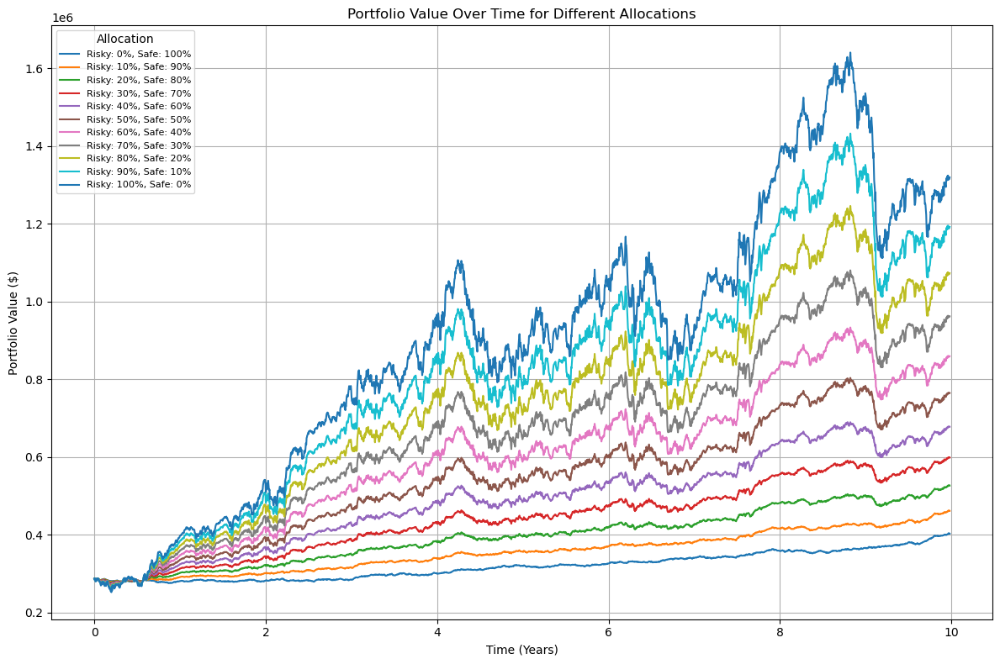

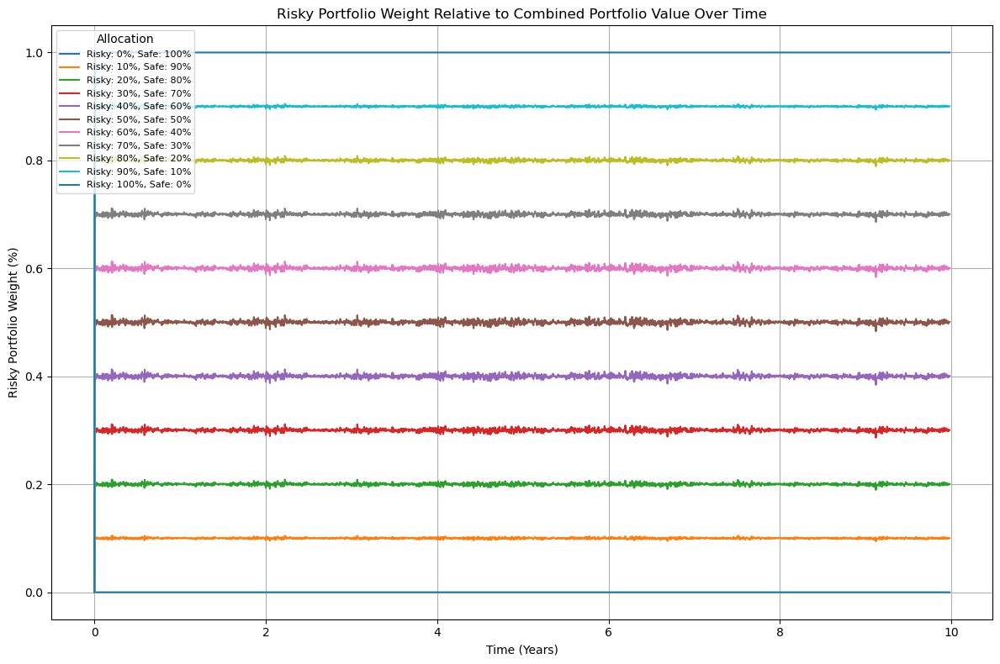

Final Portfolio Values for Different Allocations:
Risky: 0%, Safe: 100% -> Final Value: $402595.80
Risky: 10%, Safe: 90% -> Final Value: $461199.80
Risky: 20%, Safe: 80% -> Final Value: $526315.18
Risky: 30%, Safe: 70% -> Final Value: $598329.67
Risky: 40%, Safe: 60% -> Final Value: $677600.76
Risky: 50%, Safe: 50% -> Final Value: $764445.82
Risky: 60%, Safe: 40% -> Final Value: $859131.65
Risky: 70%, Safe: 30% -> Final Value: $961863.73
Risky: 80%, Safe: 20% -> Final Value: $1072775.30
Risky: 90%, Safe: 10% -> Final Value: $1191916.57
Risky: 100%, Safe: 0% -> Final Value: $1319244.38


In [791]:
savings = 25000
essential = 20000
aspirational = 50000

savings_pv = []
essential_pv = []
aspirational_pv = []

for i in range(10, 30):
    savings_pv.append(savings / ((1 + yields_today[i])**i))
    essential_pv.append(essential / ((1 + yields_today[i])**i))
    aspirational_pv.append(aspirational / ((1 + yields_today[i])**i))
    
# Total value of savings
total_value = sum(savings_pv)

# Define weight range
weights = np.arange(0.0, 1.1, 0.1)
portfolio_results = {}
weight_tracking = {}

n_days = simulated_safe_ret_daily.shape[0]

# Reshape the returns data to avoid nested loops
simulated_risky_ret_daily_array = simulated_risky_ret_daily.values
simulated_safe_ret_daily_array = simulated_safe_ret_daily.values

# Loop through each weight allocation
for risky_percentage in weights:
    safe_percentage = 1 - risky_percentage
    
    # Initialize portfolio values
    risky_portfolio_value = np.zeros((n_simulations, n_days))
    safe_portfolio_value = np.zeros((n_simulations, n_days))
    risky_weight = np.zeros((n_simulations, n_days))
    
    # Initial investments (scalars)
    risky_initial_investment = total_value * risky_percentage
    safe_initial_investment = total_value * safe_percentage
    
    # Assign initial values
    risky_portfolio_value[:, 0] = risky_initial_investment
    safe_portfolio_value[:, 0] = safe_initial_investment
    
    # Compute portfolio growth across all simulations at once
    for t in range(1, n_days):
        risky_portfolio_value[:, t] = risky_portfolio_value[:, t-1] * (1 + simulated_risky_ret_daily_array[t])
        safe_portfolio_value[:, t] = safe_portfolio_value[:, t-1] * (1 + simulated_safe_ret_daily_array[t])
        
        # Total portfolio value
        combined_portfolio_value = risky_portfolio_value[:, t] + safe_portfolio_value[:, t]
        
        # Weighting of risky asset
        risky_weight[:, t] = risky_portfolio_value[:, t] / combined_portfolio_value
        
        # Rebalancing to maintain fixed allocation
        risky_portfolio_value[:, t] = combined_portfolio_value * risky_percentage
        safe_portfolio_value[:, t] = combined_portfolio_value * safe_percentage
    
    # Store results for each allocation
    portfolio_results[risky_percentage] = risky_portfolio_value + safe_portfolio_value
    weight_tracking[risky_percentage] = risky_weight

# Time years for plotting
time_years = np.arange(0, n_days) / 252

# Plot portfolio values over time for different allocations
plt.figure(figsize=(12, 8))
for risky_percentage, combined_portfolio_value in portfolio_results.items():
    plt.plot(time_years, combined_portfolio_value[0], label=f"Risky: {risky_percentage*100:.0f}%, Safe: {(1-risky_percentage)*100:.0f}%")

plt.title("Portfolio Value Over Time for Different Allocations")
plt.xlabel("Time (Years)")
plt.ylabel("Portfolio Value ($)")
plt.grid(True)
plt.legend(title="Allocation", loc="upper left", fontsize=8)
plt.tight_layout()
plt.show()

# Plot risky portfolio weight over time
plt.figure(figsize=(12, 8))
for risky_percentage, risky_weight in weight_tracking.items():
    plt.plot(time_years, risky_weight[0], label=f"Risky: {risky_percentage*100:.0f}%, Safe: {(1-risky_percentage)*100:.0f}%")

plt.title("Risky Portfolio Weight Relative to Combined Portfolio Value Over Time")
plt.xlabel("Time (Years)")
plt.ylabel("Risky Portfolio Weight (%)")
plt.grid(True)
plt.legend(title="Allocation", loc="upper left", fontsize=8)
plt.tight_layout()
plt.show()

# Print final portfolio values
print("Final Portfolio Values for Different Allocations:")
for risky_percentage, combined_portfolio_value in portfolio_results.items():
    print(f"Risky: {risky_percentage*100:.0f}%, Safe: {(1-risky_percentage)*100:.0f}% -> Final Value: ${combined_portfolio_value[0, -1]:.2f}")

In [793]:
# Define fixed cash flows for different categories
savings_cashflows = 25000 * np.ones(20)  # 20 payments of 25,000 (savings)
essential_goals_cashflows = 20000 * np.ones(20)  # 20 payments of 20,000 (essential goals)
aspirational_goals_cashflows = 50000 * np.ones(20)  # 20 payments of 50,000 (aspirational goals)

num_cashflows = len(savings_cashflows)

num_simulations, num_days, num_maturities = P_t_T_all.shape  # Extract dimensions

# Define yearly maturities (original grid)
yearly_maturities = np.linspace(10, 30, num_maturities)  # Assuming maturities are equally spaced

# Pre-allocate PV array for savings, essential goals, and aspirational goals
savings_pv = np.zeros((num_simulations, num_days))
essential_goals_pv = np.zeros((num_simulations, num_days))
aspirational_goals_pv = np.zeros((num_simulations, num_days))

# Loop over each time step to interpolate and discount properly
for i in range(0, num_days):  
    # Compute decreasing daily maturities from 10 years minus i/252 (approx. daily step)
    daily_maturities = np.linspace(10 - i / 252, 30 - i / 252, num_cashflows)

    # Initialize arrays to store interpolated discount factors for each goal category
    interpolated_savings_discounts = np.zeros((num_simulations, num_cashflows))
    interpolated_essential_goals_discounts = np.zeros((num_simulations, num_cashflows))
    interpolated_aspirational_goals_discounts = np.zeros((num_simulations, num_cashflows))

    for sim in range(num_simulations):
        # Interpolation function for savings
        interpolator = interp1d(
            yearly_maturities,  # Original maturities
            P_t_T_all[sim, i, :],  # Discount factors for this sim & time
            kind='linear',  # Linear interpolation
            bounds_error=False,  # Avoid extrapolation
            fill_value="extrapolate"  # Optional: Prevents issues if extrapolation is needed
        )

        # Interpolate discount factors for each category of cash flow
        interpolated_savings_discounts[sim, :] = interpolator(daily_maturities)
        interpolated_essential_goals_discounts[sim, :] = interpolator(daily_maturities)
        interpolated_aspirational_goals_discounts[sim, :] = interpolator(daily_maturities)

    # Compute present values of cash flows for each category
    savings_pv[:, i] = np.sum(interpolated_savings_discounts * savings_cashflows, axis=1)
    essential_goals_pv[:, i] = np.sum(interpolated_essential_goals_discounts * essential_goals_cashflows, axis=1)
    aspirational_goals_pv[:, i] = np.sum(interpolated_aspirational_goals_discounts * aspirational_goals_cashflows, axis=1)

# Compute mean present values across simulations for each category
savings_pv_mean = savings_pv.mean(axis=0)
essential_goals_pv_mean = essential_goals_pv.mean(axis=0)
aspirational_goals_pv_mean = aspirational_goals_pv.mean(axis=0)

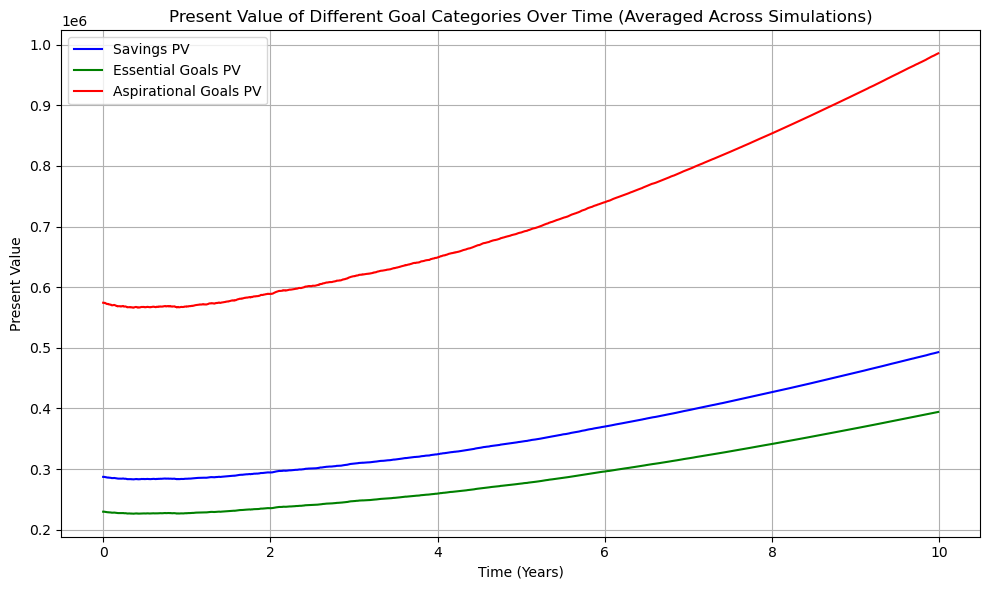

In [794]:
# Time axis in years
time_years = np.arange(num_days) / 252  # Convert days to years (assuming 252 trading days in a year)

# Plot results
plt.figure(figsize=(10, 6))
plt.plot(time_years, savings_pv_mean, label="Savings PV", color='blue')
plt.plot(time_years, essential_goals_pv_mean, label="Essential Goals PV", color='green')
plt.plot(time_years, aspirational_goals_pv_mean, label="Aspirational Goals PV", color='red')

plt.title("Present Value of Different Goal Categories Over Time (Averaged Across Simulations)")
plt.xlabel("Time (Years)")
plt.ylabel("Present Value")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

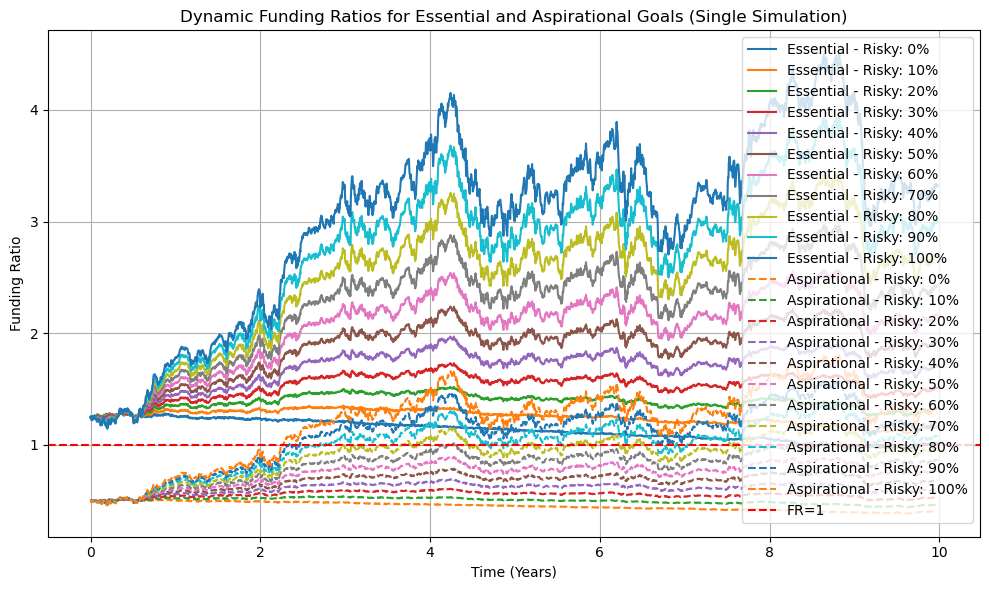

In [888]:
# Initialize dictionaries for funding ratios
funding_ratios_essential = {}
funding_ratios_aspirational = {}

funding_diff_essential = {}
funding_diff_aspirational = {}

# Ensure essential and aspirational PVs are 2D arrays
essential_pv = np.asarray(essential_goals_pv)  # Shape: (n_simulations, n_days)
aspirational_pv = np.asarray(aspirational_goals_pv)  # Shape: (n_simulations, n_days)

n_simulations, n_days = essential_pv.shape

# Compute funding ratios efficiently for each weight allocation
for risky_percentage in weights:
    # Extract and transpose portfolio values (Shape: (n_simulations, n_days))
    portfolio_value = portfolio_results[risky_percentage]

    # Ensure consistent length across arrays
    min_length = min(portfolio_value.shape[1], n_days)

    # Use NumPy broadcasting for efficient element-wise division
    funding_ratios_essential[risky_percentage] = portfolio_value[:, :min_length] / essential_pv[:, :min_length]
    funding_ratios_aspirational[risky_percentage] = portfolio_value[:, :min_length] / aspirational_pv[:, :min_length]

    funding_diff_essential[risky_percentage] = np.abs(portfolio_value[:, :min_length] - essential_pv[:, :min_length]) / essential_pv[:, :min_length]
    funding_diff_aspirational[risky_percentage] = np.abs(portfolio_value[:, :min_length] - aspirational_pv[:, :min_length]) / aspirational_pv[:, :min_length]

# Convert time to years
time_years = np.arange(min_length) / 252

# Choose a simulation index for visualization
simulation_index = 0  # Adjust index to view different simulations

# Plot funding ratios
plt.figure(figsize=(10, 6))

# Plot Essential Goal Funding Ratios
for risky_percentage, funding_ratio in funding_ratios_essential.items():
    plt.plot(time_years, funding_ratio[simulation_index, :], label=f"Essential - Risky: {risky_percentage*100:.0f}%")

# Plot Aspirational Goal Funding Ratios (Dashed Line Style)
for risky_percentage, funding_ratio in funding_ratios_aspirational.items():
    plt.plot(time_years, funding_ratio[simulation_index, :], linestyle='dashed', label=f"Aspirational - Risky: {risky_percentage*100:.0f}%")

# Formatting the plot
plt.title("Dynamic Funding Ratios for Essential and Aspirational Goals (Single Simulation)")
plt.xlabel("Time (Years)")
plt.ylabel("Funding Ratio")
plt.axhline(y=1, color='red', linestyle='--', label='FR=1')  # Reference line at FR=1
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

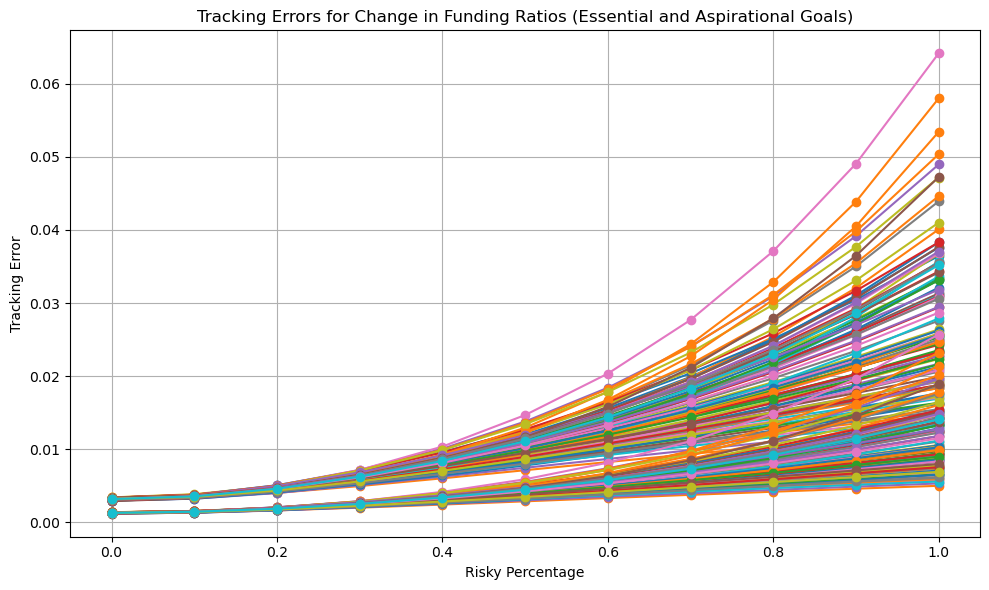

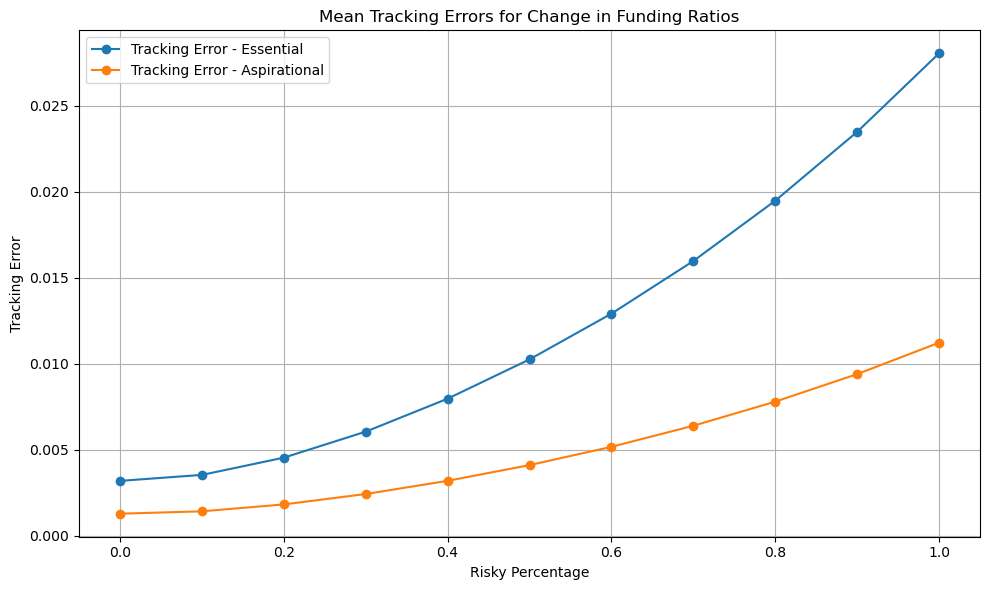

In [890]:
# Initialize dictionaries
tracking_errors_essential = {}
tracking_errors_aspirational = {}

# Compute tracking errors efficiently for each weight allocation
for risky_percentage in weights:
    # Compute funding ratio changes (returns)
    change_essential = np.diff(funding_ratios_essential[risky_percentage], axis=1)  # Shape (n_simulations, n_days - 1)
    change_aspirational = np.diff(funding_ratios_aspirational[risky_percentage], axis=1)
    
    # Compute tracking errors (std dev of changes)
    tracking_errors_essential[risky_percentage] = np.nanstd(change_essential, axis=1)  # Shape (n_simulations,)
    tracking_errors_aspirational[risky_percentage] = np.nanstd(change_aspirational, axis=1)

# Convert to lists for plotting
risk_levels = list(tracking_errors_essential.keys())

# Compute mean tracking errors for visualization
mean_te_essential = [np.mean(te) for te in tracking_errors_essential.values()]
mean_te_aspirational = [np.mean(te) for te in tracking_errors_aspirational.values()]

# Plot tracking errors
plt.figure(figsize=(10, 6))
plt.plot(list(tracking_errors_essential.keys()), [te for te in tracking_errors_essential.values()], label="Tracking Error - Essential", marker='o')
plt.plot(list(tracking_errors_aspirational.keys()), [te for te in tracking_errors_aspirational.values()], label="Tracking Error - Aspirational", marker='o')
plt.title("Tracking Errors for Change in Funding Ratios (Essential and Aspirational Goals)")
plt.xlabel("Risky Percentage")
plt.ylabel("Tracking Error")
plt.grid(True)
plt.tight_layout()
plt.show()

# Plot individual tracking errors per risky percentage
plt.figure(figsize=(10, 6))
plt.plot(risk_levels, mean_te_essential, label="Tracking Error - Essential", marker='o')
plt.plot(risk_levels, mean_te_aspirational, label="Tracking Error - Aspirational", marker='o')
plt.title("Mean Tracking Errors for Change in Funding Ratios")
plt.xlabel("Risky Percentage")
plt.ylabel("Tracking Error")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

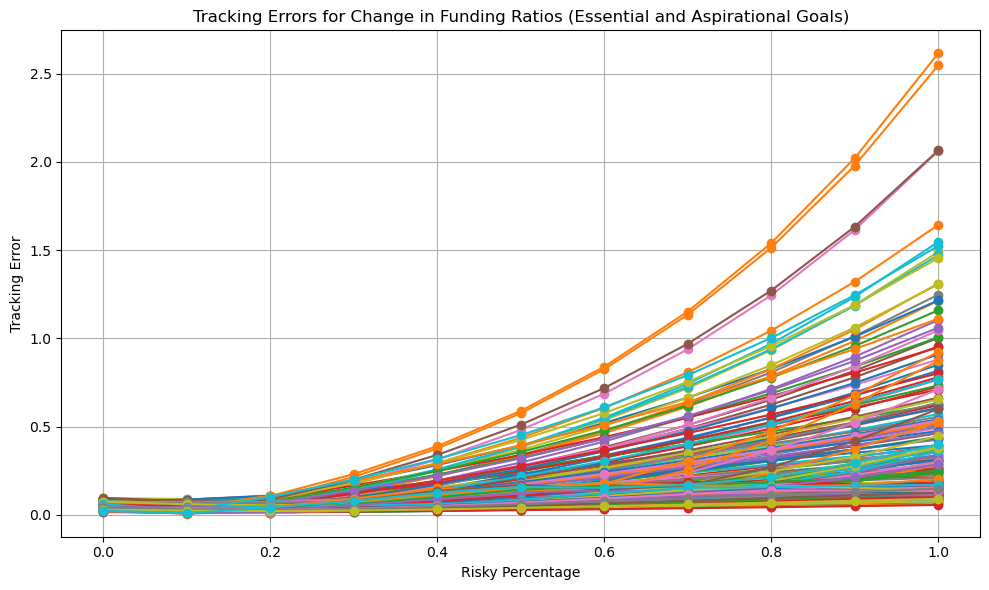

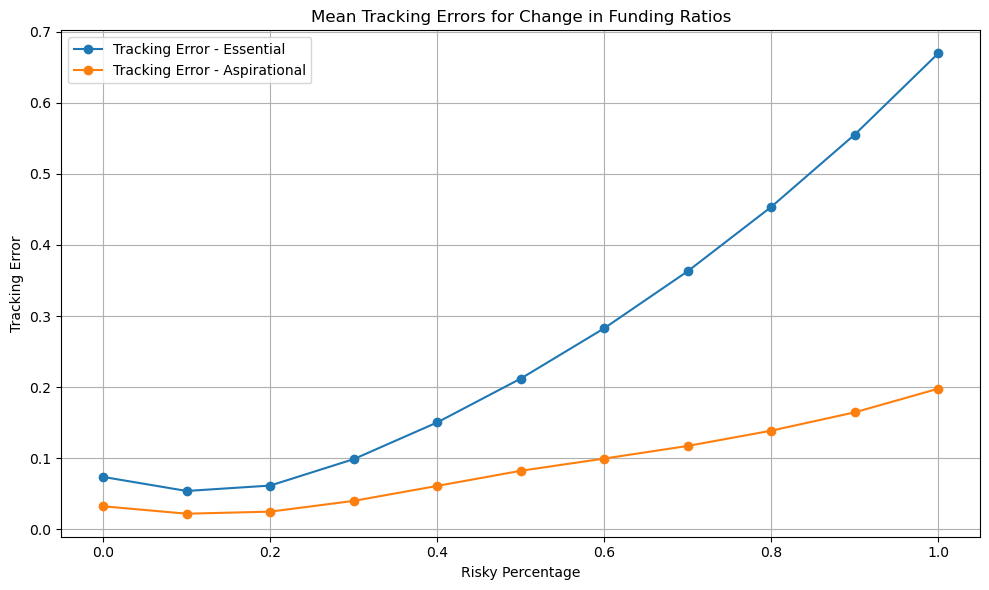

In [892]:
# Initialize dictionaries
tracking_errors_essential = {}
tracking_errors_aspirational = {}

# Compute tracking errors efficiently for each weight allocation
for risky_percentage in weights:
    
    change_essential = funding_diff_essential[risky_percentage]  # Shape (n_simulations, n_days - 1)
    change_aspirational = funding_diff_aspirational[risky_percentage]
    
    # Compute tracking errors (std dev of changes)
    tracking_errors_essential[risky_percentage] = np.nanstd(change_essential, axis=1)  # Shape (n_simulations,)
    tracking_errors_aspirational[risky_percentage] = np.nanstd(change_aspirational, axis=1)

# Convert to lists for plotting
risk_levels = list(tracking_errors_essential.keys())

# Compute mean tracking errors for visualization
mean_te_essential = [np.mean(te) for te in tracking_errors_essential.values()]
mean_te_aspirational = [np.mean(te) for te in tracking_errors_aspirational.values()]

# Plot tracking errors
plt.figure(figsize=(10, 6))
plt.plot(list(tracking_errors_essential.keys()), [te for te in tracking_errors_essential.values()], label="Tracking Error - Essential", marker='o')
plt.plot(list(tracking_errors_aspirational.keys()), [te for te in tracking_errors_aspirational.values()], label="Tracking Error - Aspirational", marker='o')
plt.title("Tracking Errors for Change in Funding Ratios (Essential and Aspirational Goals)")
plt.xlabel("Risky Percentage")
plt.ylabel("Tracking Error")
plt.grid(True)
plt.tight_layout()
plt.show()

# Plot individual tracking errors per risky percentage
plt.figure(figsize=(10, 6))
plt.plot(risk_levels, mean_te_essential, label="Tracking Error - Essential", marker='o')
plt.plot(risk_levels, mean_te_aspirational, label="Tracking Error - Aspirational", marker='o')
plt.title("Mean Tracking Errors for Change in Funding Ratios")
plt.xlabel("Risky Percentage")
plt.ylabel("Tracking Error")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

#### Old versions

In [778]:
# # Ensure total_value is a scalar
# total_value = np.sum(savings_pv)  

# # Define weight range
# weights = np.arange(0.0, 1.1, 0.1)
# portfolio_results = {}
# weight_tracking = {}

# n_days = simulated_safe_ret_daily.shape[0]

# # Loop through each simulation
# for sim in range(n_simulations):  
#     # Loop through each weight allocation
#     for risky_percentage in weights:
#         safe_percentage = 1 - risky_percentage
        
#         # Initialize portfolio values
#         risky_portfolio_value = np.zeros(n_days)
#         safe_portfolio_value = np.zeros(n_days)
#         risky_weight = np.zeros(n_days)
        
#         # Initial investments (scalars)
#         risky_initial_investment = total_value * risky_percentage
#         safe_initial_investment = total_value * safe_percentage
        
#         # Assign first values correctly
#         risky_portfolio_value[0] = risky_initial_investment  
#         safe_portfolio_value[0] = safe_initial_investment  
        
#         for t in range(1, n_days):
#             # Compute portfolio growth
#             risky_portfolio_value[t] = risky_portfolio_value[t-1] * (1 + simulated_risky_ret_daily.iloc[t, sim])
#             safe_portfolio_value[t] = safe_portfolio_value[t-1] * (1 + simulated_safe_ret_daily.iloc[t, sim])
            
#             # Total portfolio value
#             combined_portfolio_value = risky_portfolio_value[t] + safe_portfolio_value[t]
            
#             # Weighting of risky asset
#             risky_weight[t] = risky_portfolio_value[t] / combined_portfolio_value
            
#             # Rebalancing to maintain fixed allocation
#             risky_portfolio_value[t] = combined_portfolio_value * risky_percentage
#             safe_portfolio_value[t] = combined_portfolio_value * safe_percentage
        
#         # Store results uniquely for each simulation and allocation
#         portfolio_results[(sim, risky_percentage)] = risky_portfolio_value + safe_portfolio_value
#         weight_tracking[(sim, risky_percentage)] = risky_weight

# time_years = np.arange(0, n_days) / 252

# # Plot portfolio values over time for different allocations
# plt.figure(figsize=(12, 8))
# for (sim, risky_percentage), combined_portfolio_value in portfolio_results.items():
#     if sim == 0:  # Plot only one simulation for clarity
#         plt.plot(time_years, combined_portfolio_value, label=f"Risky: {risky_percentage*100:.0f}%, Safe: {(1-risky_percentage)*100:.0f}%")

# plt.title("Portfolio Value Over Time for Different Allocations")
# plt.xlabel("Time (Years)")
# plt.ylabel("Portfolio Value ($)")
# plt.grid(True)
# plt.legend(title="Allocation", loc="upper left", fontsize=8)
# plt.tight_layout()
# plt.show()

# # Plot risky portfolio weight over time
# plt.figure(figsize=(12, 8))
# for (sim, risky_percentage), risky_weight in weight_tracking.items():
#     if sim == 0:  # Plot only one simulation for clarity
#         plt.plot(time_years, risky_weight, label=f"Risky: {risky_percentage*100:.0f}%, Safe: {(1-risky_percentage)*100:.0f}%")

# plt.title("Risky Portfolio Weight Relative to Combined Portfolio Value Over Time")
# plt.xlabel("Time (Years)")
# plt.ylabel("Risky Portfolio Weight (%)")
# plt.grid(True)
# plt.legend(title="Allocation", loc="upper left", fontsize=8)
# plt.tight_layout()
# plt.show()

# # Print final portfolio values
# print("Final Portfolio Values for Different Allocations:")
# for (sim, risky_percentage), combined_portfolio_value in portfolio_results.items():
#     if sim == 0:  # Print only for one simulation
#         print(f"Risky: {risky_percentage*100:.0f}%, Safe: {(1-risky_percentage)*100:.0f}% -> Final Value: ${combined_portfolio_value[-1]:.2f}")


In [780]:
# funding_ratio_essential = []
# funding_ratio_aspirational = []

# # Iterate through all simulated paths in portfolio_results
# for key, portfolio_value in portfolio_results.items():  # key = (sim, risky_percentage)
#     min_length = min(len(portfolio_value), len(essential_pv), len(aspirational_pv))  # Align lengths
    
#     essential_ratio = np.array([portfolio_value[i] / essential_pv[i] for i in range(min_length)])
#     aspirational_ratio = np.array([portfolio_value[i] / aspirational_pv[i] for i in range(min_length)])
    
#     funding_ratio_essential.append(essential_ratio)
#     funding_ratio_aspirational.append(aspirational_ratio)

# # Convert lists to numpy arrays (each row is a path, columns are time steps)
# funding_ratio_essential = np.array(funding_ratio_essential)
# funding_ratio_aspirational = np.array(funding_ratio_aspirational)

# # Choose the simulation number
# sim_number = 2  # Change this to select a different simulation (e.g., 0, 1, 3, etc.)

# # Error handling for valid simulation selection
# num_simulations = funding_ratio_essential.shape[0]
# if sim_number >= num_simulations or sim_number < 0:
#     raise ValueError(f"Invalid simulation number. Choose between 0 and {num_simulations - 1}.")

# # Define time array
# time_years = np.arange(funding_ratio_essential[:10, sim_number, :].shape[0]) / 252  # Time steps match second dimension

# # Plot the selected simulation
# plt.figure(figsize=(10, 6))
# plt.plot(time_years, funding_ratio_essential[:10, sim_number, :], color='blue', label=f"Essential (Sim {sim_number})")
# plt.plot(time_years, funding_ratio_aspirational[:10, sim_number, :], color='red', label=f"Aspirational (Sim {sim_number})")

# plt.title(f"Dynamic Funding Ratios for Essential and Aspirational Goals (Simulation {sim_number})")
# plt.xlabel("Time (Years)")
# plt.ylabel("Funding Ratio")
# plt.grid(True)
# plt.legend()
# plt.tight_layout()
# plt.show()

In [782]:
# funding_ratios_essential = {}
# funding_ratios_aspirational = {}

# # Convert essential and aspirational PVs to 2D arrays if they are not already
# essential_pv = np.array(essential_pv)  # Shape (n_simulations, time)
# aspirational_pv = np.array(aspirational_pv)  # Shape (n_simulations, time)

# # Ensure the shape consistency
# n_simulations, n_days = essential_pv.shape

# # Loop through each weight allocation
# for risky_percentage in weights:
    
#     # Extract portfolio values for all simulations
#     portfolio_value = np.array(portfolio_results[risky_percentage])  # Shape (n_days, n_simulations)
#     portfolio_value = portfolio_value.T  # Now shape (n_simulations, n_days)
    
#     # Ensure the min length across all arrays
#     min_length = min(portfolio_value.shape[1], n_days)

#     # Compute funding ratios for all simulations at once
#     funding_ratio_essential = portfolio_value[:, :min_length] / essential_pv[:, :min_length]
#     funding_ratio_aspirational = portfolio_value[:, :min_length] / aspirational_pv[:, :min_length]

#     # Store in dictionary
#     funding_ratios_essential[risky_percentage] = funding_ratio_essential
#     funding_ratios_aspirational[risky_percentage] = funding_ratio_aspirational

# # Time in years
# time_years = np.arange(0, min_length) / 252

# # Select a specific simulation to plot
# simulation_index = 5  # Change this index to visualize different simulations

# # Plot funding ratios
# plt.figure(figsize=(10, 6))

# for risky_percentage, funding_ratio in funding_ratios_essential.items():
#     plt.plot(time_years, funding_ratio[simulation_index, :], label=f"Essential - Risky: {risky_percentage*100:.0f}%")

# for risky_percentage, funding_ratio in funding_ratios_aspirational.items():
#     plt.plot(time_years, funding_ratio[simulation_index, :], linestyle='dashed', label=f"Aspirational - Risky: {risky_percentage*100:.0f}%")

# plt.title("Dynamic Funding Ratios for Essential and Aspirational Goals (Single Simulation)")
# plt.xlabel("Time (Years)")
# plt.ylabel("Funding Ratio")
# plt.grid(True)
# plt.axhline(y=1, color='red', linestyle='--', label='FR=1')
# plt.legend()
# plt.tight_layout()
# plt.show()

#### Stop